Details given on project- Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.

Task of the Project- provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.

Steps followed to get the classification solution are given below- 

In [68]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy
from sklearn import *
import statsmodels.api as sm
import networkx as nx
import requests
from flask import Flask
import sqlalchemy
import pytest
import tkinter as tk
import openpyxl

Now that we have the basic list of packages and libraries, let's upload the csv into a dataframe using pandas and get a general outloook of the entire database.

In [69]:
import pandas as pd
path = 'C:\\Users\\ACHU NARAYAN\\Desktop\\dt\\assignment\\flip robo ds2306\\project evaluation phase\\WA_Fn-UseC_-HR-Employee-Attrition.csv'
attrition_data = pd.read_csv(path)
print(attrition_data)

      Age Attrition     BusinessTravel  DailyRate              Department  \
0      41       Yes      Travel_Rarely       1102                   Sales   
1      49        No  Travel_Frequently        279  Research & Development   
2      37       Yes      Travel_Rarely       1373  Research & Development   
3      33        No  Travel_Frequently       1392  Research & Development   
4      27        No      Travel_Rarely        591  Research & Development   
...   ...       ...                ...        ...                     ...   
1465   36        No  Travel_Frequently        884  Research & Development   
1466   39        No      Travel_Rarely        613  Research & Development   
1467   27        No      Travel_Rarely        155  Research & Development   
1468   49        No  Travel_Frequently       1023                   Sales   
1469   34        No      Travel_Rarely        628  Research & Development   

      DistanceFromHome  Education EducationField  EmployeeCount  \
0       

Below are the following details provided in the dataset-

        Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EmployeeCount', 'EmployeeNumber',
       'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel',
       'JobRole', 'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager', 'Attrition_No',
       'Attrition_Yes', 'OverTime_No', 'OverTime_Yes', 'Gender_Female',
       'Gender_Male', 'Over18_Y'

Let's get a closer look of the dataframe using the .head() command to get the first 30 values of the dataframe.

In [70]:
attrition_data.head(30)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
5,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,...,3,80,0,8,2,2,7,7,3,6
6,59,No,Travel_Rarely,1324,Research & Development,3,3,Medical,1,10,...,1,80,3,12,3,2,1,0,0,0
7,30,No,Travel_Rarely,1358,Research & Development,24,1,Life Sciences,1,11,...,2,80,1,1,2,3,1,0,0,0
8,38,No,Travel_Frequently,216,Research & Development,23,3,Life Sciences,1,12,...,2,80,0,10,2,3,9,7,1,8
9,36,No,Travel_Rarely,1299,Research & Development,27,3,Medical,1,13,...,2,80,2,17,3,2,7,7,7,7


Now let's get the laset 30 values of the dataframe using the .tail() command.

In [71]:
attrition_data.tail(30)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1440,36,No,Travel_Frequently,688,Research & Development,4,2,Life Sciences,1,2025,...,2,80,3,18,3,3,4,2,0,2
1441,56,No,Non-Travel,667,Research & Development,1,4,Life Sciences,1,2026,...,1,80,1,13,2,2,13,12,1,9
1442,29,Yes,Travel_Rarely,1092,Research & Development,1,4,Medical,1,2027,...,2,80,3,4,3,4,2,2,2,2
1443,42,No,Travel_Rarely,300,Research & Development,2,3,Life Sciences,1,2031,...,1,80,0,24,2,2,22,6,4,14
1444,56,Yes,Travel_Rarely,310,Research & Development,7,2,Technical Degree,1,2032,...,4,80,1,14,4,1,10,9,9,8
1445,41,No,Travel_Rarely,582,Research & Development,28,4,Life Sciences,1,2034,...,3,80,1,21,3,3,20,7,0,10
1446,34,No,Travel_Rarely,704,Sales,28,3,Marketing,1,2035,...,4,80,2,8,2,3,8,7,1,7
1447,36,No,Non-Travel,301,Sales,15,4,Marketing,1,2036,...,1,80,1,15,4,2,15,12,11,11
1448,41,No,Travel_Rarely,930,Sales,3,3,Life Sciences,1,2037,...,3,80,1,14,5,3,5,4,0,4
1449,32,No,Travel_Rarely,529,Research & Development,2,3,Technical Degree,1,2038,...,4,80,0,4,4,3,4,2,1,2


We will be label encoding the following coluumns-

BusinessTravel, Department, EducationField, MaritalStatus and JobRole.

In [72]:
from sklearn.preprocessing import LabelEncoder

In [73]:
label_encoder = LabelEncoder()
attrition_data['BusinessTravel'] = label_encoder.fit_transform(attrition_data['BusinessTravel'])
print(attrition_data)

      Age Attrition  BusinessTravel  DailyRate              Department  \
0      41       Yes               2       1102                   Sales   
1      49        No               1        279  Research & Development   
2      37       Yes               2       1373  Research & Development   
3      33        No               1       1392  Research & Development   
4      27        No               2        591  Research & Development   
...   ...       ...             ...        ...                     ...   
1465   36        No               1        884  Research & Development   
1466   39        No               2        613  Research & Development   
1467   27        No               2        155  Research & Development   
1468   49        No               1       1023                   Sales   
1469   34        No               2        628  Research & Development   

      DistanceFromHome  Education EducationField  EmployeeCount  \
0                    1          2  Life Scie

In [74]:
label_encoder = LabelEncoder()
attrition_data['Department'] = label_encoder.fit_transform(attrition_data['Department'])
print(attrition_data)

      Age Attrition  BusinessTravel  DailyRate  Department  DistanceFromHome  \
0      41       Yes               2       1102           2                 1   
1      49        No               1        279           1                 8   
2      37       Yes               2       1373           1                 2   
3      33        No               1       1392           1                 3   
4      27        No               2        591           1                 2   
...   ...       ...             ...        ...         ...               ...   
1465   36        No               1        884           1                23   
1466   39        No               2        613           1                 6   
1467   27        No               2        155           1                 4   
1468   49        No               1       1023           2                 2   
1469   34        No               2        628           1                 8   

      Education EducationField  Employe

In [75]:
label_encoder = LabelEncoder()
attrition_data['EducationField'] = label_encoder.fit_transform(attrition_data['EducationField'])
print(attrition_data)

      Age Attrition  BusinessTravel  DailyRate  Department  DistanceFromHome  \
0      41       Yes               2       1102           2                 1   
1      49        No               1        279           1                 8   
2      37       Yes               2       1373           1                 2   
3      33        No               1       1392           1                 3   
4      27        No               2        591           1                 2   
...   ...       ...             ...        ...         ...               ...   
1465   36        No               1        884           1                23   
1466   39        No               2        613           1                 6   
1467   27        No               2        155           1                 4   
1468   49        No               1       1023           2                 2   
1469   34        No               2        628           1                 8   

      Education  EducationField  Employ

In [76]:
label_encoder = LabelEncoder()
attrition_data['MaritalStatus'] = label_encoder.fit_transform(attrition_data['MaritalStatus'])
print(attrition_data)

      Age Attrition  BusinessTravel  DailyRate  Department  DistanceFromHome  \
0      41       Yes               2       1102           2                 1   
1      49        No               1        279           1                 8   
2      37       Yes               2       1373           1                 2   
3      33        No               1       1392           1                 3   
4      27        No               2        591           1                 2   
...   ...       ...             ...        ...         ...               ...   
1465   36        No               1        884           1                23   
1466   39        No               2        613           1                 6   
1467   27        No               2        155           1                 4   
1468   49        No               1       1023           2                 2   
1469   34        No               2        628           1                 8   

      Education  EducationField  Employ

In [77]:
label_encoder = LabelEncoder()
attrition_data['JobRole'] = label_encoder.fit_transform(attrition_data['JobRole'])
print(attrition_data)

      Age Attrition  BusinessTravel  DailyRate  Department  DistanceFromHome  \
0      41       Yes               2       1102           2                 1   
1      49        No               1        279           1                 8   
2      37       Yes               2       1373           1                 2   
3      33        No               1       1392           1                 3   
4      27        No               2        591           1                 2   
...   ...       ...             ...        ...         ...               ...   
1465   36        No               1        884           1                23   
1466   39        No               2        613           1                 6   
1467   27        No               2        155           1                 4   
1468   49        No               1       1023           2                 2   
1469   34        No               2        628           1                 8   

      Education  EducationField  Employ

Lets auto encode the following columns- Attrition', 'OverTime','Gender', and 'Over18'.

In [78]:
import pandas as pd
attrition_data_encoded = pd.get_dummies(attrition_data, columns=['Attrition', 'OverTime','Gender','Over18'])
print(attrition_data_encoded.head())

   Age  BusinessTravel  DailyRate  Department  DistanceFromHome  Education  \
0   41               2       1102           2                 1          2   
1   49               1        279           1                 8          1   
2   37               2       1373           1                 2          2   
3   33               1       1392           1                 3          4   
4   27               2        591           1                 2          1   

   EducationField  EmployeeCount  EmployeeNumber  EnvironmentSatisfaction  \
0               1              1               1                        2   
1               1              1               2                        3   
2               4              1               4                        4   
3               1              1               5                        4   
4               3              1               7                        1   

   ...  YearsInCurrentRole  YearsSinceLastPromotion  YearsWithCurrMa

Below are the list of all columns we have in the dataframe. 

In [79]:
attrition_data_encoded.columns

Index(['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EmployeeCount', 'EmployeeNumber',
       'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel',
       'JobRole', 'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome',
       'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike',
       'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager', 'Attrition_No',
       'Attrition_Yes', 'OverTime_No', 'OverTime_Yes', 'Gender_Female',
       'Gender_Male', 'Over18_Y'],
      dtype='object')

Let's look at the datatypes of the column in the dataframe.

In [80]:
attrition_data_encoded.dtypes


Age                         int64
BusinessTravel              int32
DailyRate                   int64
Department                  int32
DistanceFromHome            int64
Education                   int64
EducationField              int32
EmployeeCount               int64
EmployeeNumber              int64
EnvironmentSatisfaction     int64
HourlyRate                  int64
JobInvolvement              int64
JobLevel                    int64
JobRole                     int32
JobSatisfaction             int64
MaritalStatus               int32
MonthlyIncome               int64
MonthlyRate                 int64
NumCompaniesWorked          int64
PercentSalaryHike           int64
PerformanceRating           int64
RelationshipSatisfaction    int64
StandardHours               int64
StockOptionLevel            int64
TotalWorkingYears           int64
TrainingTimesLastYear       int64
WorkLifeBalance             int64
YearsAtCompany              int64
YearsInCurrentRole          int64
YearsSinceLast

 We dropping few columns as the data in them are redundant- 'OverTime_No','Over18_Y','Attrition_No' and 'Gender_Male'.

In [81]:
column_to_drop = ['OverTime_No','Over18_Y','Attrition_No']
attrition_data_encoded = attrition_data_encoded.drop(columns=column_to_drop)

In [90]:
column_to_drop = ['Gender_Male']
attrition_data_encoded = attrition_data_encoded.drop(columns=column_to_drop)

Since the data types of the columns are in int64, int32 and uint8 format, we will be converting them to float values using the .astype(float) command.

In [91]:
attrition_data_encoded.dtypes

Age                         int64
BusinessTravel              int32
DailyRate                   int64
Department                  int32
DistanceFromHome            int64
Education                   int64
EducationField              int32
EmployeeCount               int64
EmployeeNumber              int64
EnvironmentSatisfaction     int64
HourlyRate                  int64
JobInvolvement              int64
JobLevel                    int64
JobRole                     int32
JobSatisfaction             int64
MaritalStatus               int32
MonthlyIncome               int64
MonthlyRate                 int64
NumCompaniesWorked          int64
PercentSalaryHike           int64
PerformanceRating           int64
RelationshipSatisfaction    int64
StandardHours               int64
StockOptionLevel            int64
TotalWorkingYears           int64
TrainingTimesLastYear       int64
WorkLifeBalance             int64
YearsAtCompany              int64
YearsInCurrentRole          int64
YearsSinceLast

In [92]:
attrition_data_encoded['Age'] = attrition_data_encoded['Age'].astype(float)
attrition_data_encoded['BusinessTravel'] = attrition_data_encoded['BusinessTravel'].astype(float)
attrition_data_encoded['DailyRate'] = attrition_data_encoded['DailyRate'].astype(float)
attrition_data_encoded['Department'] = attrition_data_encoded['Department'].astype(float)
attrition_data_encoded['DistanceFromHome'] = attrition_data_encoded['DistanceFromHome'].astype(float)
attrition_data_encoded['Education'] = attrition_data_encoded['Education'].astype(float)
attrition_data_encoded['EducationField'] = attrition_data_encoded['EducationField'].astype(float)
attrition_data_encoded['EmployeeCount'] = attrition_data_encoded['EmployeeCount'].astype(float)
attrition_data_encoded['EmployeeNumber'] = attrition_data_encoded['EmployeeNumber'].astype(float)
attrition_data_encoded['EnvironmentSatisfaction'] = attrition_data_encoded['EnvironmentSatisfaction'].astype(float)
attrition_data_encoded['HourlyRate'] = attrition_data_encoded['HourlyRate'].astype(float)
attrition_data_encoded['JobInvolvement'] = attrition_data_encoded['JobInvolvement'].astype(float)
attrition_data_encoded['JobLevel'] = attrition_data_encoded['JobLevel'].astype(float)
attrition_data_encoded['JobRole'] = attrition_data_encoded['JobRole'].astype(float)
attrition_data_encoded['JobSatisfaction'] = attrition_data_encoded['JobSatisfaction'].astype(float)
attrition_data_encoded['MaritalStatus'] = attrition_data_encoded['MaritalStatus'].astype(float)
attrition_data_encoded['MonthlyIncome'] = attrition_data_encoded['MonthlyIncome'].astype(float)
attrition_data_encoded['MonthlyRate'] = attrition_data_encoded['MonthlyRate'].astype(float)
attrition_data_encoded['NumCompaniesWorked'] = attrition_data_encoded['NumCompaniesWorked'].astype(float)
attrition_data_encoded['PercentSalaryHike'] = attrition_data_encoded['PercentSalaryHike'].astype(float)
attrition_data_encoded['PerformanceRating'] = attrition_data_encoded['PerformanceRating'].astype(float)
attrition_data_encoded['RelationshipSatisfaction'] = attrition_data_encoded['RelationshipSatisfaction'].astype(float)
attrition_data_encoded['StandardHours'] = attrition_data_encoded['StandardHours'].astype(float)
attrition_data_encoded['StockOptionLevel'] = attrition_data_encoded['StockOptionLevel'].astype(float)
attrition_data_encoded['TotalWorkingYears'] = attrition_data_encoded['TotalWorkingYears'].astype(float)
attrition_data_encoded['TrainingTimesLastYear'] = attrition_data_encoded['TrainingTimesLastYear'].astype(float)
attrition_data_encoded['WorkLifeBalance'] = attrition_data_encoded['WorkLifeBalance'].astype(float)
attrition_data_encoded['YearsAtCompany'] = attrition_data_encoded['YearsAtCompany'].astype(float)
attrition_data_encoded['YearsInCurrentRole'] = attrition_data_encoded['YearsInCurrentRole'].astype(float)
attrition_data_encoded['YearsSinceLastPromotion'] = attrition_data_encoded['YearsSinceLastPromotion'].astype(float)
attrition_data_encoded['YearsWithCurrManager'] = attrition_data_encoded['YearsWithCurrManager'].astype(float)
attrition_data_encoded['Attrition_Yes'] = attrition_data_encoded['Attrition_Yes'].astype(float)
attrition_data_encoded['OverTime_Yes'] = attrition_data_encoded['OverTime_Yes'].astype(float)
attrition_data_encoded['Gender_Female'] = attrition_data_encoded['Gender_Female'].astype(float)

Let's check the datatypes of the columns again.

In [93]:
attrition_data_encoded.dtypes

Age                         float64
BusinessTravel              float64
DailyRate                   float64
Department                  float64
DistanceFromHome            float64
Education                   float64
EducationField              float64
EmployeeCount               float64
EmployeeNumber              float64
EnvironmentSatisfaction     float64
HourlyRate                  float64
JobInvolvement              float64
JobLevel                    float64
JobRole                     float64
JobSatisfaction             float64
MaritalStatus               float64
MonthlyIncome               float64
MonthlyRate                 float64
NumCompaniesWorked          float64
PercentSalaryHike           float64
PerformanceRating           float64
RelationshipSatisfaction    float64
StandardHours               float64
StockOptionLevel            float64
TotalWorkingYears           float64
TrainingTimesLastYear       float64
WorkLifeBalance             float64
YearsAtCompany              

In [83]:
attrition_data_encoded.head(30)

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,...,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition_Yes,OverTime_Yes,Gender_Female,Gender_Male
0,41,2,1102,2,1,2,1,1,1,2,...,0,1,6,4,0,5,1,1,1,0
1,49,1,279,1,8,1,1,1,2,3,...,3,3,10,7,1,7,0,0,0,1
2,37,2,1373,1,2,2,4,1,4,4,...,3,3,0,0,0,0,1,1,0,1
3,33,1,1392,1,3,4,1,1,5,4,...,3,3,8,7,3,0,0,1,1,0
4,27,2,591,1,2,1,3,1,7,1,...,3,3,2,2,2,2,0,0,0,1
5,32,1,1005,1,2,2,1,1,8,4,...,2,2,7,7,3,6,0,0,0,1
6,59,2,1324,1,3,3,3,1,10,3,...,3,2,1,0,0,0,0,1,1,0
7,30,2,1358,1,24,1,1,1,11,4,...,2,3,1,0,0,0,0,0,0,1
8,38,1,216,1,23,3,1,1,12,4,...,2,3,9,7,1,8,0,0,0,1
9,36,2,1299,1,27,3,3,1,13,3,...,3,2,7,7,7,7,0,0,0,1


Now lets declare the output column which is the 32nd column in our dataframe.

In [84]:
attrition_datayvariable_data= attrition_data_encoded.iloc[:, 31]

In [85]:
attrition_datayvariable_data

0       1
1       0
2       1
3       0
4       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition_Yes, Length: 1470, dtype: uint8

Now let's declare input variables of the column which are all the columns other than the 32ns column.

In [86]:
attrition_data_encodedxvariable = attrition_data_encoded.iloc[:, list(range(31)) + list(range(32, 35))]

In [87]:
attrition_data_encodedxvariable

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,...,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,OverTime_Yes,Gender_Female,Gender_Male
0,41,2,1102,2,1,2,1,1,1,2,...,8,0,1,6,4,0,5,1,1,0
1,49,1,279,1,8,1,1,1,2,3,...,10,3,3,10,7,1,7,0,0,1
2,37,2,1373,1,2,2,4,1,4,4,...,7,3,3,0,0,0,0,1,0,1
3,33,1,1392,1,3,4,1,1,5,4,...,8,3,3,8,7,3,0,1,1,0
4,27,2,591,1,2,1,3,1,7,1,...,6,3,3,2,2,2,2,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,1,884,1,23,2,3,1,2061,3,...,17,3,3,5,2,0,3,0,0,1
1466,39,2,613,1,6,1,3,1,2062,4,...,9,5,3,7,7,1,7,0,0,1
1467,27,2,155,1,4,3,1,1,2064,2,...,6,0,3,6,2,0,3,1,0,1
1468,49,1,1023,2,2,3,3,1,2065,4,...,17,3,2,9,6,0,8,0,0,1


Let's check the value counts of the output column in our dataframe.

In [88]:
attrition_data_counts = attrition_data_encoded['Attrition_Yes'].value_counts()
print(attrition_data_counts)

0    1233
1     237
Name: Attrition_Yes, dtype: int64


Now let's check the value counts of each of the column in our dataframe.

In [89]:
for i in attrition_data_encoded.columns:
    print(attrition_data_encoded[i].value_counts())
    print("/n")

35    78
34    77
36    69
31    69
29    68
32    61
30    60
33    58
38    58
40    57
37    50
27    48
28    48
42    46
39    42
45    41
41    40
26    39
44    33
46    33
43    32
50    30
25    26
24    26
49    24
47    24
55    22
51    19
53    19
48    19
54    18
52    18
22    16
56    14
23    14
58    14
21    13
20    11
59    10
19     9
18     8
60     5
57     4
Name: Age, dtype: int64
/n
2    1043
1     277
0     150
Name: BusinessTravel, dtype: int64
/n
691     6
408     5
530     5
1329    5
1082    5
       ..
650     1
279     1
316     1
314     1
628     1
Name: DailyRate, Length: 886, dtype: int64
/n
1    961
2    446
0     63
Name: Department, dtype: int64
/n
2     211
1     208
10     86
9      85
3      84
7      84
8      80
5      65
4      64
6      59
16     32
11     29
24     28
23     27
29     27
15     26
18     26
26     25
25     25
20     25
28     23
19     22
14     21
12     20
17     20
22     19
13     19
21     18
27     12
Name: Dista

Below are the following details( most occurences) we get from the above value counts-

1) 35-78 Age
2) 2-1043 Business Travel
3) 691-6 Daily Rate
4) 1-961 Department
5) 2-211 DistanceFromHome
6) 3-572 Education
7) 3-453 ENVIRONMENT SATISFACTION
8) 1-606 Education field
9) 66-29 Hourly rate
10) 1-543 Job Level
11) 7-326 Job Role
12) 4-459 Job Satisfaction
13) 1-673 Marital StATUS
14) 2342-4 Monthly Income
15) 4223-3 Monthly Rate
16) 1-521 NumCompanies Worked
17) 11-210 percent Salaryhike
18) 3-1244 Performance rating
19) 3-459 RELATIONSHIP sATISFACTION
20) 0-631 Stock Option Level
21) 10-202 TotalWorkingYears
22) 2-547 TrainingTimesLastYear
23) 3-893 WorkLifeBalance
24) 5-196 YearsAtCompany
25) 2-372 YearsInCurrentRole
27) 0-581 YearsSinceLastPromotion
28) 2-344 YearsWithCurrManager
29) 0-1233 Attrition_Yes
30) 0-1054 OverTime_Yes
31) 0-882 Gender_Female

Let's get some description from the dataframe

In [94]:
attrition_data_encoded_details = attrition_data_encoded.describe()
print(attrition_data_encoded_details)

               Age  BusinessTravel    DailyRate   Department  \
count  1470.000000     1470.000000  1470.000000  1470.000000   
mean     36.923810        1.607483   802.485714     1.260544   
std       9.135373        0.665455   403.509100     0.527792   
min      18.000000        0.000000   102.000000     0.000000   
25%      30.000000        1.000000   465.000000     1.000000   
50%      36.000000        2.000000   802.000000     1.000000   
75%      43.000000        2.000000  1157.000000     2.000000   
max      60.000000        2.000000  1499.000000     2.000000   

       DistanceFromHome    Education  EducationField  EmployeeCount  \
count       1470.000000  1470.000000     1470.000000         1470.0   
mean           9.192517     2.912925        2.247619            1.0   
std            8.106864     1.024165        1.331369            0.0   
min            1.000000     1.000000        0.000000            1.0   
25%            2.000000     2.000000        1.000000            1.0 

Since there are way too many rows, a lot of details are not presented in the tables above, so we need to do visualisations to get a closer look. The only conclusive statement we can get from the tables is that count of all the tables is 1470.000000.

Let's get some information from the dataframe using the .info method.

In [95]:
attrition_data_encoded_info = attrition_data_encoded.info
print(attrition_data_encoded_info)

<bound method DataFrame.info of        Age  BusinessTravel  DailyRate  Department  DistanceFromHome  \
0     41.0             2.0     1102.0         2.0               1.0   
1     49.0             1.0      279.0         1.0               8.0   
2     37.0             2.0     1373.0         1.0               2.0   
3     33.0             1.0     1392.0         1.0               3.0   
4     27.0             2.0      591.0         1.0               2.0   
...    ...             ...        ...         ...               ...   
1465  36.0             1.0      884.0         1.0              23.0   
1466  39.0             2.0      613.0         1.0               6.0   
1467  27.0             2.0      155.0         1.0               4.0   
1468  49.0             1.0     1023.0         2.0               2.0   
1469  34.0             2.0      628.0         1.0               8.0   

      Education  EducationField  EmployeeCount  EmployeeNumber  \
0           2.0             1.0            1.0   

Lets get the absolute values of our dataframe.

In [96]:
absolute_df = attrition_data_encoded.abs()
print(absolute_df)

       Age  BusinessTravel  DailyRate  Department  DistanceFromHome  \
0     41.0             2.0     1102.0         2.0               1.0   
1     49.0             1.0      279.0         1.0               8.0   
2     37.0             2.0     1373.0         1.0               2.0   
3     33.0             1.0     1392.0         1.0               3.0   
4     27.0             2.0      591.0         1.0               2.0   
...    ...             ...        ...         ...               ...   
1465  36.0             1.0      884.0         1.0              23.0   
1466  39.0             2.0      613.0         1.0               6.0   
1467  27.0             2.0      155.0         1.0               4.0   
1468  49.0             1.0     1023.0         2.0               2.0   
1469  34.0             2.0      628.0         1.0               8.0   

      Education  EducationField  EmployeeCount  EmployeeNumber  \
0           2.0             1.0            1.0             1.0   
1           1.0

Let's get the dimensions of the dataframe which should consists of 1470 rows and 34 columns.

In [97]:
attrition_data_encoded.shape

(1470, 34)

Let's check for null values in the dataframe.

In [99]:
attrition_data_encoded.isnull().sum().sum()

0

In [100]:
attrition_data_encoded.isnull().sum()

Age                         0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
Attrition_Yes               0
OverTime_Yes                0
Gender_Fem

We can see that there are zero null values in the dataframe, lets visualise it using a heatmap below.

<Axes: >

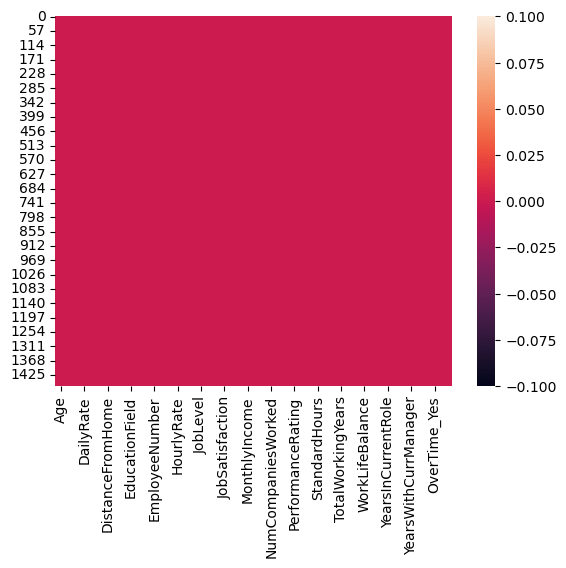

In [101]:
sns.heatmap(attrition_data_encoded.isnull())

Let's check for unique values in our output column

In [102]:
attrition_data_encoded['Attrition_Yes'].unique()

array([1., 0.])

In [103]:
attrition_data_encoded['Attrition_Yes'].nunique()

2

We can see that there are 2 unique values that is 1 and 0.

Lets declare all of the columns in the dataframe with float64 values.

In [145]:
attrition_data_col=[]
for i in attrition_data_encoded.dtypes.index:
    if attrition_data_encoded.dtypes[i] == 'float64':
        attrition_data_col.append(i)
print("attrition rate columns:", attrition_data_col)
print("/n")

attrition rate columns: ['Age', 'BusinessTravel', 'DailyRate', 'Department', 'DistanceFromHome', 'Education', 'EducationField', 'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'Attrition_Yes', 'OverTime_Yes', 'Gender_Female']
/n


Lets visualise all the columns in the dataframe that doesn't have null values.

In [105]:
attrition_data_encoded.loc[attrition_data_encoded["Attrition_Yes"]==""]

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,...,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition_Yes,OverTime_Yes,Gender_Female


Let's get the mean score of our target column.

In [106]:
print(attrition_data_encoded["Attrition_Yes"].mean())

0.16122448979591836


We get a mean score of 0.1612244897.

Lets check for all the unique values in each of the column in the dataframe.

In [107]:
attrition_data_encoded.nunique().to_frame("No. of Unique values")

,No. of Unique values
Age,43
BusinessTravel,3
DailyRate,886
Department,3
DistanceFromHome,29
Education,5
EducationField,6
EmployeeCount,1
EmployeeNumber,1470
EnvironmentSatisfaction,4


We can see that we can remove two columns EmployeeCount and StandardHours has a single unique values, which will be removed from the dataframe.

In [109]:
column_to_drop = ['EmployeeCount','StandardHours']
attrition_data_encoded = attrition_data_encoded.drop(columns=column_to_drop)

Let's check for duplicated rows in the dataframe.

In [108]:
print("Total duplicated rows:", attrition_data_encoded.duplicated().sum())

Total duplicated rows: 0


There are 0 duplicated rows in the dataframe.Let's again check for unique values to see all the column in the dataframe has more than 1 unique values.

In [110]:
attrition_data_encoded.nunique().to_frame("No. of Unique values")

,No. of Unique values
Age,43
BusinessTravel,3
DailyRate,886
Department,3
DistanceFromHome,29
Education,5
EducationField,6
EmployeeNumber,1470
EnvironmentSatisfaction,4
HourlyRate,71


All the columns in the dataframe has more than one unique values in their dataframe.

In [111]:
attrition_data_encoded.shape

(1470, 32)

The new shape of our dataframe is 1470 rows and 32 columns.

Univariate analysis

In [ ]:
Countplots

We will visualising the findings we had earlier in the dataframe.

1) 35-78 Age
2) 2-1043 Business Travel
3) 691-6 Daily Rate
4) 1-961 Department
5) 2-211 DistanceFromHome
6) 3-572 Education
7) 3-453 ENVIRONMENT SATISFACTION
8) 1-606 Education field
9) 66-29 Hourly rate
10) 1-543 Job Level
11) 7-326 Job Role
12) 4-459 Job Satisfaction
13) 1-673 Marital StATUS
14) 2342-4 Monthly Income
15) 4223-3 Monthly Rate
16) 1-521 NumCompanies Worked
17) 11-210 percent Salaryhike
18) 3-1244 Performance rating
19) 3-459 RELATIONSHIP sATISFACTION
20) 0-631 Stock Option Level
21) 10-202 TotalWorkingYears
22) 2-547 TrainingTimesLastYear
23) 3-893 WorkLifeBalance
24) 5-196 YearsAtCompany
25) 2-372 YearsInCurrentRole
27) 0-581 YearsSinceLastPromotion
28) 2-344 YearsWithCurrManager
29) 0-1233 Attrition_Yes
30) 0-1054 OverTime_Yes
31) 0-882 Gender_Female

35.0    78
34.0    77
36.0    69
31.0    69
29.0    68
32.0    61
30.0    60
33.0    58
38.0    58
40.0    57
37.0    50
27.0    48
28.0    48
42.0    46
39.0    42
45.0    41
41.0    40
26.0    39
44.0    33
46.0    33
43.0    32
50.0    30
25.0    26
24.0    26
49.0    24
47.0    24
55.0    22
51.0    19
53.0    19
48.0    19
54.0    18
52.0    18
22.0    16
56.0    14
23.0    14
58.0    14
21.0    13
20.0    11
59.0    10
19.0     9
18.0     8
60.0     5
57.0     4
Name: Age, dtype: int64


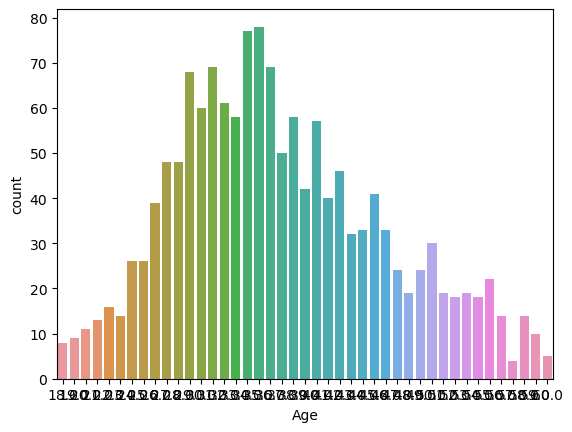

In [112]:
ac=sns.countplot(x='Age',data=attrition_data_encoded)
print(attrition_data_encoded['Age'].value_counts())

2.0    1043
1.0     277
0.0     150
Name: BusinessTravel, dtype: int64


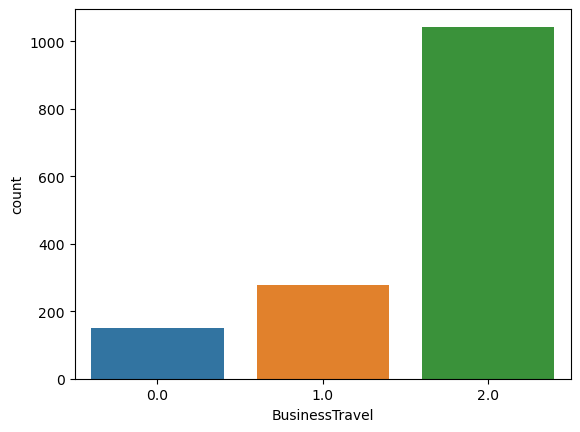

In [113]:
ac=sns.countplot(x='BusinessTravel',data=attrition_data_encoded)
print(attrition_data_encoded['BusinessTravel'].value_counts())

691.0     6
408.0     5
530.0     5
1329.0    5
1082.0    5
         ..
650.0     1
279.0     1
316.0     1
314.0     1
628.0     1
Name: DailyRate, Length: 886, dtype: int64


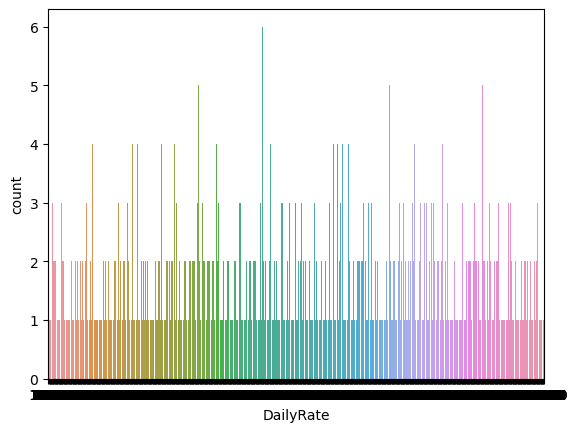

In [114]:
ac=sns.countplot(x='DailyRate',data=attrition_data_encoded)
print(attrition_data_encoded['DailyRate'].value_counts())

1.0    961
2.0    446
0.0     63
Name: Department, dtype: int64


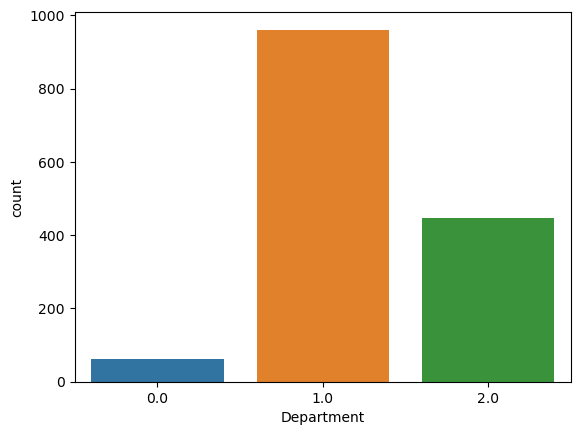

In [115]:
ac=sns.countplot(x='Department',data=attrition_data_encoded)
print(attrition_data_encoded['Department'].value_counts())

2.0     211
1.0     208
10.0     86
9.0      85
3.0      84
7.0      84
8.0      80
5.0      65
4.0      64
6.0      59
16.0     32
11.0     29
24.0     28
23.0     27
29.0     27
15.0     26
18.0     26
26.0     25
25.0     25
20.0     25
28.0     23
19.0     22
14.0     21
12.0     20
17.0     20
22.0     19
13.0     19
21.0     18
27.0     12
Name: DistanceFromHome, dtype: int64


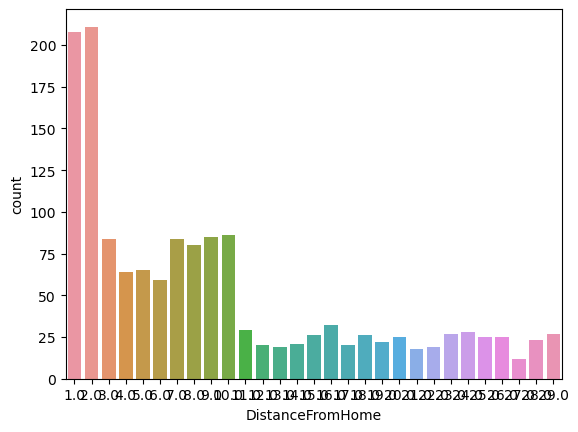

In [116]:
ac=sns.countplot(x='DistanceFromHome',data=attrition_data_encoded)
print(attrition_data_encoded['DistanceFromHome'].value_counts())

3.0    572
4.0    398
2.0    282
1.0    170
5.0     48
Name: Education, dtype: int64


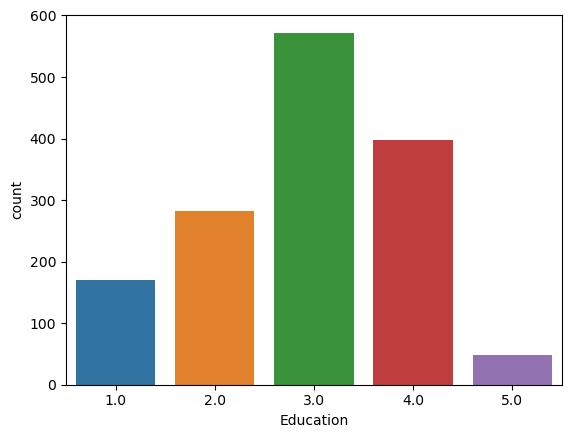

In [117]:
ac=sns.countplot(x='Education',data=attrition_data_encoded)
print(attrition_data_encoded['Education'].value_counts())

1.0    606
3.0    464
2.0    159
5.0    132
4.0     82
0.0     27
Name: EducationField, dtype: int64


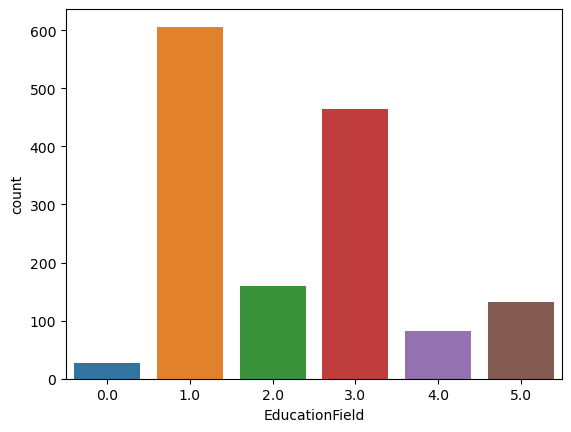

In [118]:
ac=sns.countplot(x='EducationField',data=attrition_data_encoded)
print(attrition_data_encoded['EducationField'].value_counts())

1.0       1
1391.0    1
1389.0    1
1387.0    1
1383.0    1
         ..
659.0     1
657.0     1
656.0     1
655.0     1
2068.0    1
Name: EmployeeNumber, Length: 1470, dtype: int64


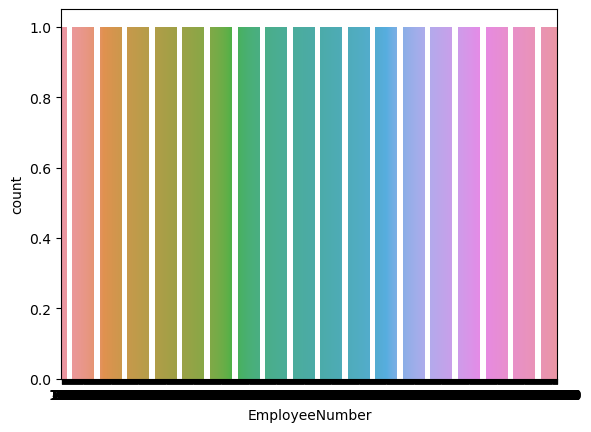

In [119]:
ac=sns.countplot(x='EmployeeNumber',data=attrition_data_encoded)
print(attrition_data_encoded['EmployeeNumber'].value_counts())

3.0    453
4.0    446
2.0    287
1.0    284
Name: EnvironmentSatisfaction, dtype: int64


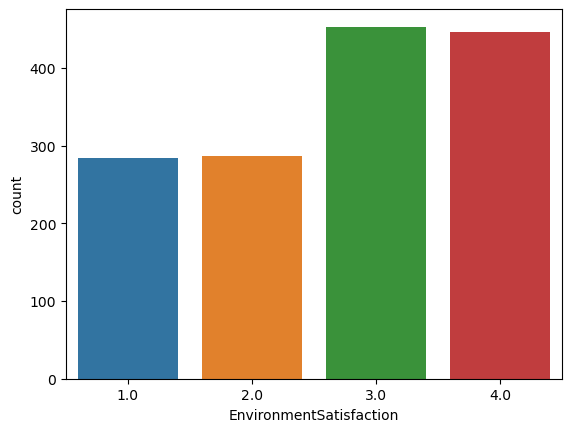

In [120]:
ac=sns.countplot(x='EnvironmentSatisfaction',data=attrition_data_encoded)
print(attrition_data_encoded['EnvironmentSatisfaction'].value_counts())

66.0    29
98.0    28
42.0    28
48.0    28
84.0    28
        ..
31.0    15
53.0    14
68.0    14
38.0    13
34.0    12
Name: HourlyRate, Length: 71, dtype: int64


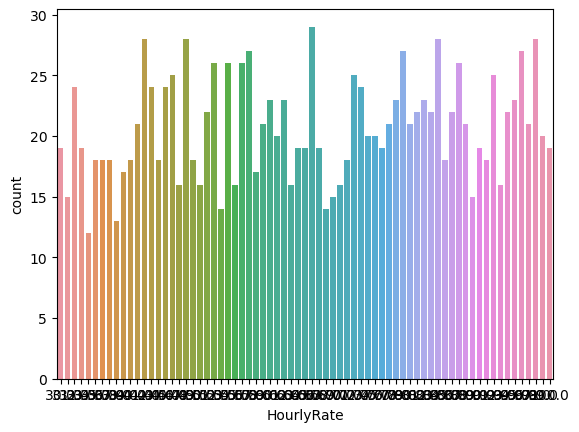

In [121]:
ac=sns.countplot(x='HourlyRate',data=attrition_data_encoded)
print(attrition_data_encoded['HourlyRate'].value_counts())

3.0    868
2.0    375
4.0    144
1.0     83
Name: JobInvolvement, dtype: int64


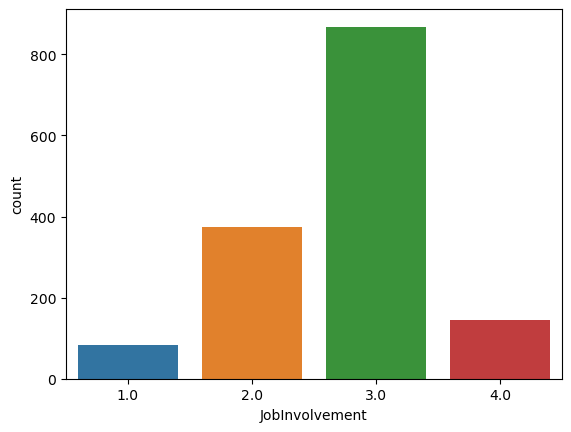

In [122]:
ac=sns.countplot(x='JobInvolvement',data=attrition_data_encoded)
print(attrition_data_encoded['JobInvolvement'].value_counts())

1.0    543
2.0    534
3.0    218
4.0    106
5.0     69
Name: JobLevel, dtype: int64


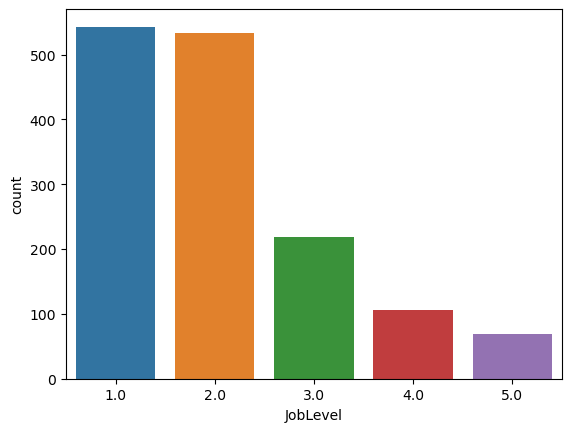

In [123]:
ac=sns.countplot(x='JobLevel',data=attrition_data_encoded)
print(attrition_data_encoded['JobLevel'].value_counts())

7.0    326
6.0    292
2.0    259
4.0    145
0.0    131
3.0    102
8.0     83
5.0     80
1.0     52
Name: JobRole, dtype: int64


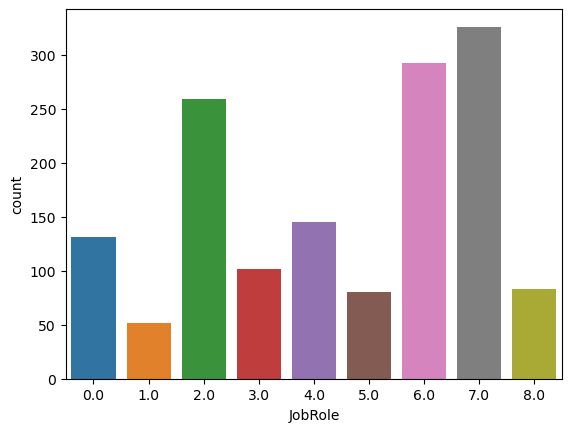

In [124]:
ac=sns.countplot(x='JobRole',data=attrition_data_encoded)
print(attrition_data_encoded['JobRole'].value_counts())

4.0    459
3.0    442
1.0    289
2.0    280
Name: JobSatisfaction, dtype: int64


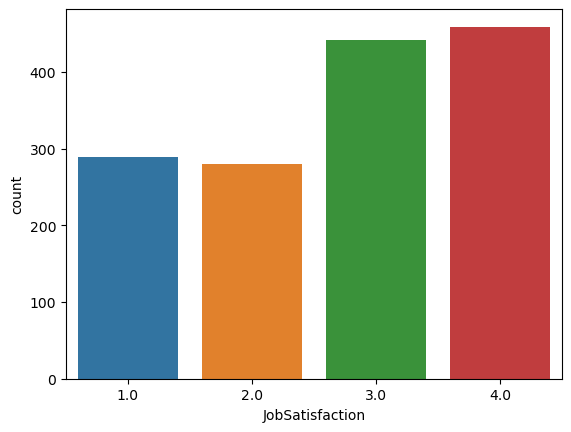

In [125]:
ac=sns.countplot(x='JobSatisfaction',data=attrition_data_encoded)
print(attrition_data_encoded['JobSatisfaction'].value_counts())

1.0    673
2.0    470
0.0    327
Name: MaritalStatus, dtype: int64


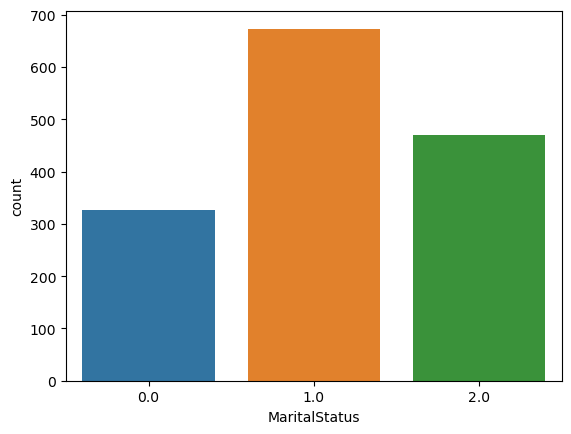

In [126]:
ac=sns.countplot(x='MaritalStatus',data=attrition_data_encoded)
print(attrition_data_encoded['MaritalStatus'].value_counts())

2342.0     4
6142.0     3
2741.0     3
2559.0     3
2610.0     3
          ..
7104.0     1
2773.0     1
19513.0    1
3447.0     1
4404.0     1
Name: MonthlyIncome, Length: 1349, dtype: int64


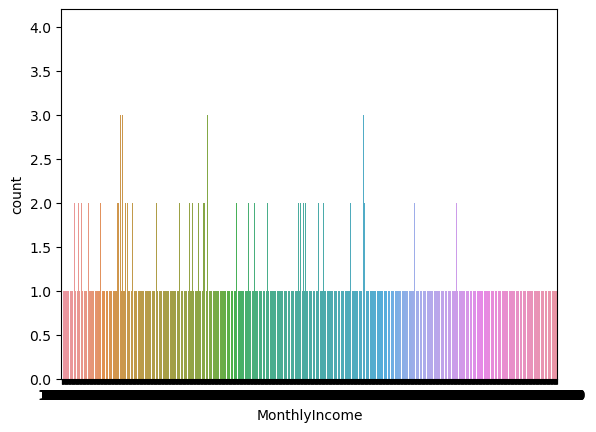

In [127]:
ac=sns.countplot(x='MonthlyIncome',data=attrition_data_encoded)
print(attrition_data_encoded['MonthlyIncome'].value_counts())

4223.0     3
9150.0     3
9558.0     2
12858.0    2
22074.0    2
          ..
14561.0    1
2671.0     1
5718.0     1
11757.0    1
10228.0    1
Name: MonthlyRate, Length: 1427, dtype: int64


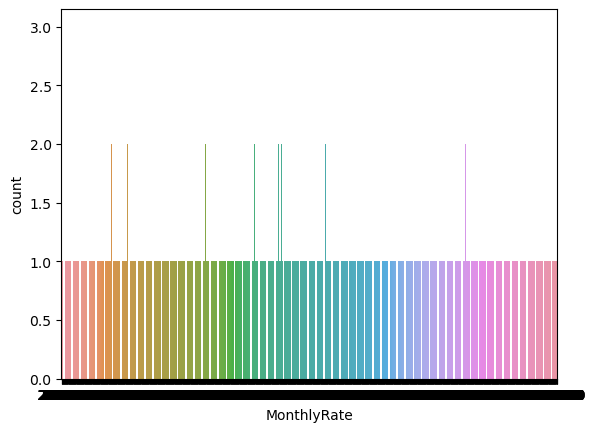

In [128]:
ac=sns.countplot(x='MonthlyRate',data=attrition_data_encoded)
print(attrition_data_encoded['MonthlyRate'].value_counts())

1.0    521
0.0    197
3.0    159
2.0    146
4.0    139
7.0     74
6.0     70
5.0     63
9.0     52
8.0     49
Name: NumCompaniesWorked, dtype: int64


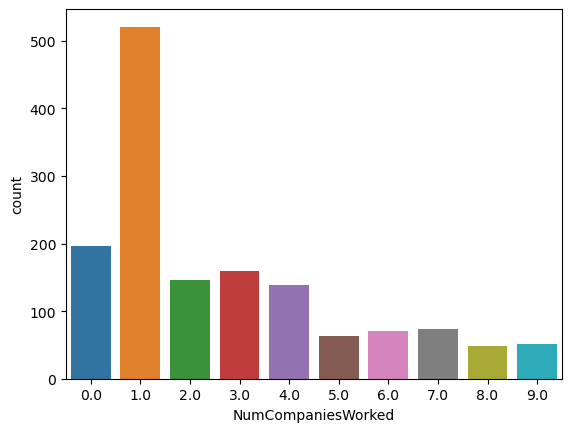

In [129]:
ac=sns.countplot(x='NumCompaniesWorked',data=attrition_data_encoded)
print(attrition_data_encoded['NumCompaniesWorked'].value_counts())

11.0    210
13.0    209
14.0    201
12.0    198
15.0    101
18.0     89
17.0     82
16.0     78
19.0     76
22.0     56
20.0     55
21.0     48
23.0     28
24.0     21
25.0     18
Name: PercentSalaryHike, dtype: int64


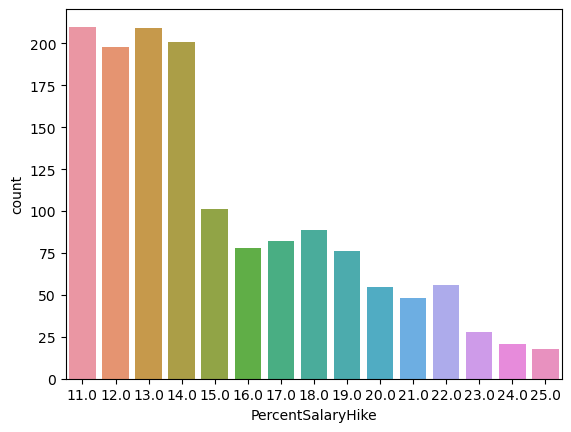

In [130]:
ac=sns.countplot(x='PercentSalaryHike',data=attrition_data_encoded)
print(attrition_data_encoded['PercentSalaryHike'].value_counts())

3.0    1244
4.0     226
Name: PerformanceRating, dtype: int64


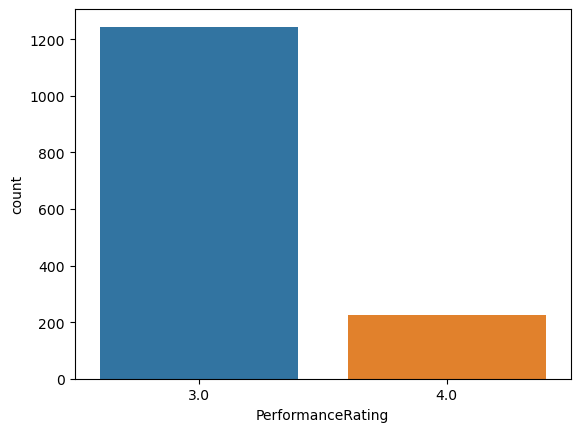

In [131]:
ac=sns.countplot(x='PerformanceRating',data=attrition_data_encoded)
print(attrition_data_encoded['PerformanceRating'].value_counts())

3.0    459
4.0    432
2.0    303
1.0    276
Name: RelationshipSatisfaction, dtype: int64


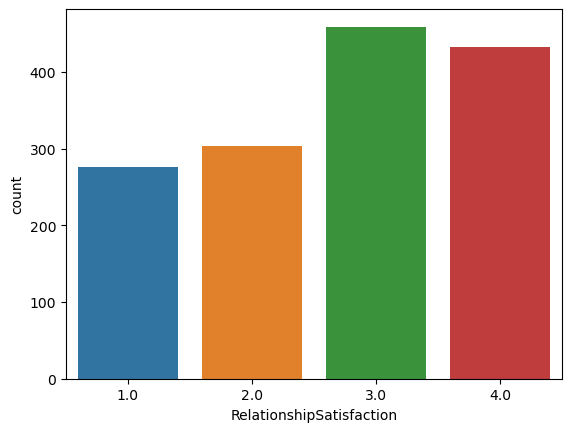

In [132]:
ac=sns.countplot(x='RelationshipSatisfaction',data=attrition_data_encoded)
print(attrition_data_encoded['RelationshipSatisfaction'].value_counts())

0.0    631
1.0    596
2.0    158
3.0     85
Name: StockOptionLevel, dtype: int64


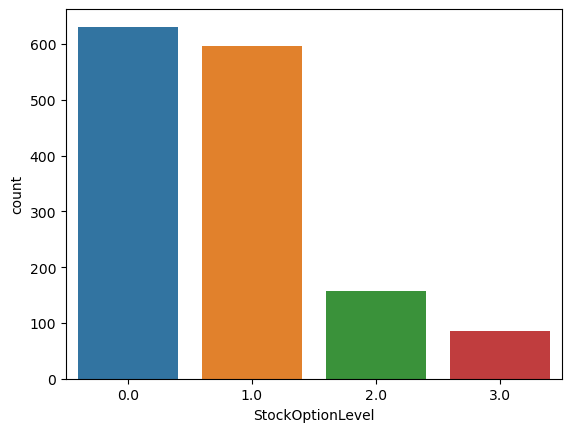

In [133]:
ac=sns.countplot(x='StockOptionLevel',data=attrition_data_encoded)
print(attrition_data_encoded['StockOptionLevel'].value_counts())

10.0    202
6.0     125
8.0     103
9.0      96
5.0      88
7.0      81
1.0      81
4.0      63
12.0     48
3.0      42
15.0     40
16.0     37
11.0     36
13.0     36
21.0     34
17.0     33
2.0      31
14.0     31
20.0     30
18.0     27
19.0     22
23.0     22
22.0     21
24.0     18
25.0     14
28.0     14
26.0     14
0.0      11
29.0     10
31.0      9
32.0      9
30.0      7
33.0      7
27.0      7
36.0      6
34.0      5
37.0      4
35.0      3
40.0      2
38.0      1
Name: TotalWorkingYears, dtype: int64


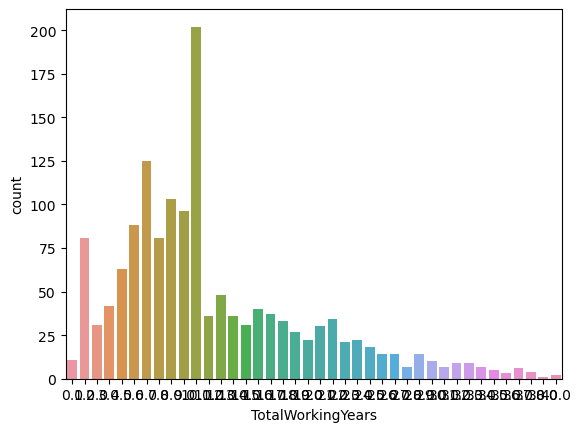

In [134]:
ac=sns.countplot(x='TotalWorkingYears',data=attrition_data_encoded)
print(attrition_data_encoded['TotalWorkingYears'].value_counts())

2.0    547
3.0    491
4.0    123
5.0    119
1.0     71
6.0     65
0.0     54
Name: TrainingTimesLastYear, dtype: int64


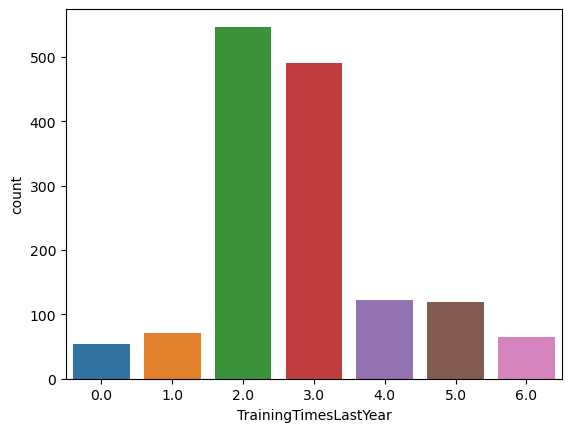

In [135]:
ac=sns.countplot(x='TrainingTimesLastYear',data=attrition_data_encoded)
print(attrition_data_encoded['TrainingTimesLastYear'].value_counts())

3.0    893
2.0    344
4.0    153
1.0     80
Name: WorkLifeBalance, dtype: int64


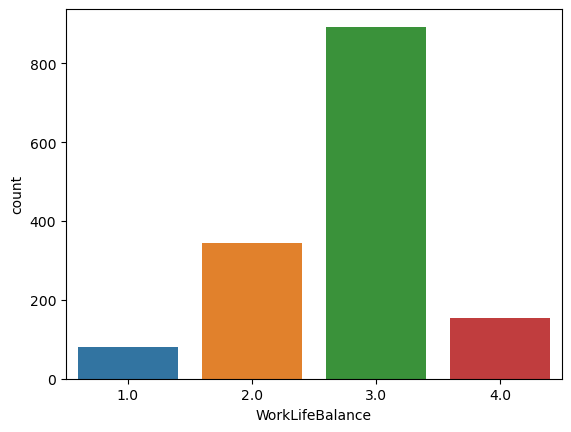

In [136]:
ac=sns.countplot(x='WorkLifeBalance',data=attrition_data_encoded)
print(attrition_data_encoded['WorkLifeBalance'].value_counts())

5.0     196
1.0     171
3.0     128
2.0     127
10.0    120
4.0     110
7.0      90
9.0      82
8.0      80
6.0      76
0.0      44
11.0     32
20.0     27
13.0     24
15.0     20
14.0     18
22.0     15
12.0     14
21.0     14
18.0     13
16.0     12
19.0     11
17.0      9
24.0      6
33.0      5
25.0      4
26.0      4
31.0      3
32.0      3
27.0      2
36.0      2
29.0      2
23.0      2
37.0      1
40.0      1
34.0      1
30.0      1
Name: YearsAtCompany, dtype: int64


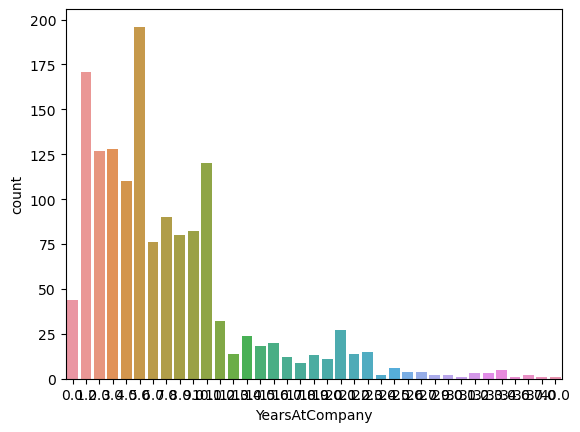

In [137]:
ac=sns.countplot(x='YearsAtCompany',data=attrition_data_encoded)
print(attrition_data_encoded['YearsAtCompany'].value_counts())

2.0     372
0.0     244
7.0     222
3.0     135
4.0     104
8.0      89
9.0      67
1.0      57
6.0      37
5.0      36
10.0     29
11.0     22
13.0     14
14.0     11
12.0     10
15.0      8
16.0      7
17.0      4
18.0      2
Name: YearsInCurrentRole, dtype: int64


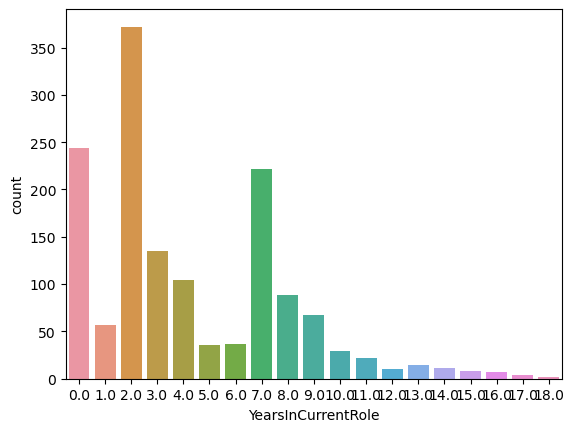

In [138]:
ac=sns.countplot(x='YearsInCurrentRole',data=attrition_data_encoded)
print(attrition_data_encoded['YearsInCurrentRole'].value_counts())

2.0     344
0.0     263
7.0     216
3.0     142
8.0     107
4.0      98
1.0      76
9.0      64
5.0      31
6.0      29
10.0     27
11.0     22
12.0     18
13.0     14
17.0      7
15.0      5
14.0      5
16.0      2
Name: YearsWithCurrManager, dtype: int64


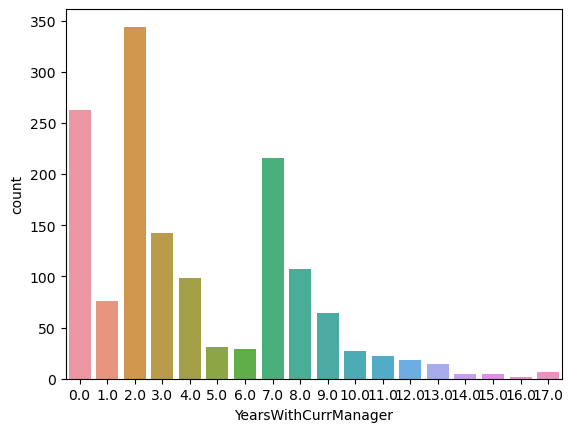

In [139]:
ac=sns.countplot(x='YearsWithCurrManager',data=attrition_data_encoded)
print(attrition_data_encoded['YearsWithCurrManager'].value_counts())

0.0     581
1.0     357
2.0     159
7.0      76
4.0      61
3.0      52
5.0      45
6.0      32
11.0     24
8.0      18
9.0      17
15.0     13
13.0     10
12.0     10
14.0      9
10.0      6
Name: YearsSinceLastPromotion, dtype: int64


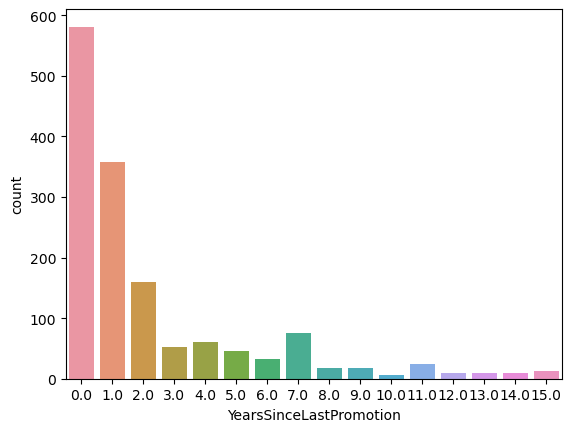

In [140]:
ac=sns.countplot(x='YearsSinceLastPromotion',data=attrition_data_encoded)
print(attrition_data_encoded['YearsSinceLastPromotion'].value_counts())

0.0    1233
1.0     237
Name: Attrition_Yes, dtype: int64


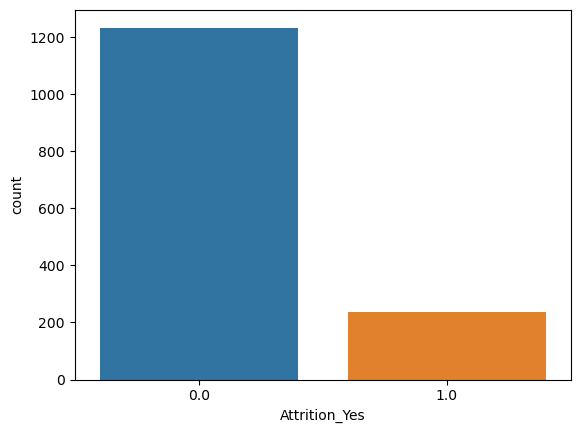

In [141]:
ac=sns.countplot(x='Attrition_Yes',data=attrition_data_encoded)
print(attrition_data_encoded['Attrition_Yes'].value_counts())

0.0    1054
1.0     416
Name: OverTime_Yes, dtype: int64


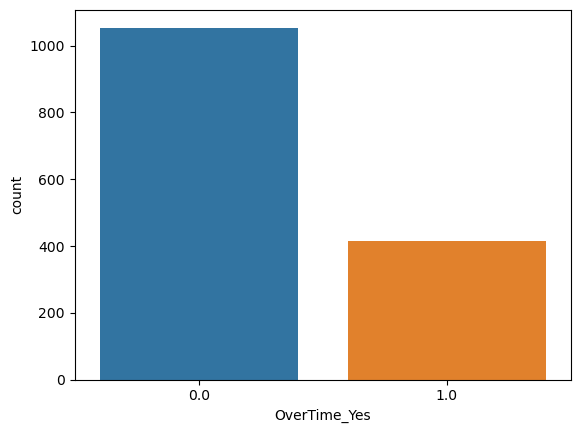

In [142]:
ac=sns.countplot(x='OverTime_Yes',data=attrition_data_encoded)
print(attrition_data_encoded['OverTime_Yes'].value_counts())

0.0    882
1.0    588
Name: Gender_Female, dtype: int64


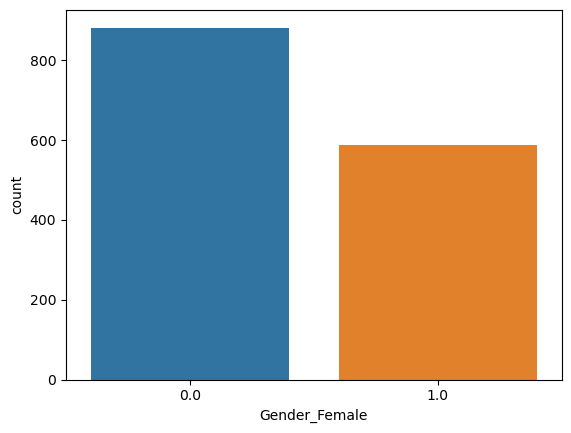

In [143]:
ac=sns.countplot(x='Gender_Female',data=attrition_data_encoded)
print(attrition_data_encoded['Gender_Female'].value_counts())

Distribution Plots

C:\Users\ACHU NARAYAN\AppData\Local\Temp\ipykernel_3404\1020322970.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(attrition_data_encoded[col],color="b")
C:\Users\ACHU NARAYAN\AppData\Local\Temp\ipykernel_3404\1020322970.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(attrition_data_enco

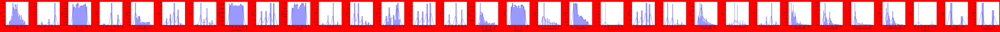

In [147]:
plt.figure(figsize=(145,145),facecolor = "red")
plotnumber=1
for col in attrition_data_col:
    if plotnumber<=34:
        wc=plt.subplot(33,33,plotnumber)
        sns.distplot(attrition_data_encoded[col],color="b")
        plt.xlabel(col,rotation=0,fontsize = 13)
        plt.xticks(rotation=90, fontsize=13)
        plt.yticks(rotation = 0, fontsize = 13)
    plotnumber+=1
plt.tight_layout()

Below are the following details we can get from the above plots-

1) Age column has somewhat a normal distribution
2) Businees travel column in highly skewed to thr right.
3) Monthly rate is almost normally distributed.
4) Department column has skewnes to the right and left as well.
5) DISTANCEFROMHOME skewness has skewness to the left.
6) Employee number has a normal distribution
7) Envirnonment satisfaction has skewness to the right.
8) Hourly rate is normally distributed
9) Job involvement has skewness to the right
10) Job level has a skewness to the left.
11) Job role has a skewness to the right
12) Job satisfaction has a skewness to the right.
13) Marital Status has skewness both to the left and right.
14) Monthly Income has a skewness to the left.
15) Monthly rate has a normal distribution
16) Numcompaniesworked and percent salaryhike has a skewness to the left.
17) Performance rating has a skewness to the left.
18) Relationship satisfaction has a skewness to the right
20) Stockoptionlevel and total working years is skewed to the left.
21) Training times last year has somehwat normal distribution
22) Work life balance has skewness to the right
23) yearsatcompany, yearsin current role, years since last promotion, years with curr manager,attrition yes, overtime yes and gender female  has skewness to the left

Bivariate analysis

Strip plots

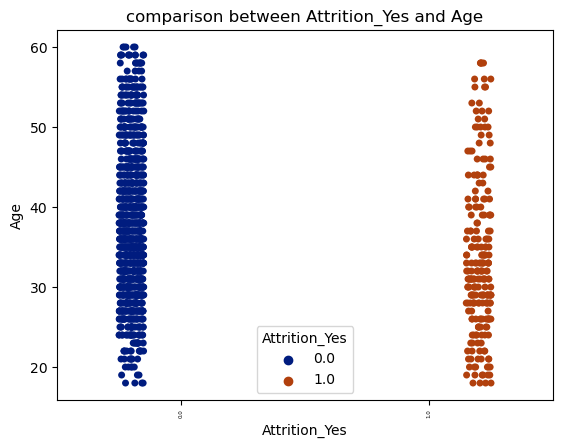

<Figure size 2800x200 with 0 Axes>

In [148]:
plt.title("comparison between Attrition_Yes and Age")
sns.stripplot(x= "Attrition_Yes", y= "Age", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

Most of the employees who did not go through attrition has a higher percentage of older people than the ones who did.

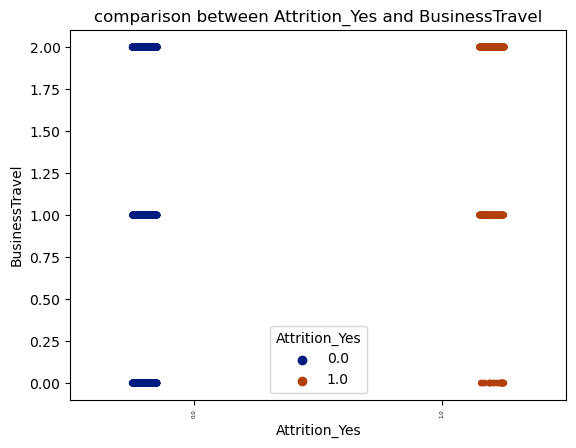

<Figure size 2800x200 with 0 Axes>

In [149]:
plt.title("comparison between Attrition_Yes and BusinessTravel")
sns.stripplot(x= "Attrition_Yes", y= "BusinessTravel", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

No conclusive statements can be made from the above plot.

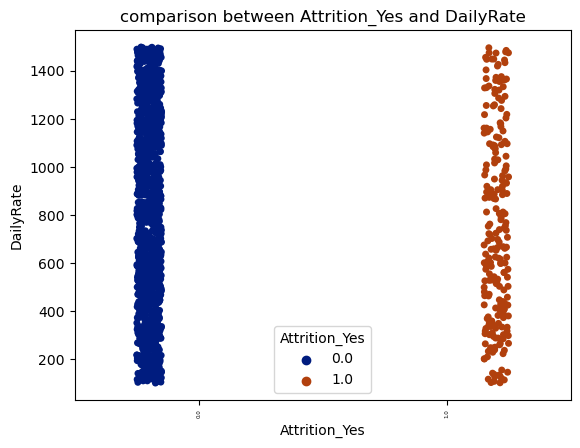

<Figure size 2800x200 with 0 Axes>

In [150]:
plt.title("comparison between Attrition_Yes and DailyRate")
sns.stripplot(x= "Attrition_Yes", y= "DailyRate", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

Most of the employess who went through attrition had similar daily rate as the one who went through attrition.

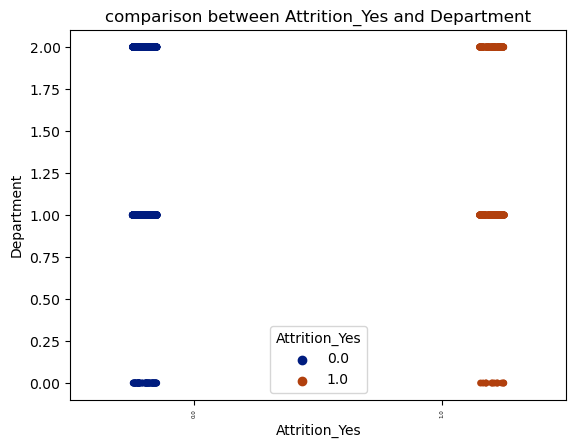

<Figure size 2800x200 with 0 Axes>

In [151]:
plt.title("comparison between Attrition_Yes and Department")
sns.stripplot(x= "Attrition_Yes", y= "Department", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

No conclusive statements can be made from the above plot.

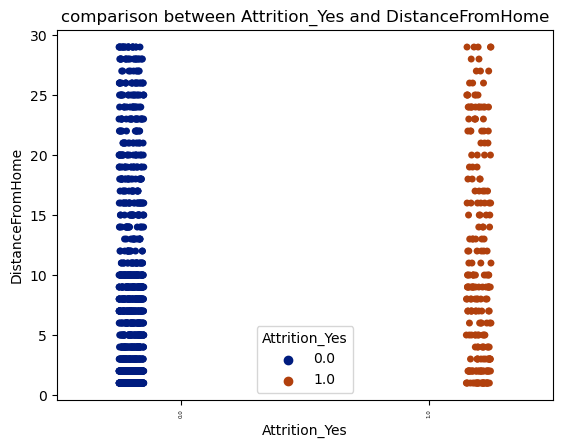

<Figure size 2800x200 with 0 Axes>

In [152]:
plt.title("comparison between Attrition_Yes and DistanceFromHome")
sns.stripplot(x= "Attrition_Yes", y= "DistanceFromHome", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

Just like the above plots, most of the plots below in strip plots section doesn't provide any deeper insight from the representation.

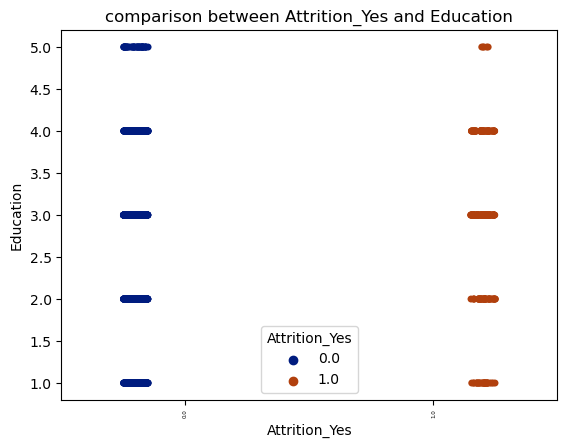

<Figure size 2800x200 with 0 Axes>

In [153]:
plt.title("comparison between Attrition_Yes and Education")
sns.stripplot(x= "Attrition_Yes", y= "Education", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

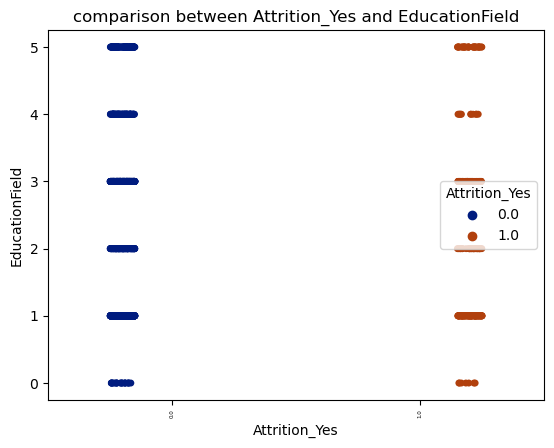

<Figure size 2800x200 with 0 Axes>

In [154]:
plt.title("comparison between Attrition_Yes and EducationField")
sns.stripplot(x= "Attrition_Yes", y= "EducationField", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

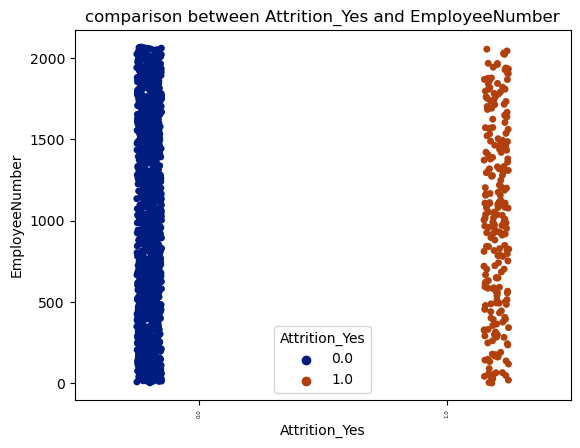

<Figure size 2800x200 with 0 Axes>

In [155]:
plt.title("comparison between Attrition_Yes and EmployeeNumber")
sns.stripplot(x= "Attrition_Yes", y= "EmployeeNumber", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

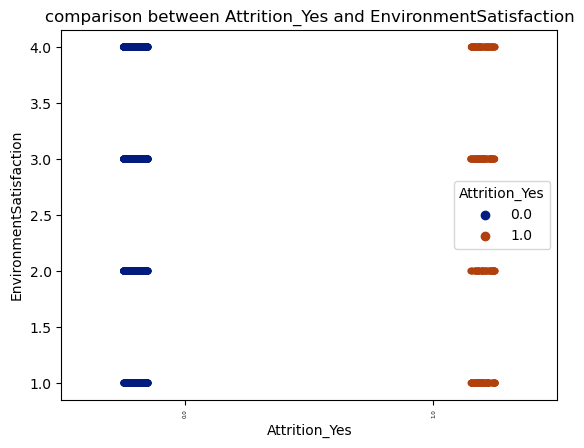

<Figure size 2800x200 with 0 Axes>

In [156]:
plt.title("comparison between Attrition_Yes and EnvironmentSatisfaction")
sns.stripplot(x= "Attrition_Yes", y= "EnvironmentSatisfaction", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

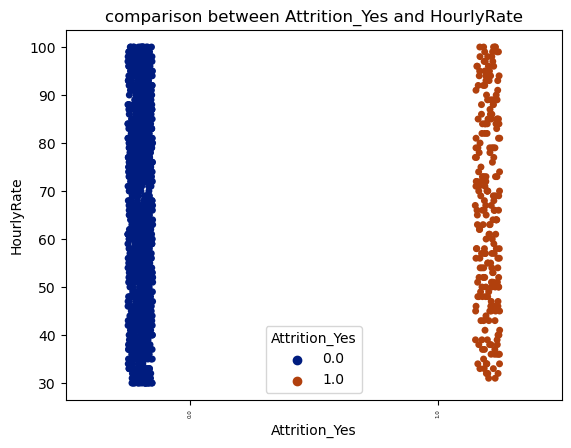

<Figure size 2800x200 with 0 Axes>

In [157]:
plt.title("comparison between Attrition_Yes and HourlyRate")
sns.stripplot(x= "Attrition_Yes", y= "HourlyRate", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

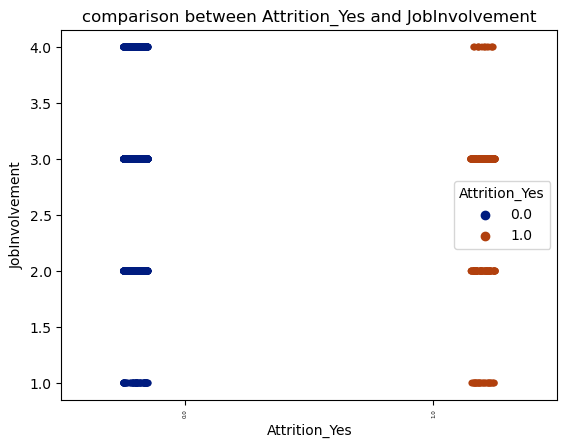

<Figure size 2800x200 with 0 Axes>

In [158]:
plt.title("comparison between Attrition_Yes and JobInvolvement")
sns.stripplot(x= "Attrition_Yes", y= "JobInvolvement", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

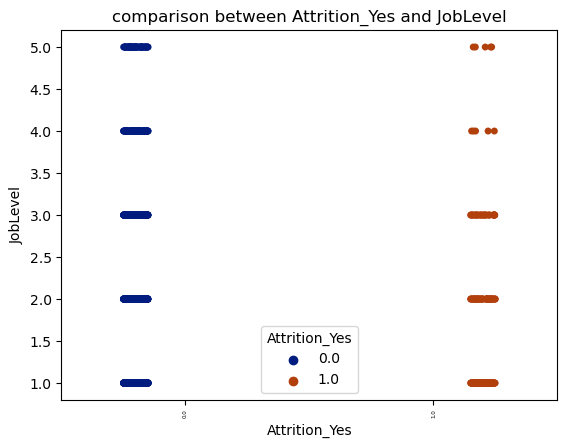

<Figure size 2800x200 with 0 Axes>

In [159]:
plt.title("comparison between Attrition_Yes and JobLevel")
sns.stripplot(x= "Attrition_Yes", y= "JobLevel", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

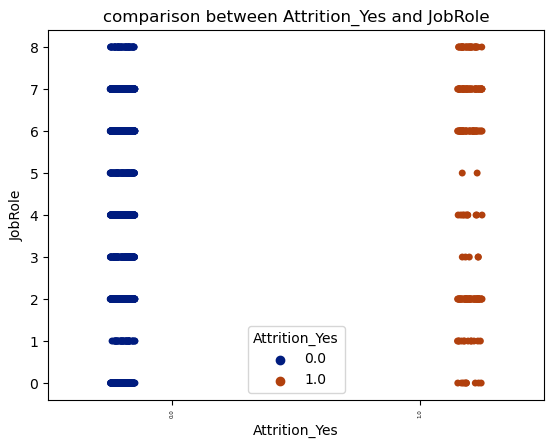

<Figure size 2800x200 with 0 Axes>

In [160]:
plt.title("comparison between Attrition_Yes and JobRole")
sns.stripplot(x= "Attrition_Yes", y= "JobRole", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

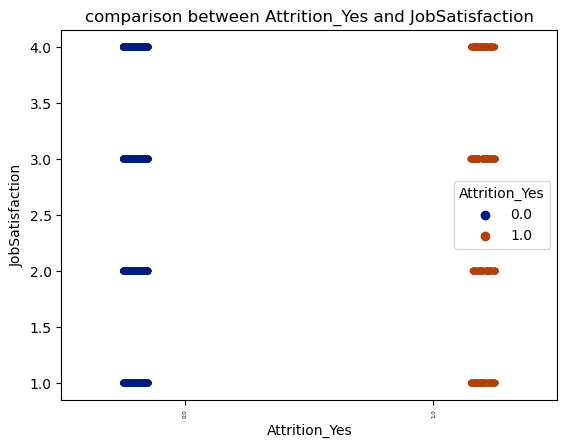

<Figure size 2800x200 with 0 Axes>

In [161]:
plt.title("comparison between Attrition_Yes and JobSatisfaction")
sns.stripplot(x= "Attrition_Yes", y= "JobSatisfaction", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

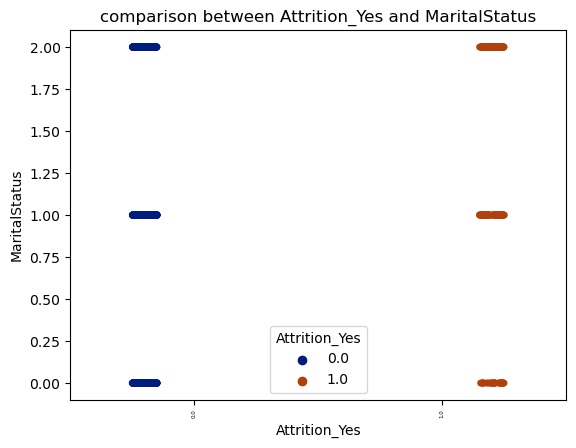

<Figure size 2800x200 with 0 Axes>

In [162]:
plt.title("comparison between Attrition_Yes and MaritalStatus")
sns.stripplot(x= "Attrition_Yes", y= "MaritalStatus", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

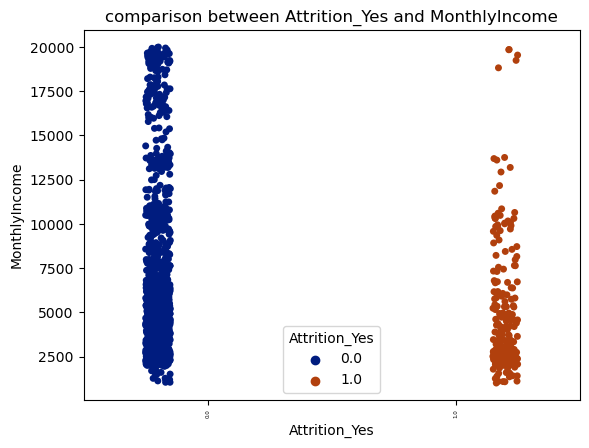

<Figure size 2800x200 with 0 Axes>

In [163]:
plt.title("comparison between Attrition_Yes and MonthlyIncome")
sns.stripplot(x= "Attrition_Yes", y= "MonthlyIncome", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

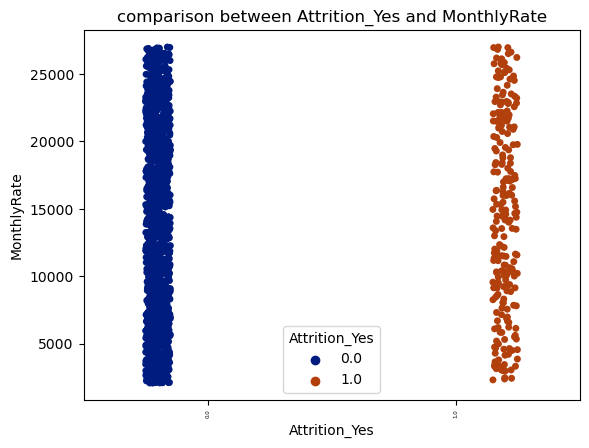

<Figure size 2800x200 with 0 Axes>

In [164]:
plt.title("comparison between Attrition_Yes and MonthlyRate")
sns.stripplot(x= "Attrition_Yes", y= "MonthlyRate", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

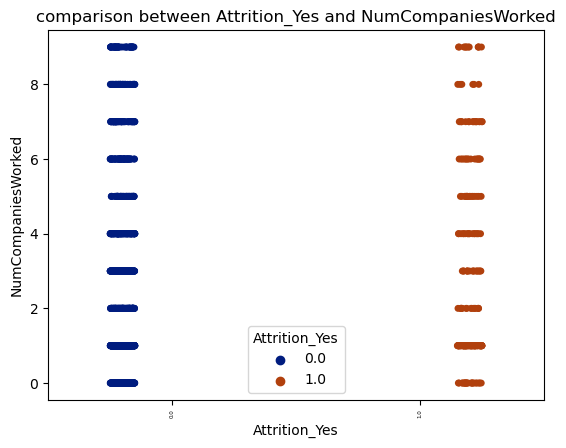

<Figure size 2800x200 with 0 Axes>

In [165]:
plt.title("comparison between Attrition_Yes and NumCompaniesWorked")
sns.stripplot(x= "Attrition_Yes", y= "NumCompaniesWorked", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

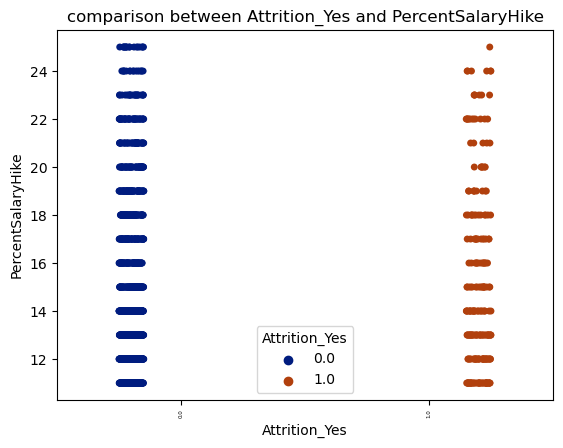

<Figure size 2800x200 with 0 Axes>

In [166]:
plt.title("comparison between Attrition_Yes and PercentSalaryHike")
sns.stripplot(x= "Attrition_Yes", y= "PercentSalaryHike", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

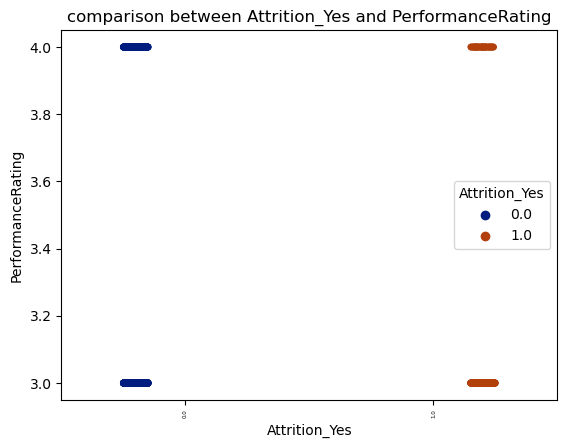

<Figure size 2800x200 with 0 Axes>

In [167]:
plt.title("comparison between Attrition_Yes and PerformanceRating")
sns.stripplot(x= "Attrition_Yes", y= "PerformanceRating", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

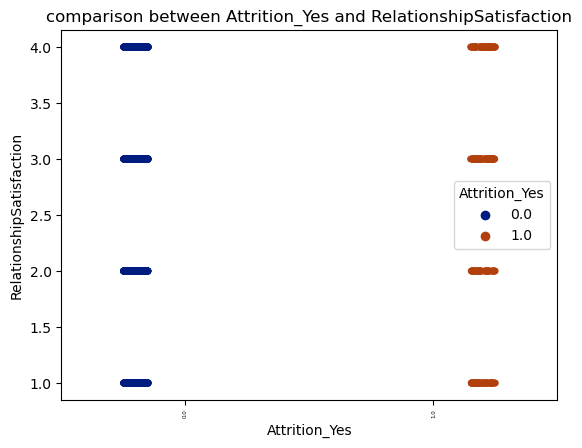

<Figure size 2800x200 with 0 Axes>

In [168]:
plt.title("comparison between Attrition_Yes and RelationshipSatisfaction")
sns.stripplot(x= "Attrition_Yes", y= "RelationshipSatisfaction", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

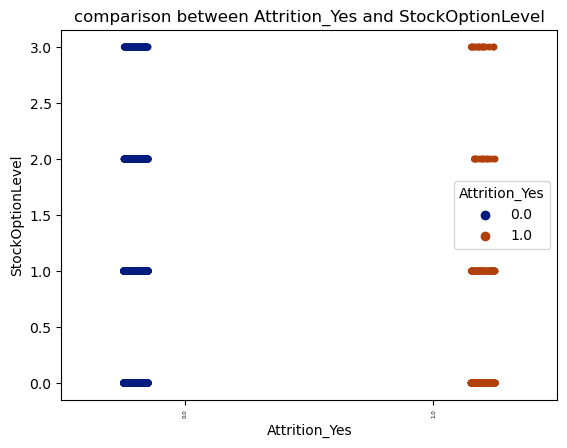

<Figure size 2800x200 with 0 Axes>

In [169]:
plt.title("comparison between Attrition_Yes and StockOptionLevel")
sns.stripplot(x= "Attrition_Yes", y= "StockOptionLevel", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

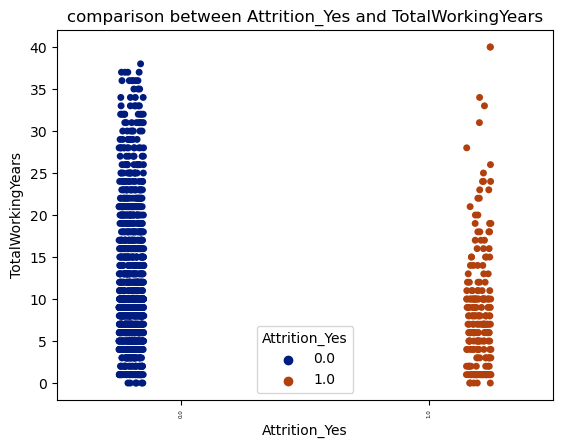

<Figure size 2800x200 with 0 Axes>

In [170]:
plt.title("comparison between Attrition_Yes and TotalWorkingYears")
sns.stripplot(x= "Attrition_Yes", y= "TotalWorkingYears", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

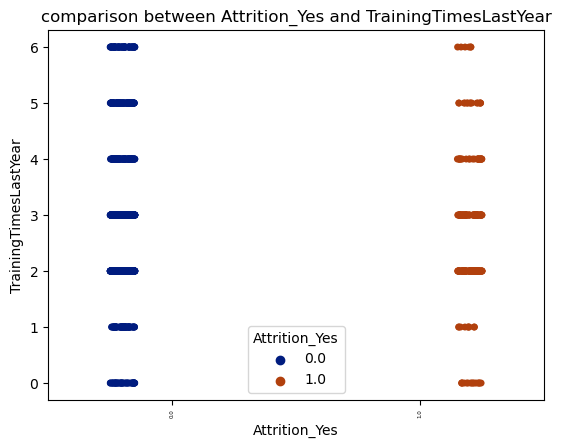

<Figure size 2800x200 with 0 Axes>

In [171]:
plt.title("comparison between Attrition_Yes and TrainingTimesLastYear")
sns.stripplot(x= "Attrition_Yes", y= "TrainingTimesLastYear", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

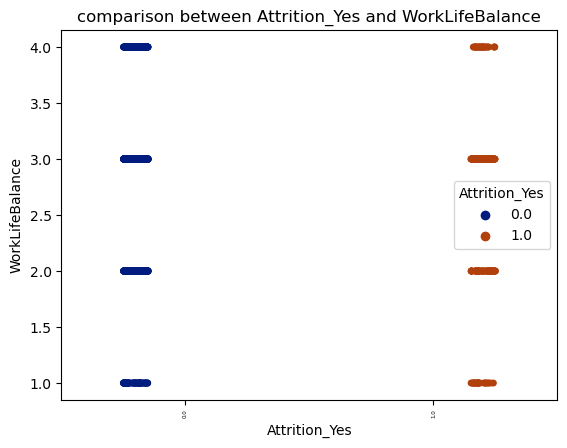

<Figure size 2800x200 with 0 Axes>

In [172]:
plt.title("comparison between Attrition_Yes and WorkLifeBalance")
sns.stripplot(x= "Attrition_Yes", y= "WorkLifeBalance", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

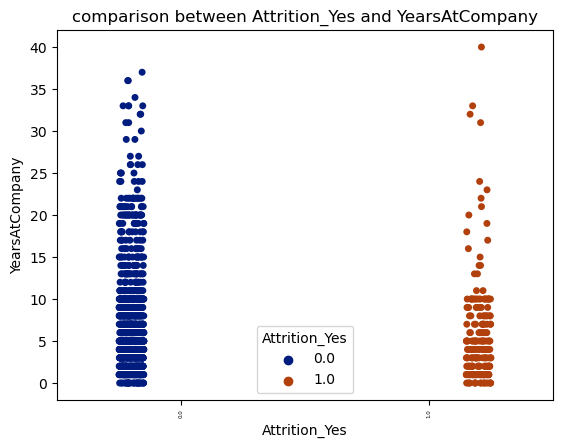

<Figure size 2800x200 with 0 Axes>

In [173]:
plt.title("comparison between Attrition_Yes and YearsAtCompany")
sns.stripplot(x= "Attrition_Yes", y= "YearsAtCompany", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

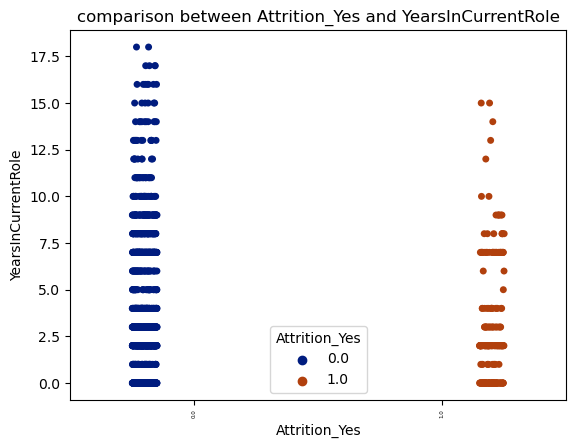

<Figure size 2800x200 with 0 Axes>

In [174]:
plt.title("comparison between Attrition_Yes and YearsInCurrentRole")
sns.stripplot(x= "Attrition_Yes", y= "YearsInCurrentRole", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

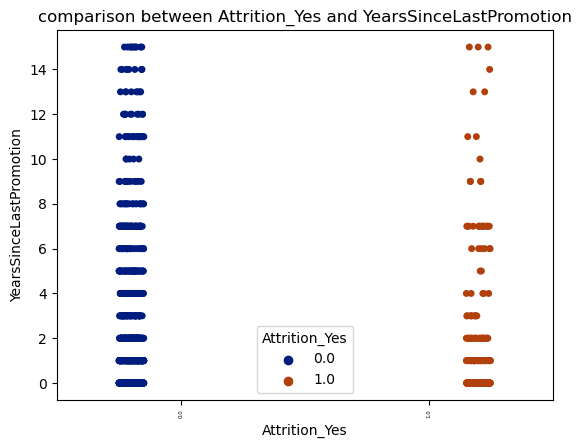

<Figure size 2800x200 with 0 Axes>

In [175]:
plt.title("comparison between Attrition_Yes and YearsSinceLastPromotion")
sns.stripplot(x= "Attrition_Yes", y= "YearsSinceLastPromotion", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

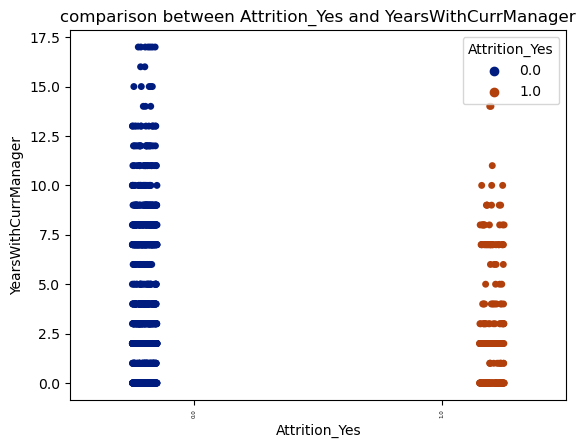

<Figure size 2800x200 with 0 Axes>

In [176]:
plt.title("comparison between Attrition_Yes and YearsWithCurrManager")
sns.stripplot(x= "Attrition_Yes", y= "YearsWithCurrManager", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

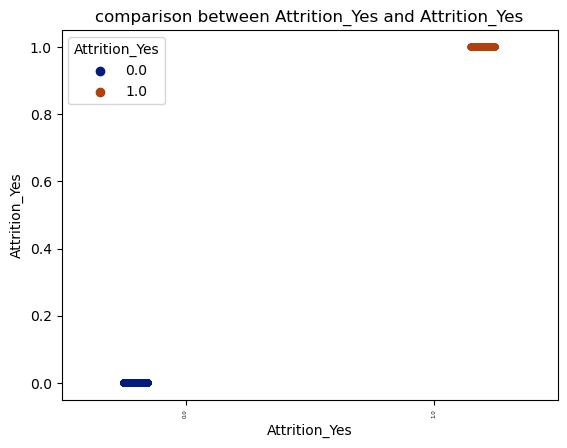

<Figure size 2800x200 with 0 Axes>

In [177]:
plt.title("comparison between Attrition_Yes and Attrition_Yes")
sns.stripplot(x= "Attrition_Yes", y= "Attrition_Yes", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

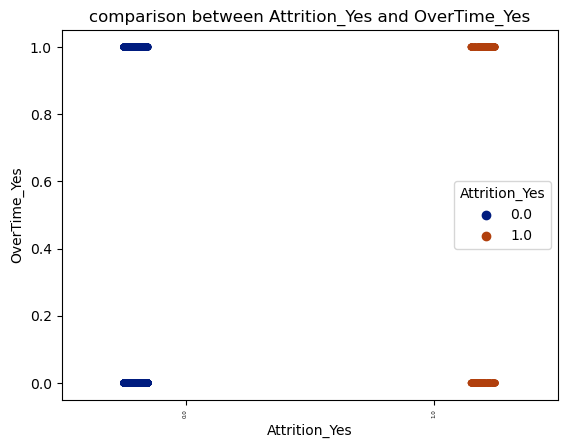

<Figure size 2800x200 with 0 Axes>

In [178]:
plt.title("comparison between Attrition_Yes and OverTime_Yes")
sns.stripplot(x= "Attrition_Yes", y= "OverTime_Yes", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

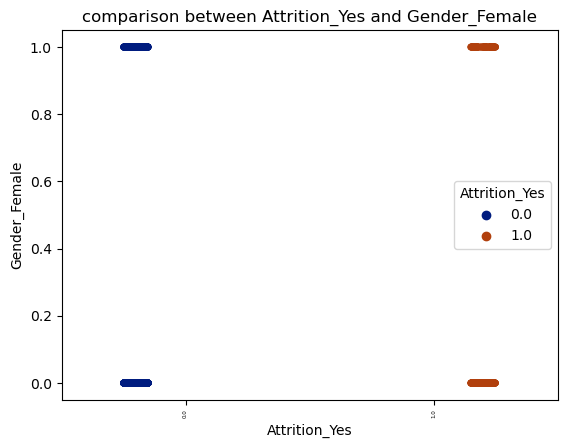

<Figure size 2800x200 with 0 Axes>

In [179]:
plt.title("comparison between Attrition_Yes and Gender_Female")
sns.stripplot(x= "Attrition_Yes", y= "Gender_Female", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

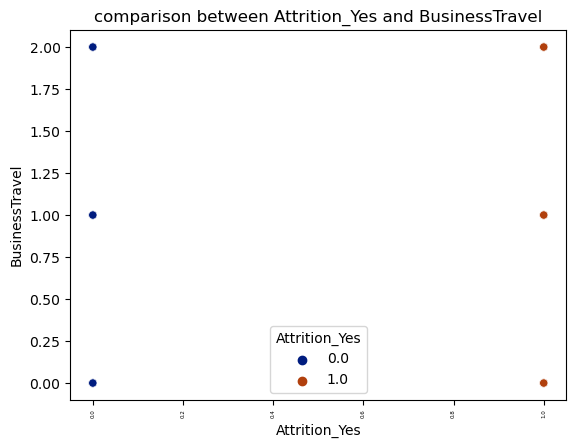

<Figure size 2800x200 with 0 Axes>

In [180]:
plt.title("comparison between Attrition_Yes and BusinessTravel")
sns.scatterplot(x= "Attrition_Yes", y= "BusinessTravel", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

Scatterplots

In [ ]:
There are no conclusive statements that we can derive from the scatterplots

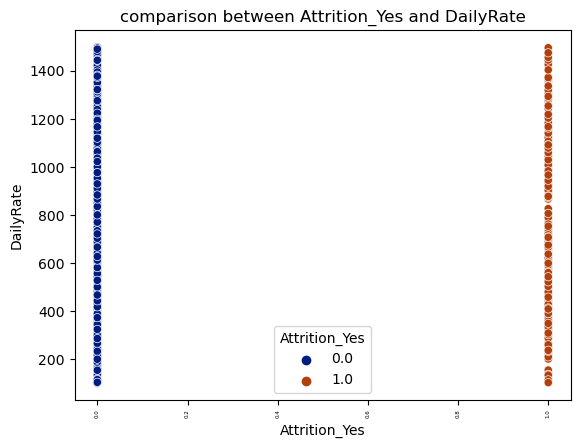

<Figure size 2800x200 with 0 Axes>

In [181]:
plt.title("comparison between Attrition_Yes and DailyRate")
sns.scatterplot(x= "Attrition_Yes", y= "DailyRate", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

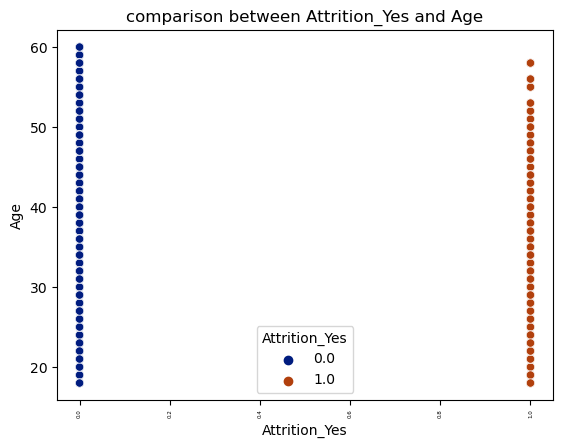

<Figure size 2800x200 with 0 Axes>

In [183]:
plt.title("comparison between Attrition_Yes and Age")
sns.scatterplot(x= "Attrition_Yes", y= "Age", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

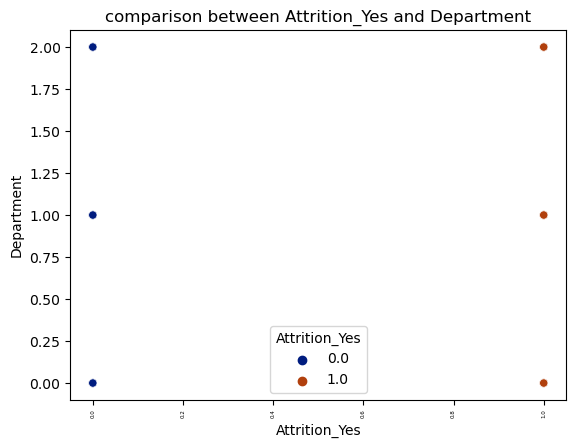

<Figure size 2800x200 with 0 Axes>

In [184]:
plt.title("comparison between Attrition_Yes and Department")
sns.scatterplot(x= "Attrition_Yes", y= "Department", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

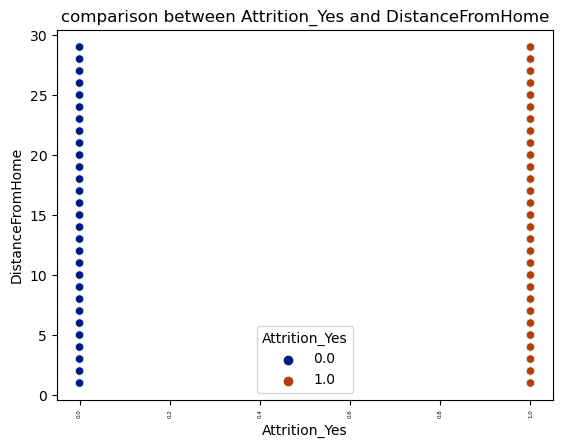

<Figure size 2800x200 with 0 Axes>

In [185]:
plt.title("comparison between Attrition_Yes and DistanceFromHome")
sns.scatterplot(x= "Attrition_Yes", y= "DistanceFromHome", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

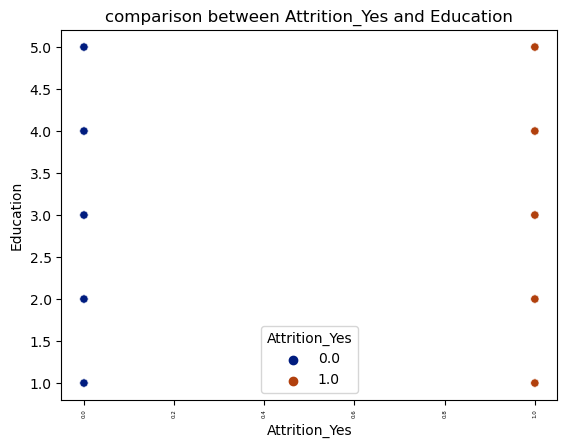

<Figure size 2800x200 with 0 Axes>

In [186]:
plt.title("comparison between Attrition_Yes and Education")
sns.scatterplot(x= "Attrition_Yes", y= "Education", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

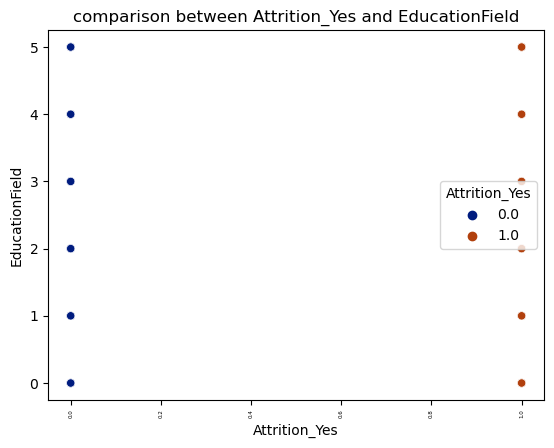

<Figure size 2800x200 with 0 Axes>

In [187]:
plt.title("comparison between Attrition_Yes and EducationField")
sns.scatterplot(x= "Attrition_Yes", y= "EducationField", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

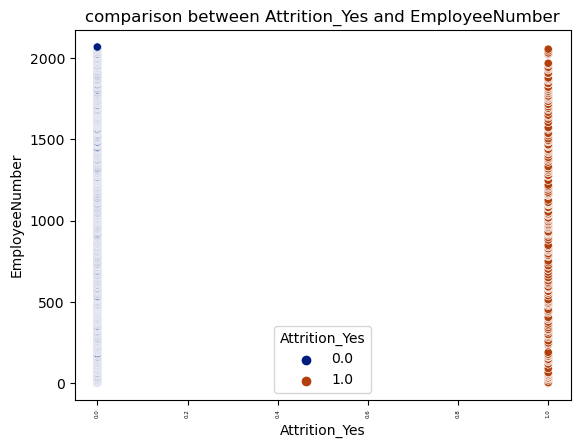

<Figure size 2800x200 with 0 Axes>

In [188]:
plt.title("comparison between Attrition_Yes and EmployeeNumber")
sns.scatterplot(x= "Attrition_Yes", y= "EmployeeNumber", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

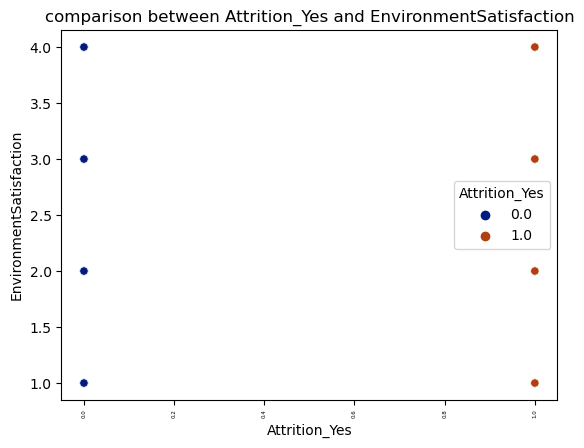

<Figure size 2800x200 with 0 Axes>

In [189]:
plt.title("comparison between Attrition_Yes and EnvironmentSatisfaction")
sns.scatterplot(x= "Attrition_Yes", y= "EnvironmentSatisfaction", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

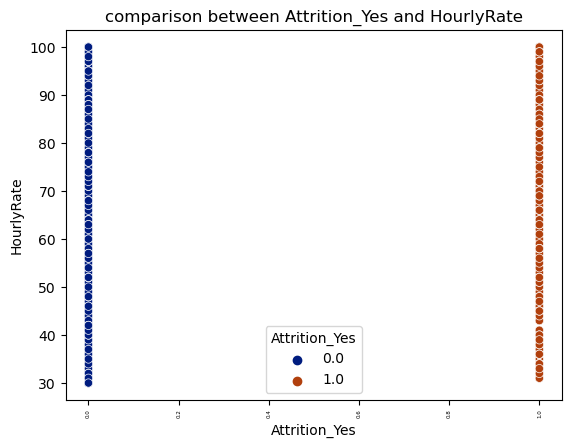

<Figure size 2800x200 with 0 Axes>

In [190]:
plt.title("comparison between Attrition_Yes and HourlyRate")
sns.scatterplot(x= "Attrition_Yes", y= "HourlyRate", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

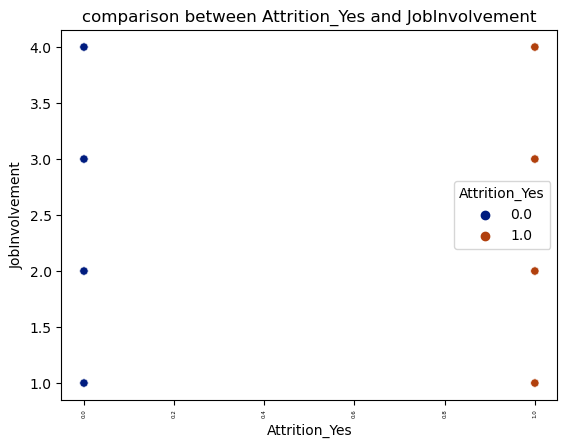

<Figure size 2800x200 with 0 Axes>

In [191]:
plt.title("comparison between Attrition_Yes and JobInvolvement")
sns.scatterplot(x= "Attrition_Yes", y= "JobInvolvement", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

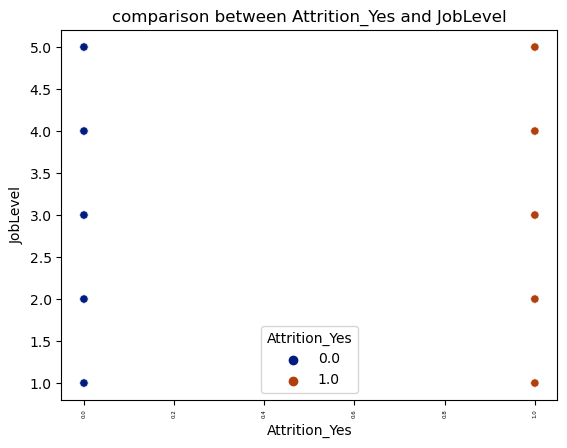

<Figure size 2800x200 with 0 Axes>

In [192]:
plt.title("comparison between Attrition_Yes and JobLevel")
sns.scatterplot(x= "Attrition_Yes", y= "JobLevel", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

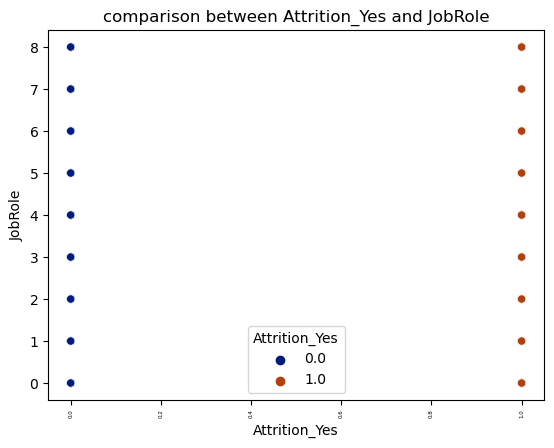

<Figure size 2800x200 with 0 Axes>

In [193]:
plt.title("comparison between Attrition_Yes and JobRole")
sns.scatterplot(x= "Attrition_Yes", y= "JobRole", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

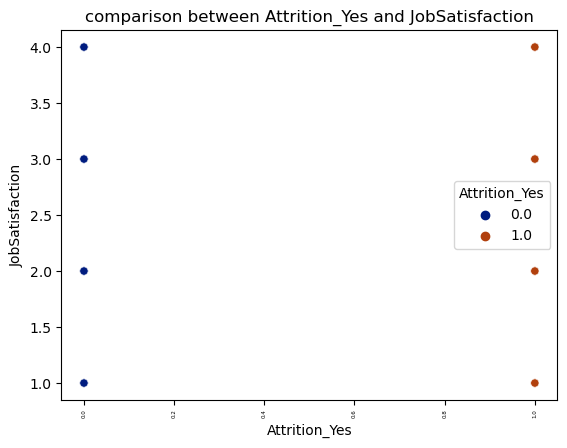

<Figure size 2800x200 with 0 Axes>

In [194]:
plt.title("comparison between Attrition_Yes and JobSatisfaction")
sns.scatterplot(x= "Attrition_Yes", y= "JobSatisfaction", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

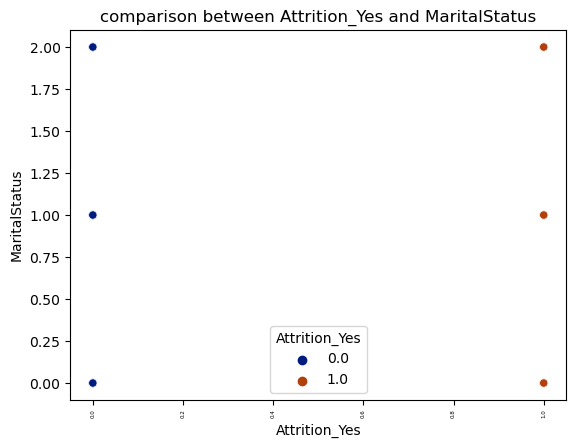

<Figure size 2800x200 with 0 Axes>

In [195]:
plt.title("comparison between Attrition_Yes and MaritalStatus")
sns.scatterplot(x= "Attrition_Yes", y= "MaritalStatus", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

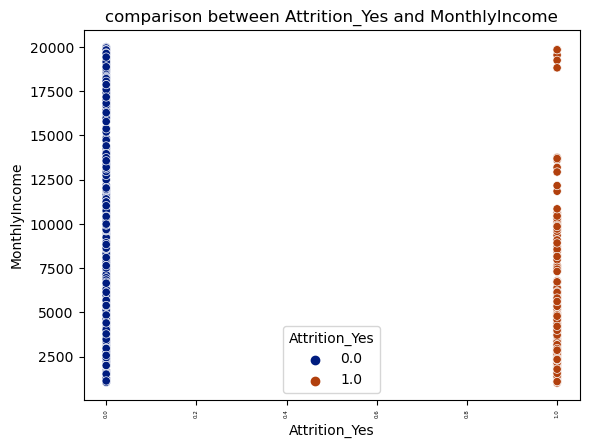

<Figure size 2800x200 with 0 Axes>

In [196]:
plt.title("comparison between Attrition_Yes and MonthlyIncome")
sns.scatterplot(x= "Attrition_Yes", y= "MonthlyIncome", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

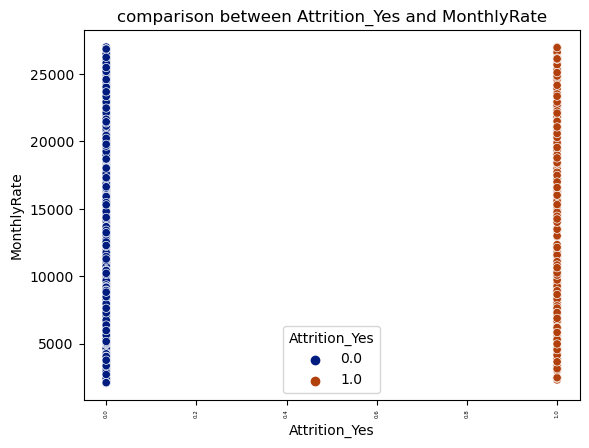

<Figure size 2800x200 with 0 Axes>

In [197]:
plt.title("comparison between Attrition_Yes and MonthlyRate")
sns.scatterplot(x= "Attrition_Yes", y= "MonthlyRate", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

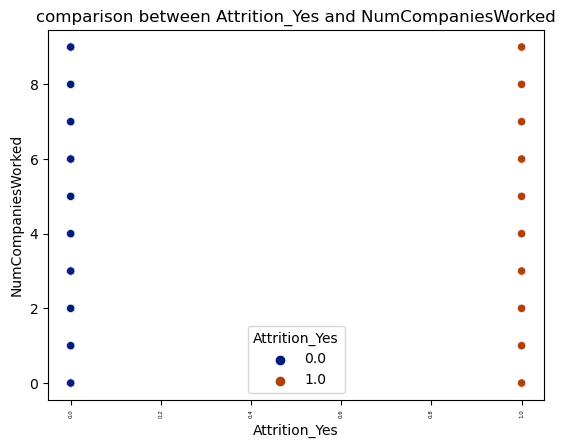

<Figure size 2800x200 with 0 Axes>

In [198]:
plt.title("comparison between Attrition_Yes and NumCompaniesWorked")
sns.scatterplot(x= "Attrition_Yes", y= "NumCompaniesWorked", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

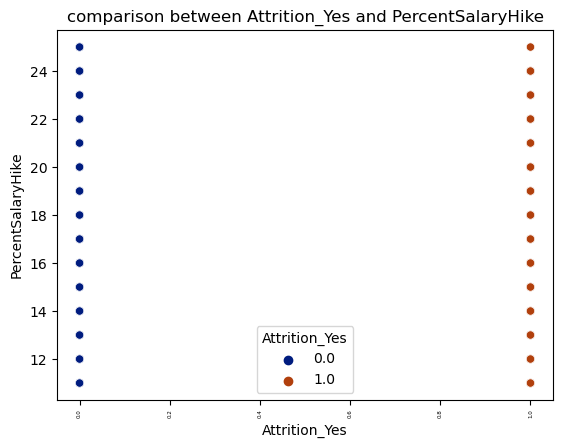

<Figure size 2800x200 with 0 Axes>

In [199]:
plt.title("comparison between Attrition_Yes and PercentSalaryHike")
sns.scatterplot(x= "Attrition_Yes", y= "PercentSalaryHike", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

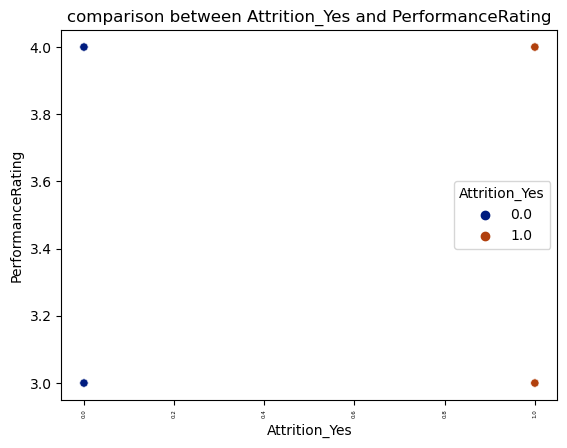

<Figure size 2800x200 with 0 Axes>

In [200]:
plt.title("comparison between Attrition_Yes and PerformanceRating")
sns.scatterplot(x= "Attrition_Yes", y= "PerformanceRating", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

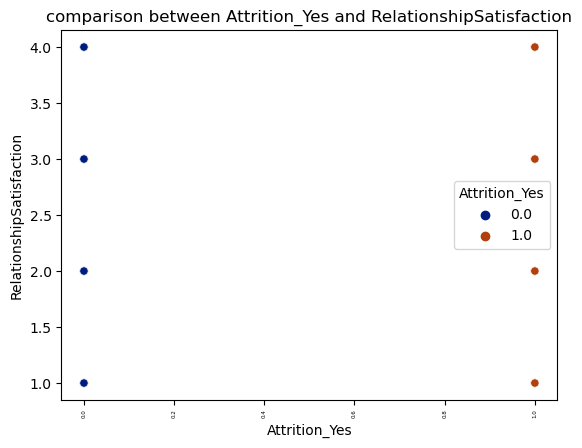

<Figure size 2800x200 with 0 Axes>

In [201]:
plt.title("comparison between Attrition_Yes and RelationshipSatisfaction")
sns.scatterplot(x= "Attrition_Yes", y= "RelationshipSatisfaction", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

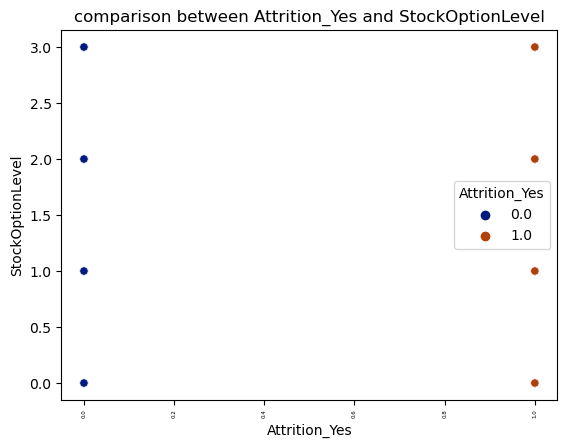

<Figure size 2800x200 with 0 Axes>

In [202]:
plt.title("comparison between Attrition_Yes and StockOptionLevel")
sns.scatterplot(x= "Attrition_Yes", y= "StockOptionLevel", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

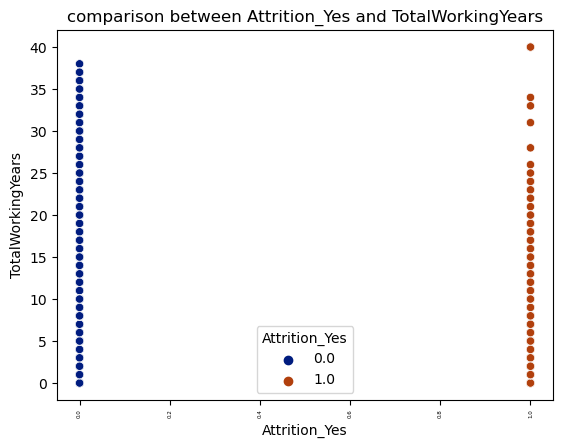

<Figure size 2800x200 with 0 Axes>

In [203]:
plt.title("comparison between Attrition_Yes and TotalWorkingYears")
sns.scatterplot(x= "Attrition_Yes", y= "TotalWorkingYears", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

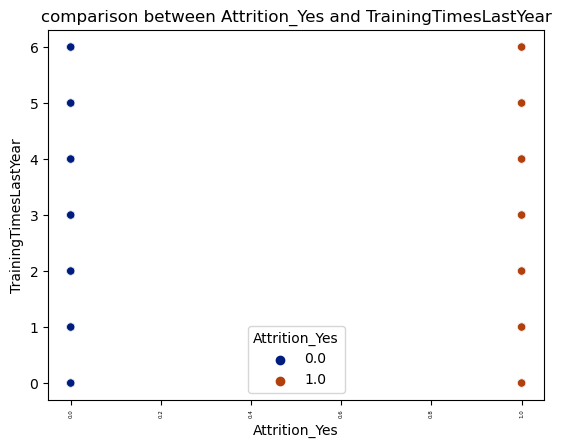

<Figure size 2800x200 with 0 Axes>

In [204]:
plt.title("comparison between Attrition_Yes and TrainingTimesLastYear")
sns.scatterplot(x= "Attrition_Yes", y= "TrainingTimesLastYear", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

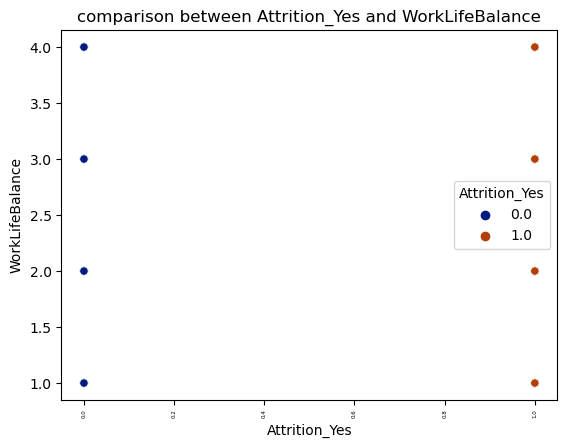

<Figure size 2800x200 with 0 Axes>

In [205]:
plt.title("comparison between Attrition_Yes and WorkLifeBalance")
sns.scatterplot(x= "Attrition_Yes", y= "WorkLifeBalance", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

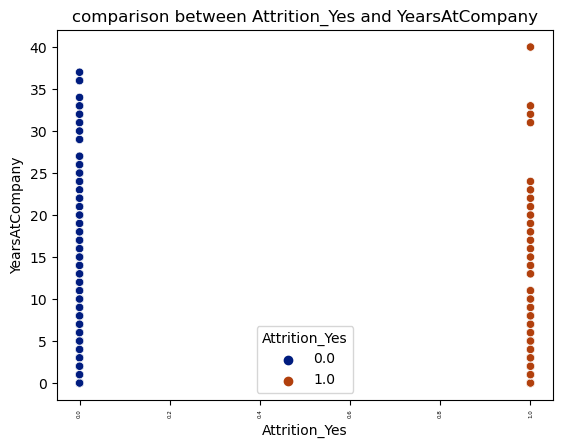

<Figure size 2800x200 with 0 Axes>

In [206]:
plt.title("comparison between Attrition_Yes and YearsAtCompany")
sns.scatterplot(x= "Attrition_Yes", y= "YearsAtCompany", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

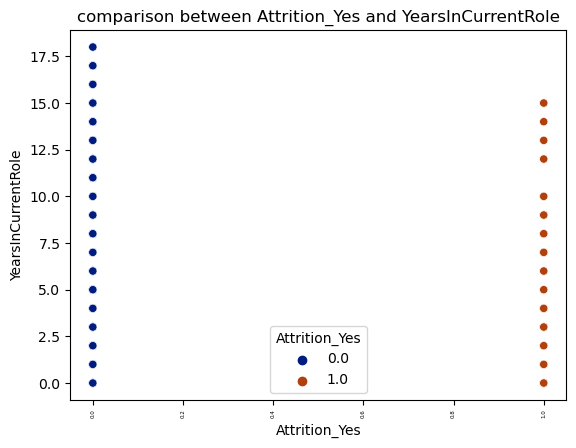

<Figure size 2800x200 with 0 Axes>

In [207]:
plt.title("comparison between Attrition_Yes and YearsInCurrentRole")
sns.scatterplot(x= "Attrition_Yes", y= "YearsInCurrentRole", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

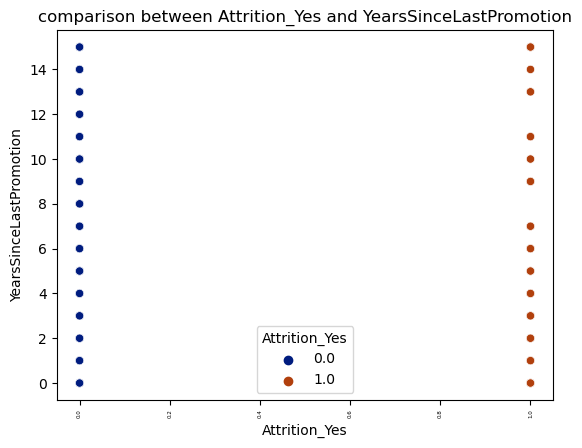

<Figure size 2800x200 with 0 Axes>

In [208]:
plt.title("comparison between Attrition_Yes and YearsSinceLastPromotion")
sns.scatterplot(x= "Attrition_Yes", y= "YearsSinceLastPromotion", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

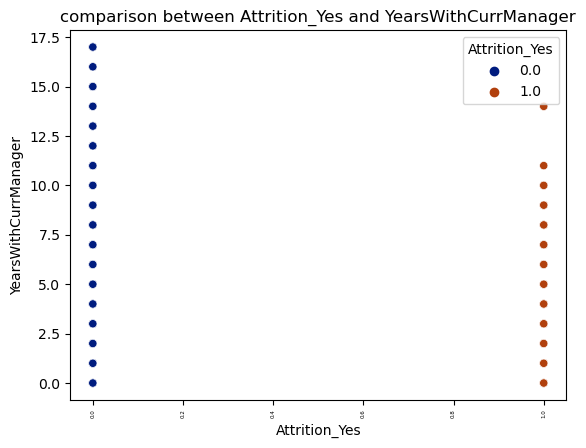

<Figure size 2800x200 with 0 Axes>

In [209]:
plt.title("comparison between Attrition_Yes and YearsWithCurrManager")
sns.scatterplot(x= "Attrition_Yes", y= "YearsWithCurrManager", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

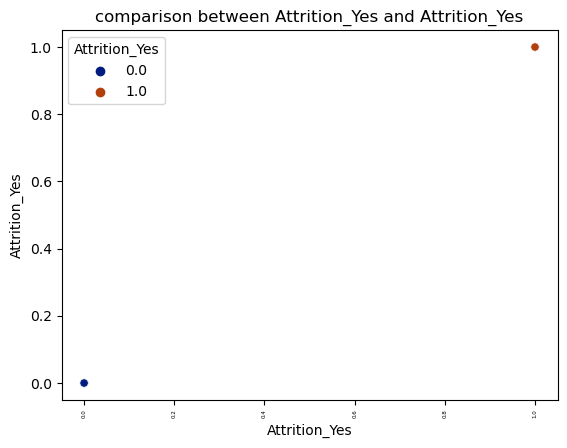

<Figure size 2800x200 with 0 Axes>

In [210]:
plt.title("comparison between Attrition_Yes and Attrition_Yes")
sns.scatterplot(x= "Attrition_Yes", y= "Attrition_Yes", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

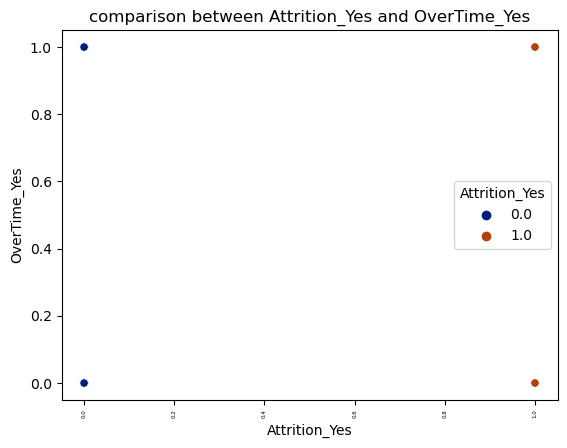

<Figure size 2800x200 with 0 Axes>

In [211]:
plt.title("comparison between Attrition_Yes and OverTime_Yes")
sns.scatterplot(x= "Attrition_Yes", y= "OverTime_Yes", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

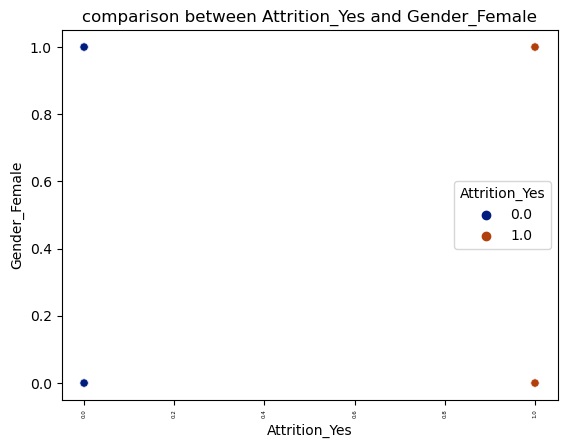

<Figure size 2800x200 with 0 Axes>

In [212]:
plt.title("comparison between Attrition_Yes and Gender_Female")
sns.scatterplot(x= "Attrition_Yes", y= "Gender_Female", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark')
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

In [ ]:
Barplots

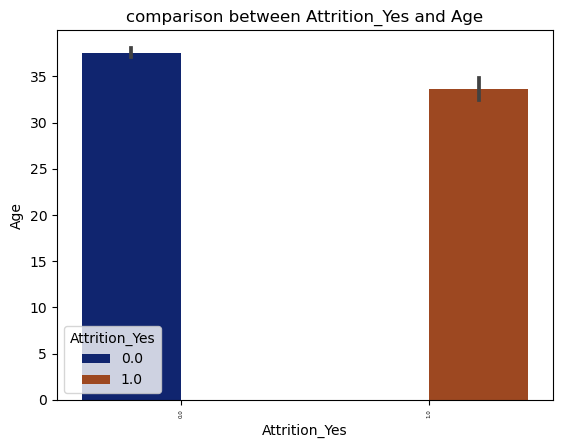

<Figure size 2800x200 with 0 Axes>

In [213]:
plt.title("comparison between Attrition_Yes and Age")
sns.barplot(x= "Attrition_Yes", y= "Age", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

The age of employees who didn't go through attrition is higher than the one who did.

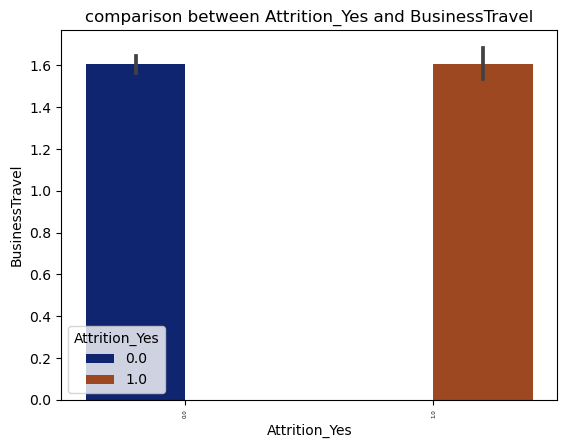

<Figure size 2800x200 with 0 Axes>

In [214]:
plt.title("comparison between Attrition_Yes and BusinessTravel")
sns.barplot(x= "Attrition_Yes", y= "BusinessTravel", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

No conclusive statements can be made from this plot.

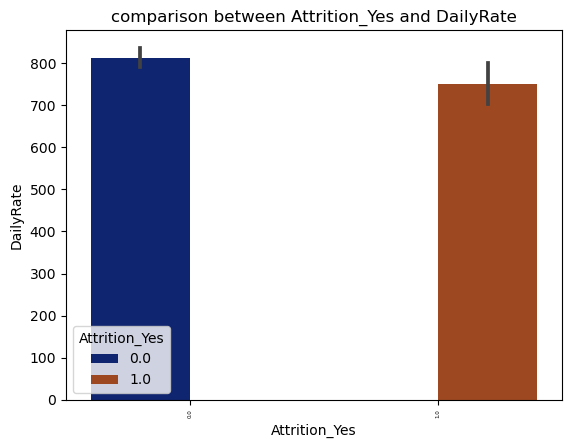

<Figure size 2800x200 with 0 Axes>

In [215]:
plt.title("comparison between Attrition_Yes and DailyRate")
sns.barplot(x= "Attrition_Yes", y= "DailyRate", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

daily rate of employees who didn't go through attrition is slightly higher than the ones who did.

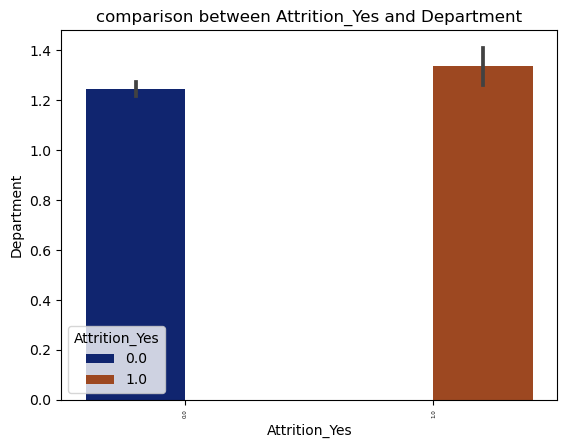

<Figure size 2800x200 with 0 Axes>

In [216]:
plt.title("comparison between Attrition_Yes and Department")
sns.barplot(x= "Attrition_Yes", y= "Department", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

No conclusive statements can be derived from the above plot.

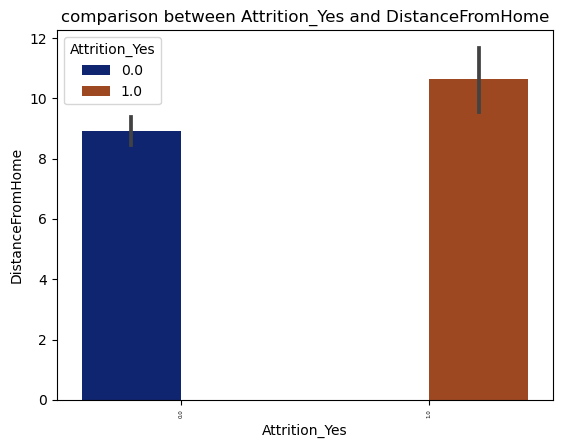

<Figure size 2800x200 with 0 Axes>

In [217]:
plt.title("comparison between Attrition_Yes and DistanceFromHome")
sns.barplot(x= "Attrition_Yes", y= "DistanceFromHome", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

employees who did go through attrition lived farther than the the ones who didn't go through attrition

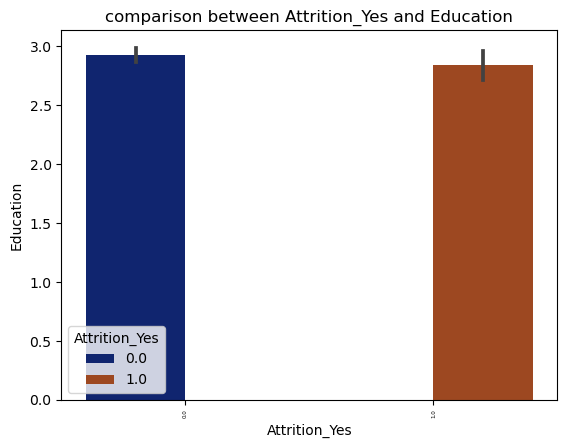

<Figure size 2800x200 with 0 Axes>

In [218]:
plt.title("comparison between Attrition_Yes and Education")
sns.barplot(x= "Attrition_Yes", y= "Education", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

No conclusive statements can be derived from the above plot.

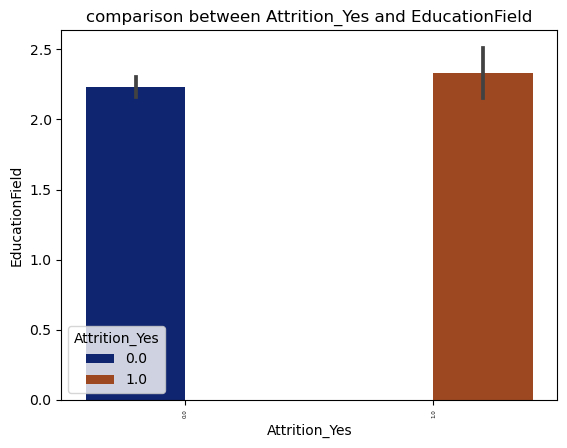

<Figure size 2800x200 with 0 Axes>

In [219]:
plt.title("comparison between Attrition_Yes and EducationField")
sns.barplot(x= "Attrition_Yes", y= "EducationField", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

No conclusive statements can be made from the above plot.

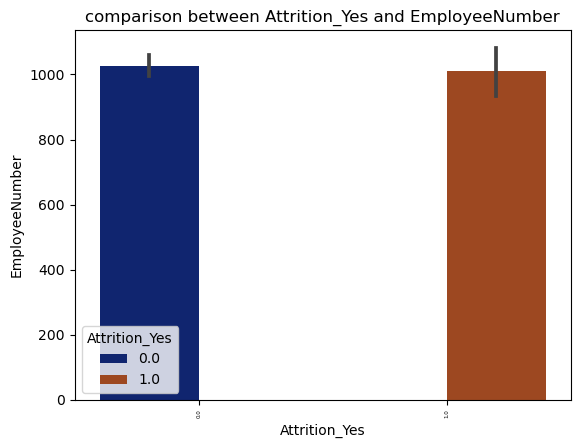

<Figure size 2800x200 with 0 Axes>

In [220]:
plt.title("comparison between Attrition_Yes and EmployeeNumber")
sns.barplot(x= "Attrition_Yes", y= "EmployeeNumber", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

No conclusive statements can be made from the above plot.

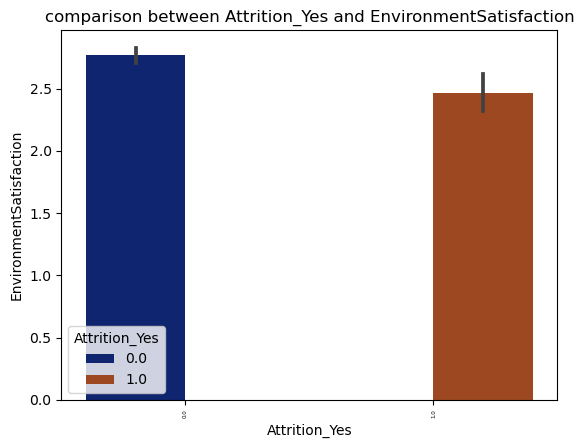

<Figure size 2800x200 with 0 Axes>

In [221]:
plt.title("comparison between Attrition_Yes and EnvironmentSatisfaction")
sns.barplot(x= "Attrition_Yes", y= "EnvironmentSatisfaction", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

environment satisfaction of people who didn't go through attrition is slightly higher than the one who did.

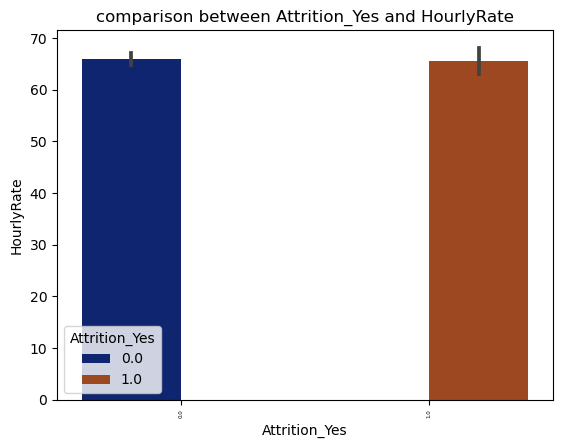

<Figure size 2800x200 with 0 Axes>

In [222]:
plt.title("comparison between Attrition_Yes and HourlyRate")
sns.barplot(x= "Attrition_Yes", y= "HourlyRate", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

In [ ]:
No conclusive statements can be made from the above plot.

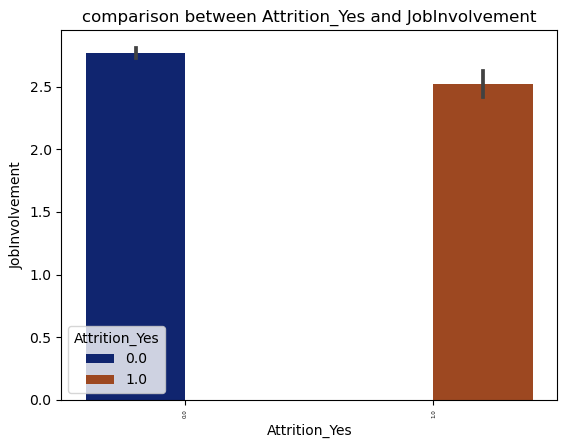

<Figure size 2800x200 with 0 Axes>

In [223]:
plt.title("comparison between Attrition_Yes and JobInvolvement")
sns.barplot(x= "Attrition_Yes", y= "JobInvolvement", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

job involvement who didnt go through attrition is slightly higher than the ones who did.

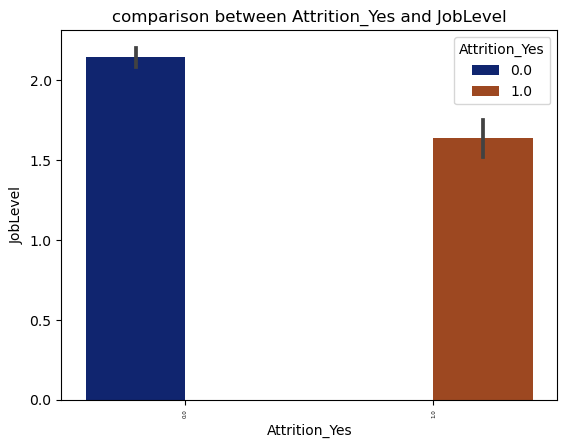

<Figure size 2800x200 with 0 Axes>

In [224]:
plt.title("comparison between Attrition_Yes and JobLevel")
sns.barplot(x= "Attrition_Yes", y= "JobLevel", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

Job level who didn't go through attrition is alightly higher than the ones who did.

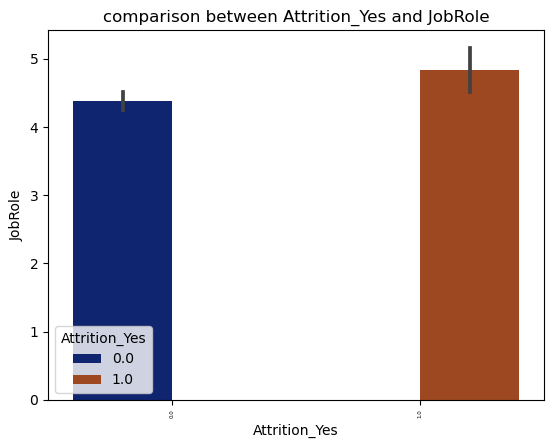

<Figure size 2800x200 with 0 Axes>

In [225]:
plt.title("comparison between Attrition_Yes and JobRole")
sns.barplot(x= "Attrition_Yes", y= "JobRole", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

job role who did go through attrition is slightly higher than ones who didnt.

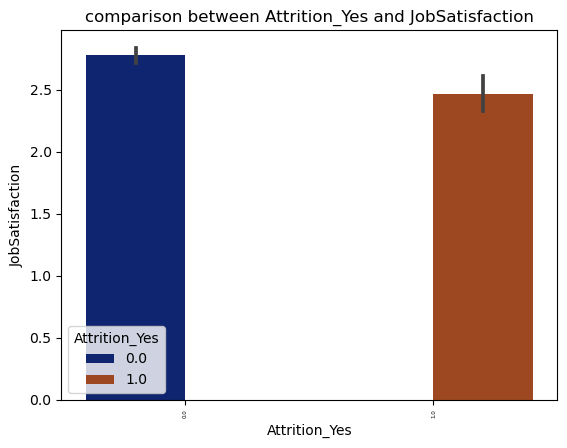

<Figure size 2800x200 with 0 Axes>

In [226]:
plt.title("comparison between Attrition_Yes and JobSatisfaction")
sns.barplot(x= "Attrition_Yes", y= "JobSatisfaction", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

job satisfaction of the people who didn't go through attrition is slightly higher than the ones who did go through attrition.

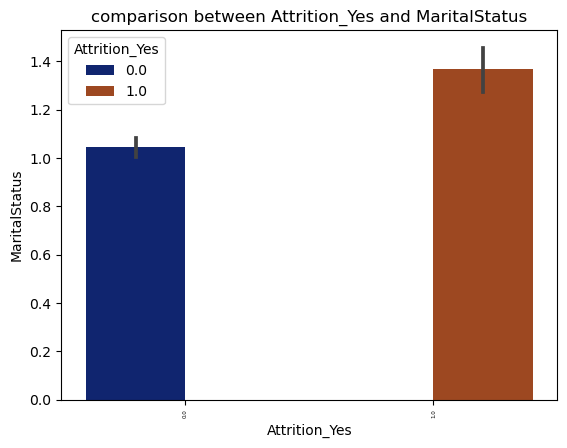

<Figure size 2800x200 with 0 Axes>

In [227]:
plt.title("comparison between Attrition_Yes and MaritalStatus")
sns.barplot(x= "Attrition_Yes", y= "MaritalStatus", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

More married people went through attrition than the ones who didn't get married.

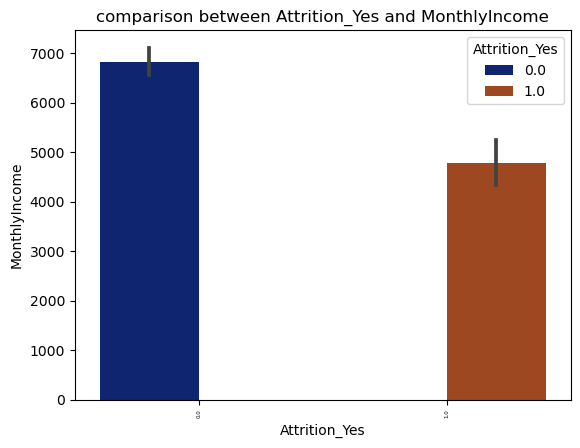

<Figure size 2800x200 with 0 Axes>

In [228]:
plt.title("comparison between Attrition_Yes and MonthlyIncome")
sns.barplot(x= "Attrition_Yes", y= "MonthlyIncome", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

Monthly income who didn't go through attrition is higher than the ones who did go through attrition.

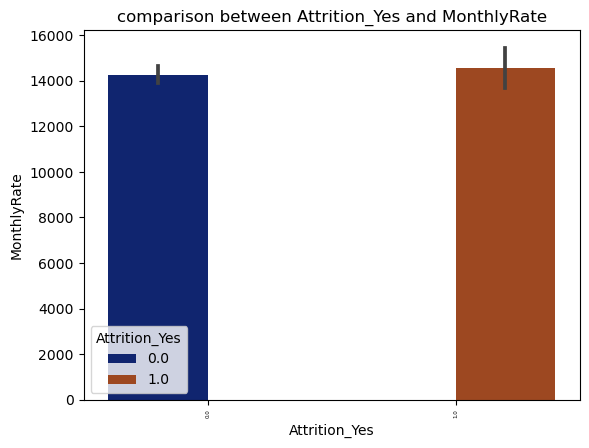

<Figure size 2800x200 with 0 Axes>

In [229]:
plt.title("comparison between Attrition_Yes and MonthlyRate")
sns.barplot(x= "Attrition_Yes", y= "MonthlyRate", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

No conclusive statements can be made from the above plot.

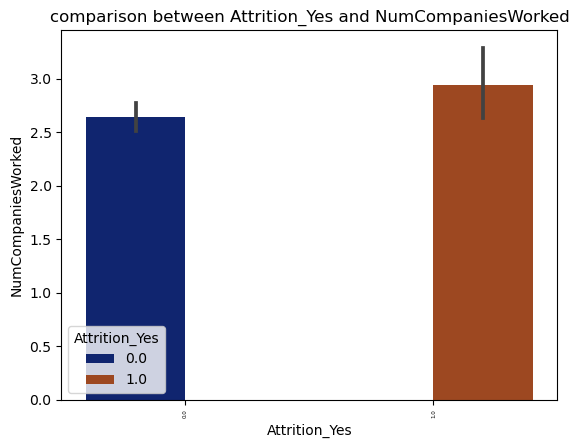

<Figure size 2800x200 with 0 Axes>

In [230]:
plt.title("comparison between Attrition_Yes and NumCompaniesWorked")
sns.barplot(x= "Attrition_Yes", y= "NumCompaniesWorked", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

number of companies is higher who did go through attrition than the ones who did not.

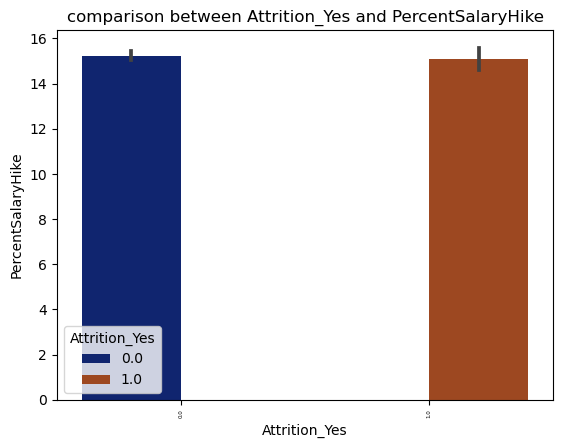

<Figure size 2800x200 with 0 Axes>

In [231]:
plt.title("comparison between Attrition_Yes and PercentSalaryHike")
sns.barplot(x= "Attrition_Yes", y= "PercentSalaryHike", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

No conclusive statements can be made from the above plot.

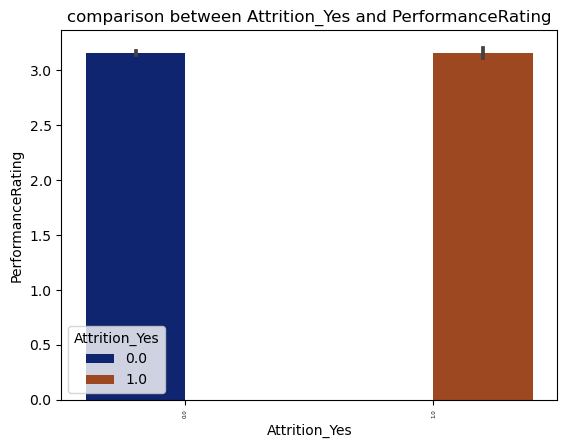

<Figure size 2800x200 with 0 Axes>

In [232]:
plt.title("comparison between Attrition_Yes and PerformanceRating")
sns.barplot(x= "Attrition_Yes", y= "PerformanceRating", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

No conclusive statements can be made from the above plot.

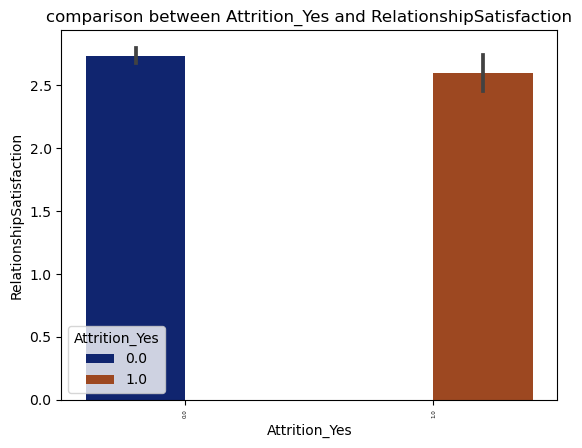

<Figure size 2800x200 with 0 Axes>

In [233]:
plt.title("comparison between Attrition_Yes and RelationshipSatisfaction")
sns.barplot(x= "Attrition_Yes", y= "RelationshipSatisfaction", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

No conclusive statements can be made from the above plot.

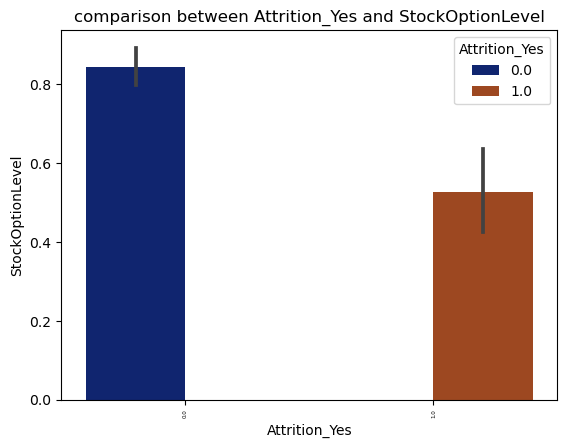

<Figure size 2800x200 with 0 Axes>

In [234]:
plt.title("comparison between Attrition_Yes and StockOptionLevel")
sns.barplot(x= "Attrition_Yes", y= "StockOptionLevel", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

Stock option level is higher for emplyees who didnt go through attrition than the ones who did go through attrition.

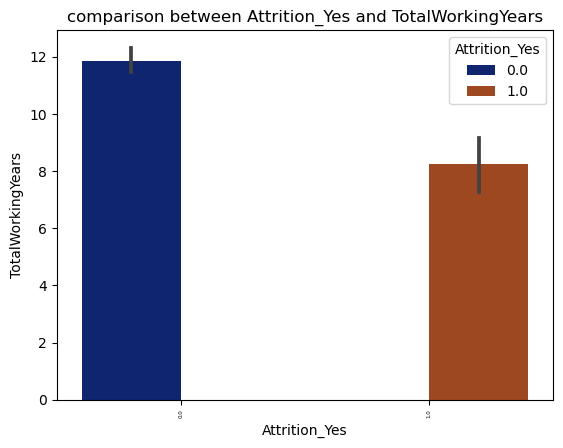

<Figure size 2800x200 with 0 Axes>

In [235]:
plt.title("comparison between Attrition_Yes and TotalWorkingYears")
sns.barplot(x= "Attrition_Yes", y= "TotalWorkingYears", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

total working years is higher for employees who didn't go through attrition than the ones who did.

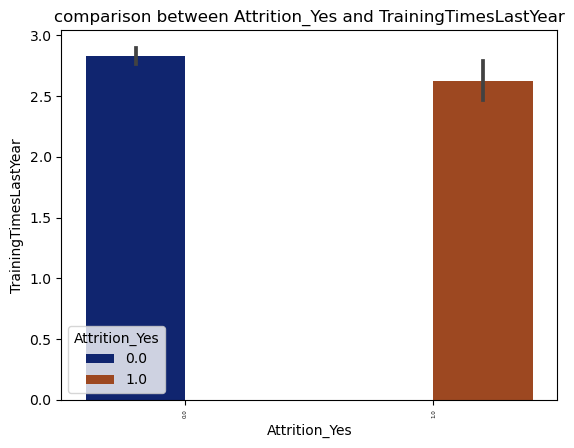

<Figure size 2800x200 with 0 Axes>

In [236]:
plt.title("comparison between Attrition_Yes and TrainingTimesLastYear")
sns.barplot(x= "Attrition_Yes", y= "TrainingTimesLastYear", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

Training times last year is slightly higher who didnot go through attrition than the ones who did.

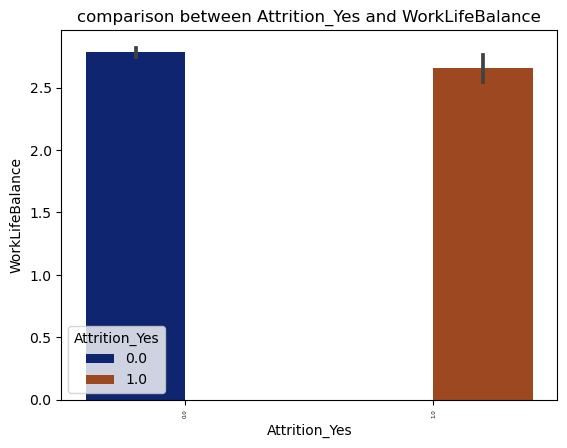

<Figure size 2800x200 with 0 Axes>

In [237]:
plt.title("comparison between Attrition_Yes and WorkLifeBalance")
sns.barplot(x= "Attrition_Yes", y= "WorkLifeBalance", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

No conclusive statements can be made from the above plot.

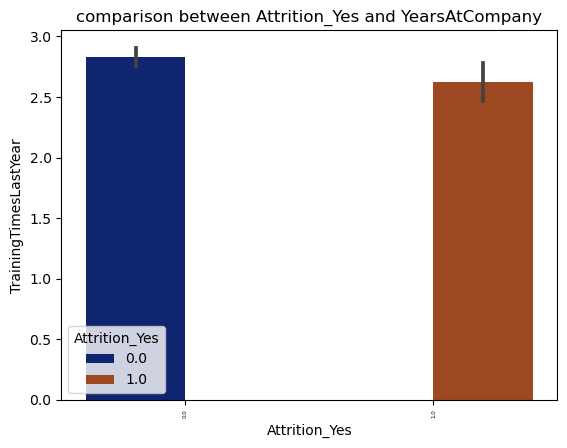

<Figure size 2800x200 with 0 Axes>

In [238]:
plt.title("comparison between Attrition_Yes and YearsAtCompany")
sns.barplot(x= "Attrition_Yes", y= "TrainingTimesLastYear", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

years at company is slightly higher for employees who did not go through attrition than the ones who did.

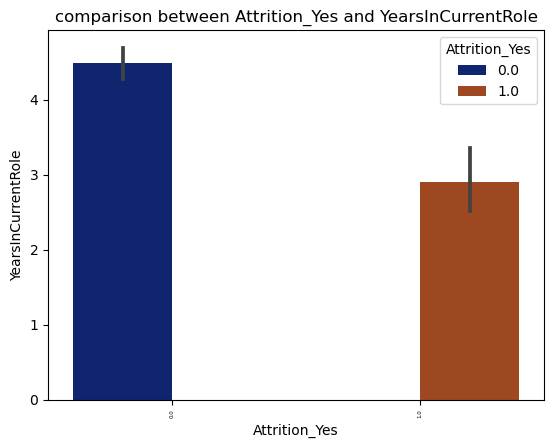

<Figure size 2800x200 with 0 Axes>

In [239]:
plt.title("comparison between Attrition_Yes and YearsInCurrentRole")
sns.barplot(x= "Attrition_Yes", y= "YearsInCurrentRole", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

Years in current role is higher for the ones who did not go through attrition than the ones who did go through attrition

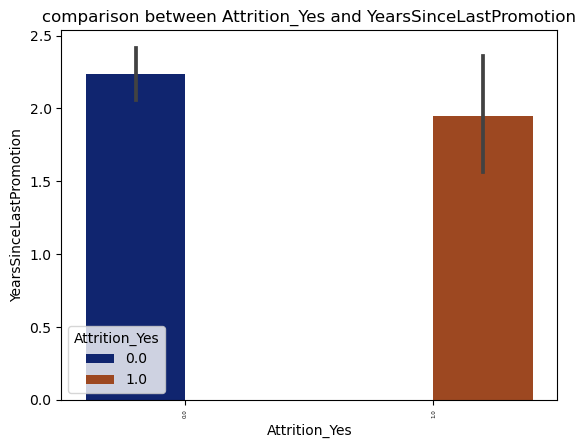

<Figure size 2800x200 with 0 Axes>

In [240]:
plt.title("comparison between Attrition_Yes and YearsSinceLastPromotion")
sns.barplot(x= "Attrition_Yes", y= "YearsSinceLastPromotion", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

yEARS SINCE LAST PROMOTION IS SLIGHTLY HIGHER FOR THE PEOPLE WHO DID NOT GO THROUGH ATTRITION THAN THE ONES WHO DID.

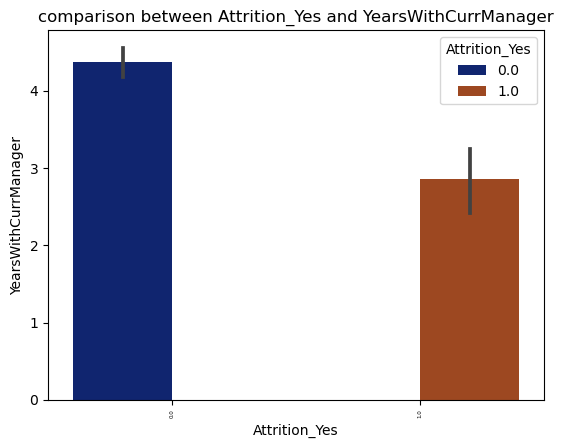

<Figure size 2800x200 with 0 Axes>

In [241]:
plt.title("comparison between Attrition_Yes and YearsWithCurrManager")
sns.barplot(x= "Attrition_Yes", y= "YearsWithCurrManager", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

Years with current maanger is higher for those who didnt go through attrition than the ones who did go through attrition.

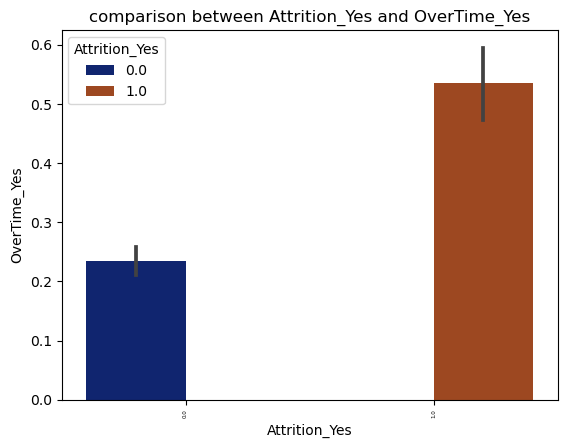

<Figure size 2800x200 with 0 Axes>

In [242]:
plt.title("comparison between Attrition_Yes and OverTime_Yes")
sns.barplot(x= "Attrition_Yes", y= "OverTime_Yes", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

Overtime is higher for those who went through attrition than the ones who didn't go through attrition.

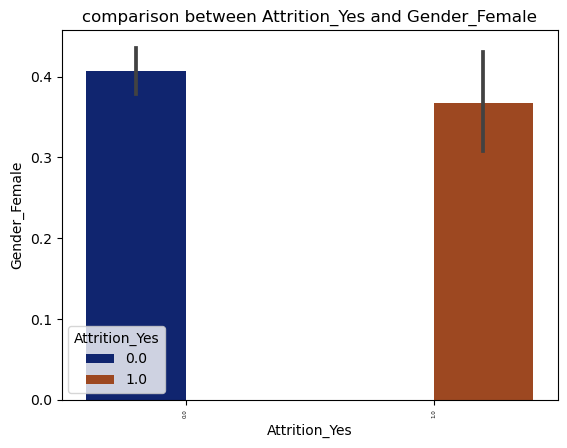

<Figure size 2800x200 with 0 Axes>

In [243]:
plt.title("comparison between Attrition_Yes and Gender_Female")
sns.barplot(x= "Attrition_Yes", y= "Gender_Female", data = attrition_data_encoded,hue='Attrition_Yes', palette='dark',dodge=True)
plt.xticks(rotation=90, fontsize=4)
plt.figure(figsize=(28, 2))
plt.show()

Women went through attrition lesser than than men.

Catplots

Most of the catplots below are further elaboaration of the count plots we had done earlier.

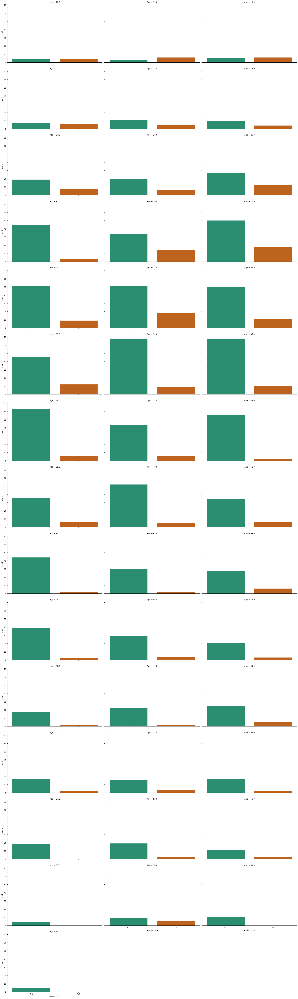

In [244]:
sns.catplot(x= 'Attrition_Yes', col= 'Age', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

Some of the ages who did not go through attrition are between 25 to 50.
Some of the ages who did go through attrition are between 26 to 35.

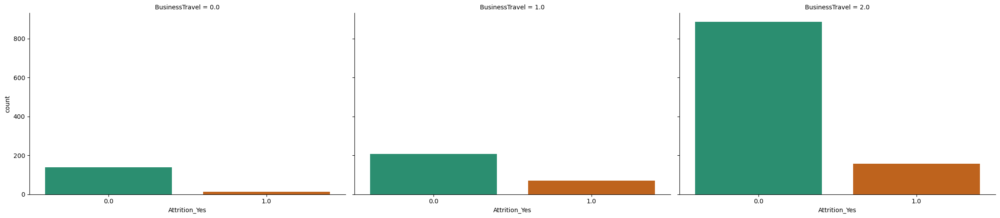

In [246]:
sns.catplot(x= 'Attrition_Yes', col= 'BusinessTravel', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

Travel rarely went through attrition less than the ones who travelled frquently or did not travel.

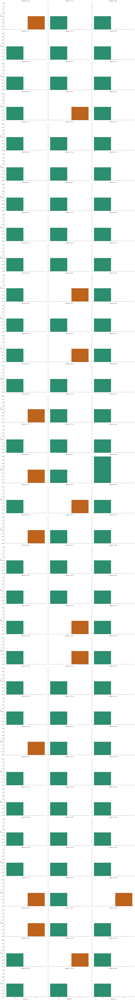

In [248]:
sns.catplot(x= 'Attrition_Yes', col= 'DailyRate', data = attrition_data_encoded.head(100), kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

Daily rate of employees who did not go through attrition is approx 852 and the ones who did are dispersed across.

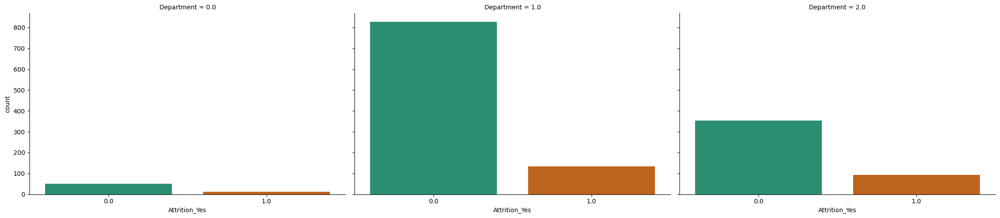

In [249]:
sns.catplot(x= 'Attrition_Yes', col= 'Department', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

Most of the people who did not go through attrition were from department 1 and the ones who did are from department 2.

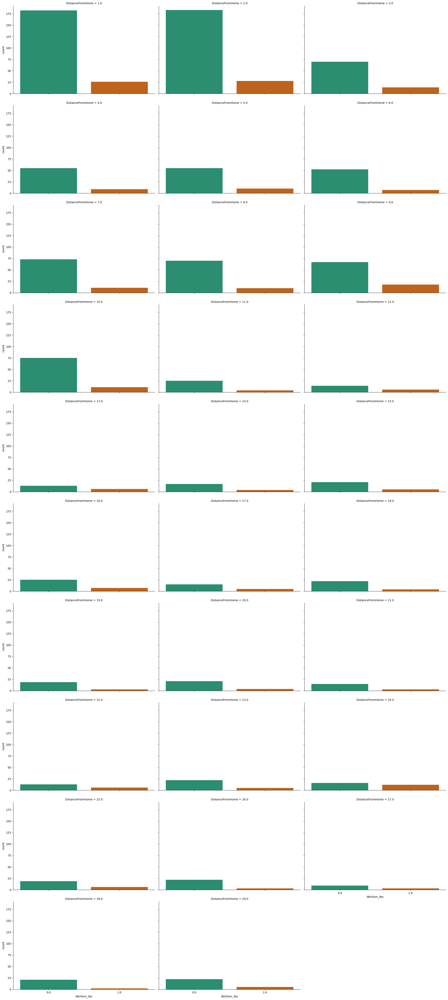

In [250]:
sns.catplot(x= 'Attrition_Yes', col= 'DistanceFromHome', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

People who did not go through attrition had less distance from home than the ones who did go through attrition.

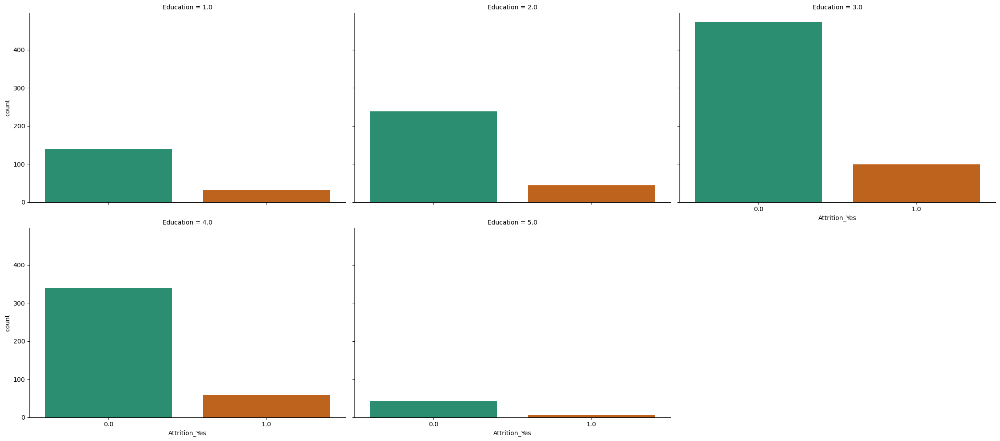

In [251]:
sns.catplot(x= 'Attrition_Yes', col= 'Education', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

People who did not go through attrition belonged from education category 3. The same is for the employees who did go through attrition.

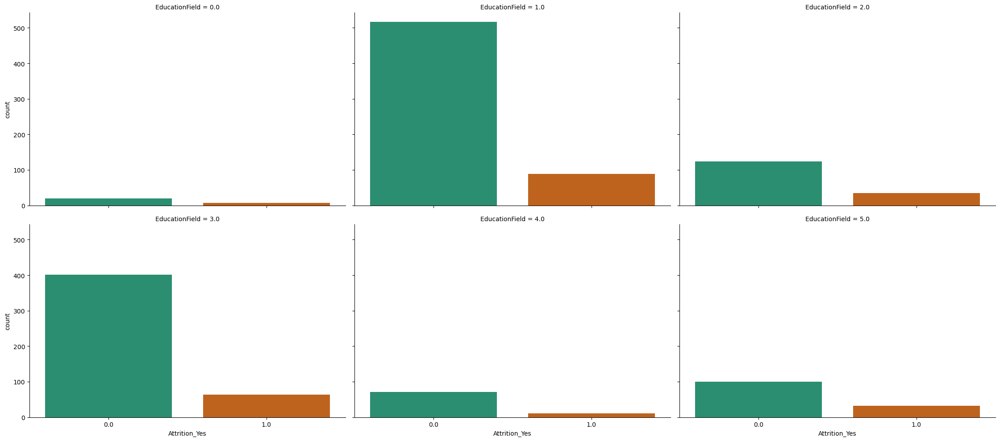

In [252]:
sns.catplot(x= 'Attrition_Yes', col= 'EducationField', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

People who did not go through attrition are from education field 1 and it is the same for people who did go through attrition.

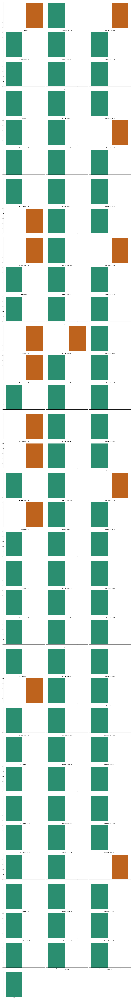

In [254]:
sns.catplot(x= 'Attrition_Yes', col= 'EmployeeNumber', data = attrition_data_encoded.head(100), kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

No conclusive statements can be made from above plots.

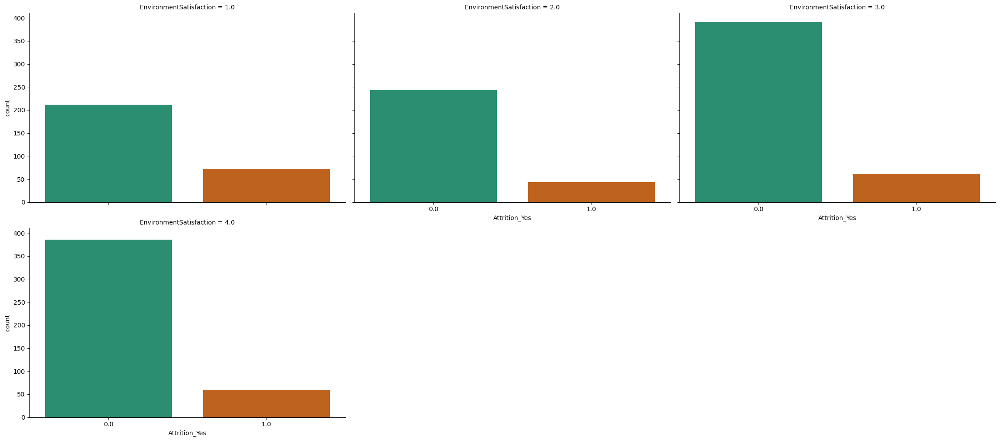

In [255]:
sns.catplot(x= 'Attrition_Yes', col= 'EnvironmentSatisfaction', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

People who did not go through attrition have higher environemntal satisfaction than the people who did go through attrition.

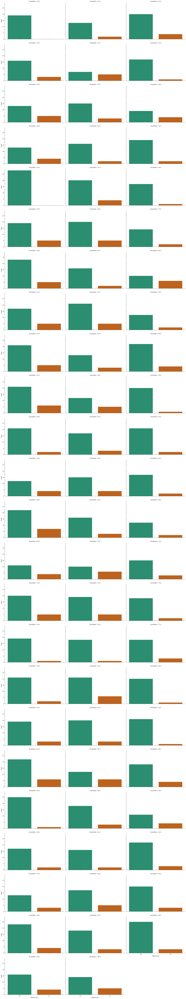

In [256]:
sns.catplot(x= 'Attrition_Yes', col= 'HourlyRate', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

People who did not go through attritiona nd did go through attrition came from alll types of hourly rate.

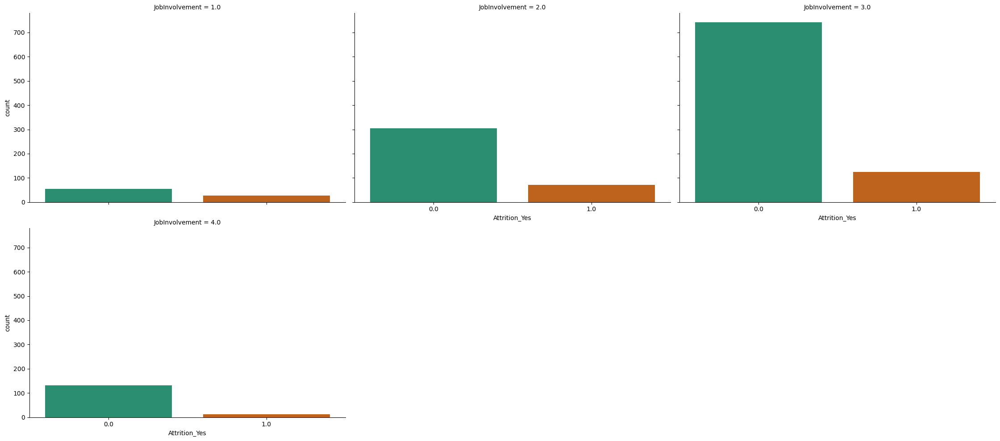

In [257]:
sns.catplot(x= 'Attrition_Yes', col= 'JobInvolvement', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

employees who didnt go through attrition had a job involvement of 3 and same is for employees who di go through attrition.

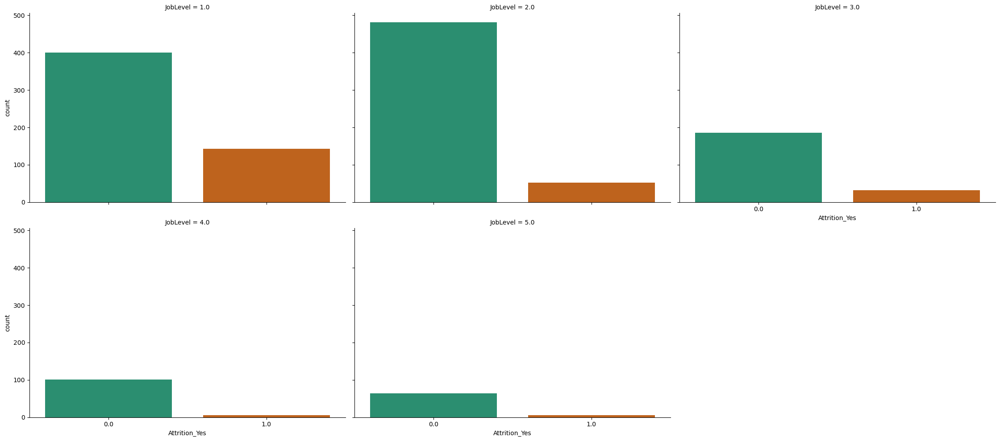

In [258]:
sns.catplot(x= 'Attrition_Yes', col= 'JobLevel', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

Most of the pemployees who did not through attrition are from job level 1 and 2, and it is the same for employees who did go through attrition.

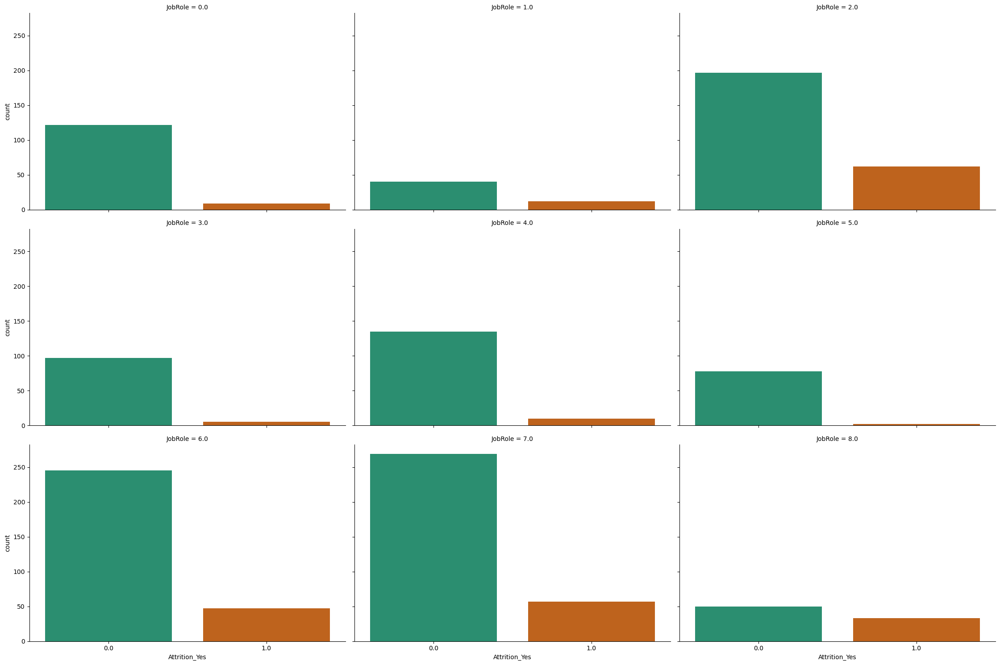

In [259]:
sns.catplot(x= 'Attrition_Yes', col= 'JobRole', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

Most of the employees who did not go through attrition came from job role 6 and 7.

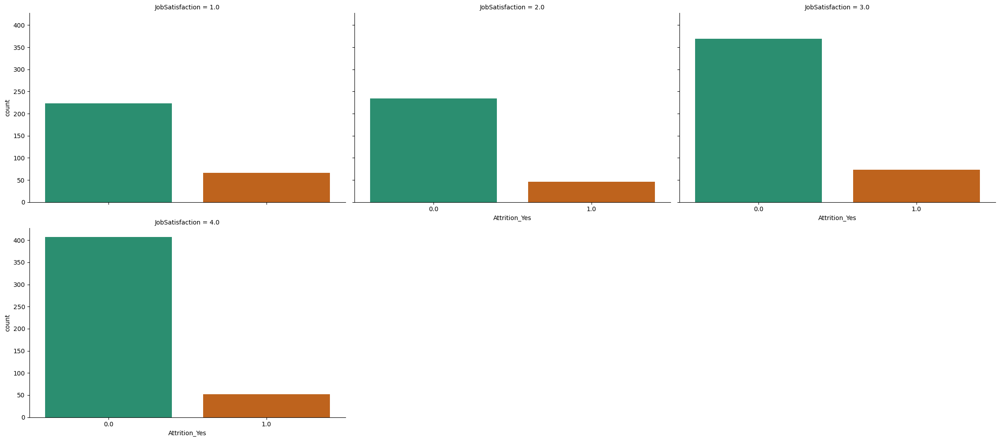

In [260]:
sns.catplot(x= 'Attrition_Yes', col= 'JobSatisfaction', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

Most of the employees who did not go through attrition had higher job satisfaction than the ones who did.

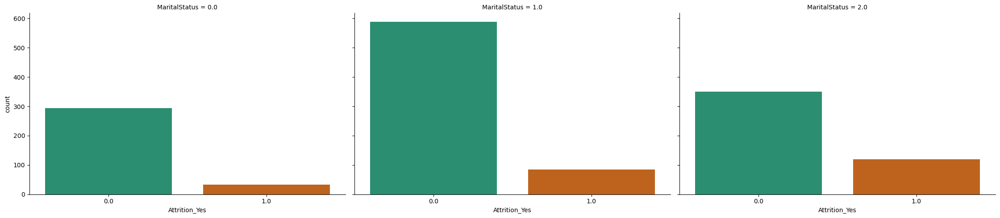

In [261]:
sns.catplot(x= 'Attrition_Yes', col= 'MaritalStatus', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

Most of the people who did not go through attrition were married compared to the ones who did.

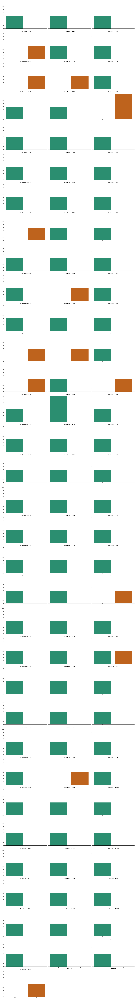

In [263]:
sns.catplot(x= 'Attrition_Yes', col= 'MonthlyIncome', data = attrition_data_encoded.head(100), kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

Most of the employees who went through attrition had a monthly income of 2293 wheras the ones who did not had a monthly income of 40111.

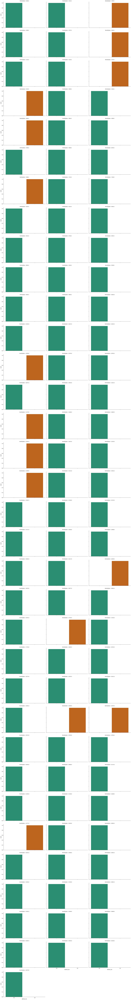

In [265]:
sns.catplot(x= 'Attrition_Yes', col= 'MonthlyRate', data = attrition_data_encoded.head(100), kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

No conclusive statements can be derived from the above plots.

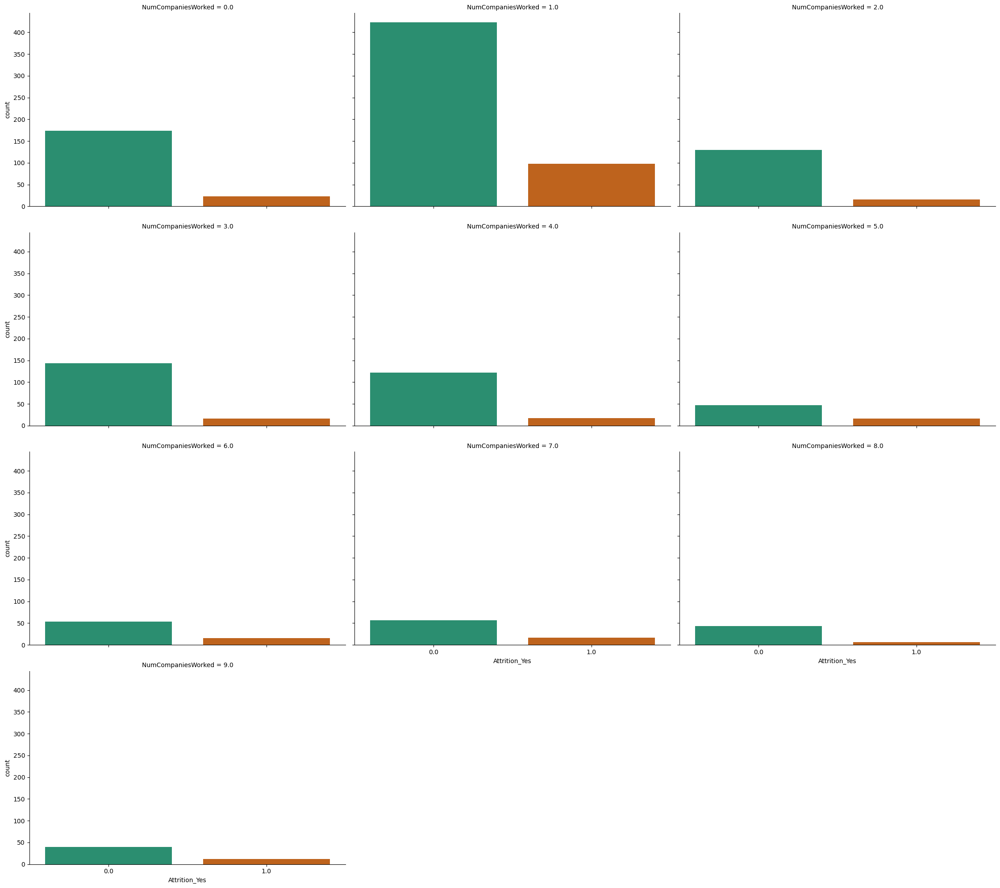

In [266]:
sns.catplot(x= 'Attrition_Yes', col= 'NumCompaniesWorked', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

Number of companies worked was 1 for the employees who did not go through attrition than the ones who did.

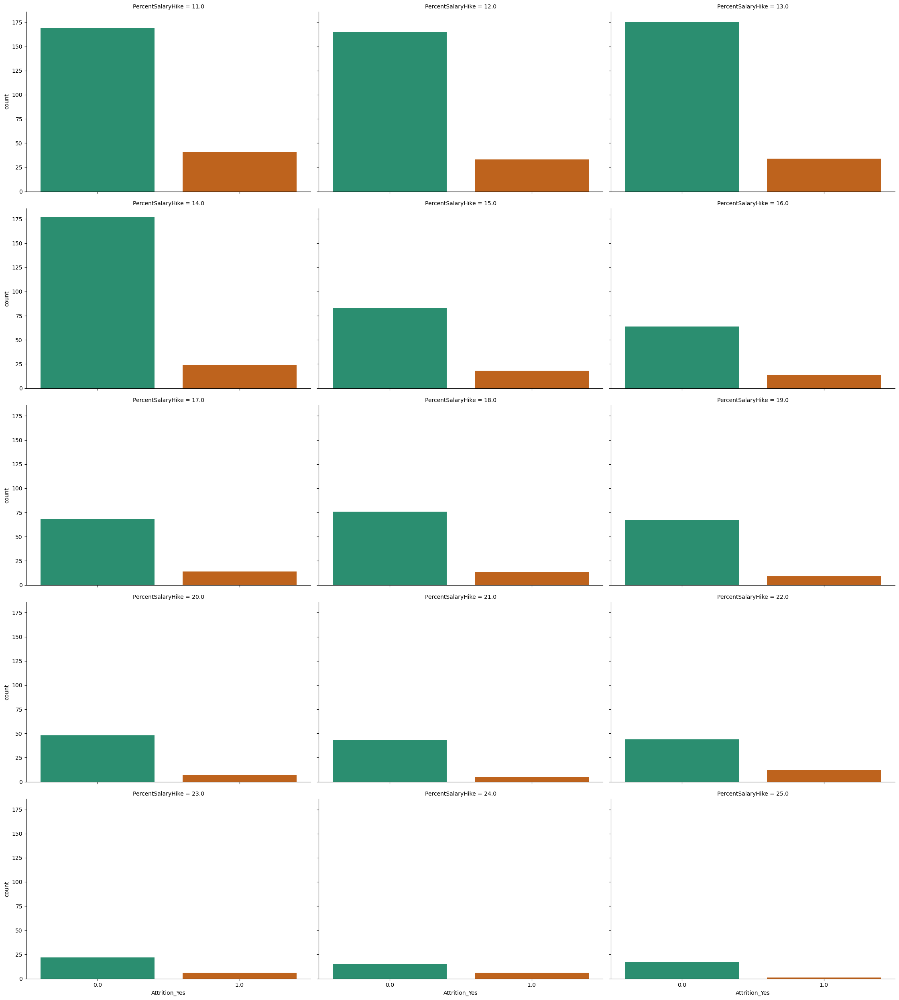

In [267]:
sns.catplot(x= 'Attrition_Yes', col= 'PercentSalaryHike', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

Percent salary hike of most of the people who did not go through attrition were from 11 to 14 percent and was the same for employees who did go through attrition.

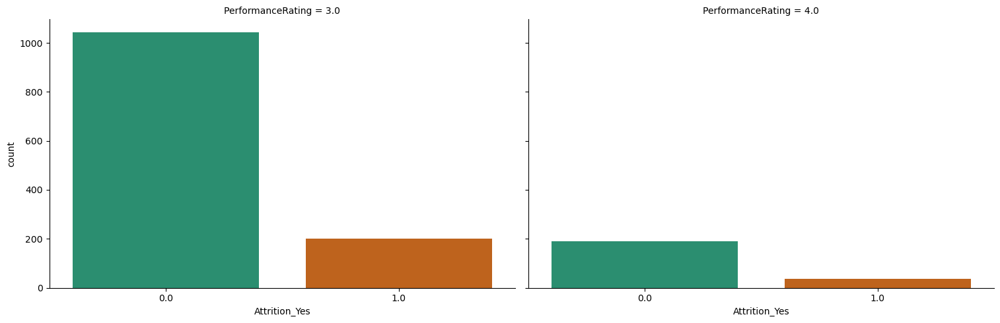

In [268]:
sns.catplot(x= 'Attrition_Yes', col= 'PerformanceRating', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

In [ ]:
Most of the employees who did not go through attrition had a performance rating of 3, and it was the same for employees who did.

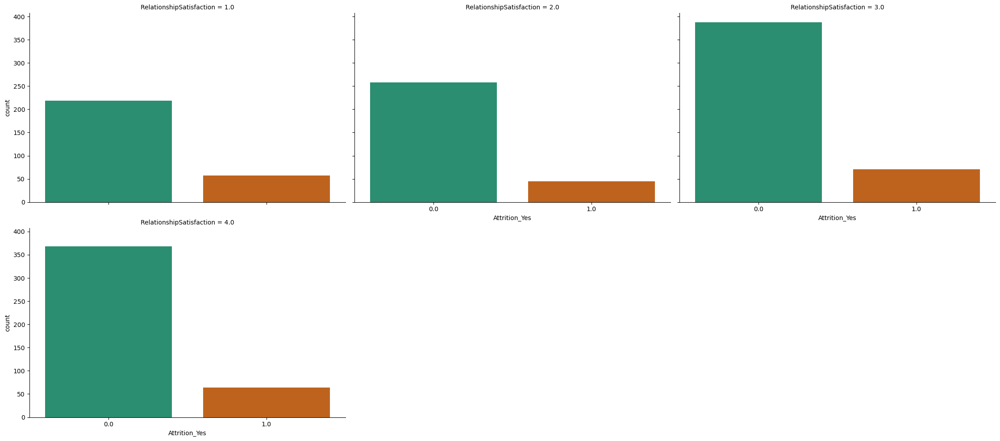

In [269]:
sns.catplot(x= 'Attrition_Yes', col= 'RelationshipSatisfaction', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

People who did not go through attrition had a relationship satisfaction of 3 same as the ones who did.

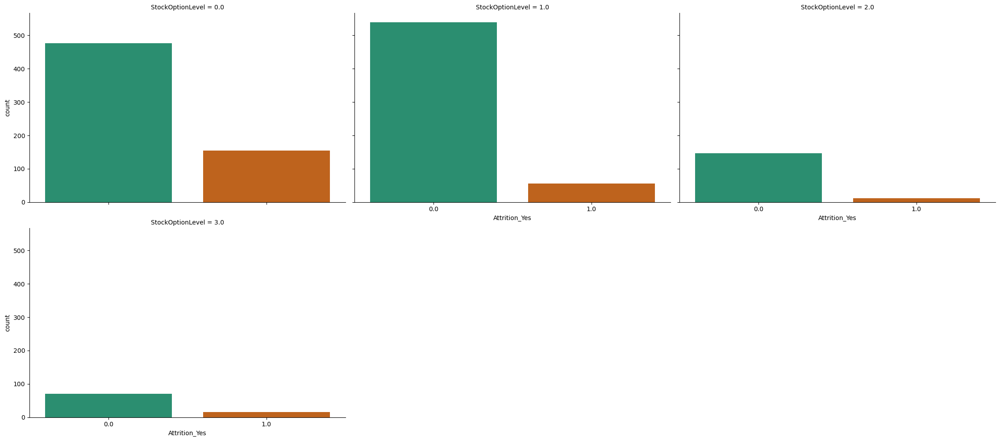

In [270]:
sns.catplot(x= 'Attrition_Yes', col= 'StockOptionLevel', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

Most of the employees who did not go through attrition had a stock option level 1 whereas the ones who did had stock option level 0.

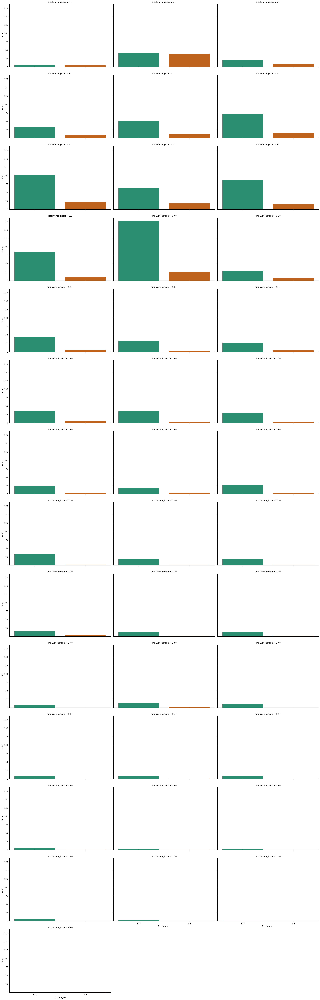

In [271]:
sns.catplot(x= 'Attrition_Yes', col= 'TotalWorkingYears', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

The total working years of the people who did not go through attrition was 10 and the one who did was 1.

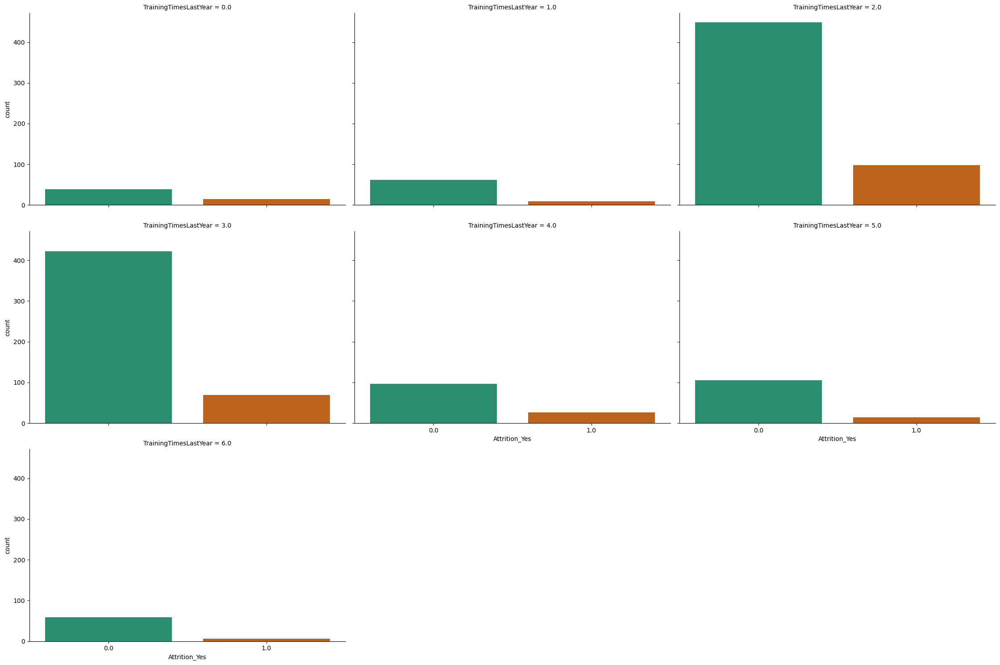

In [272]:
sns.catplot(x= 'Attrition_Yes', col= 'TrainingTimesLastYear', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

most of the people who did not go through attrition had training times last year of around 2 to 3., which is the same for the people who did.

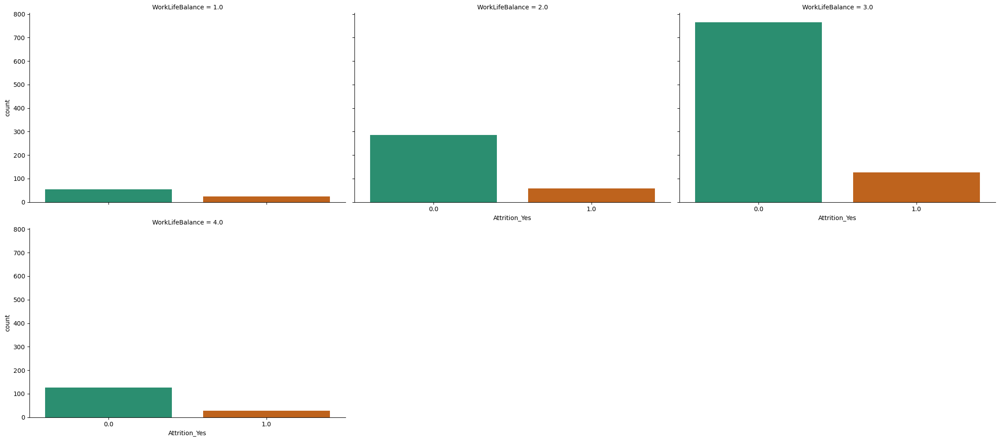

In [273]:
sns.catplot(x= 'Attrition_Yes', col= 'WorkLifeBalance', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

most of the people who did not go through attrition had work life balance score of 3 which is the same for the people who did.

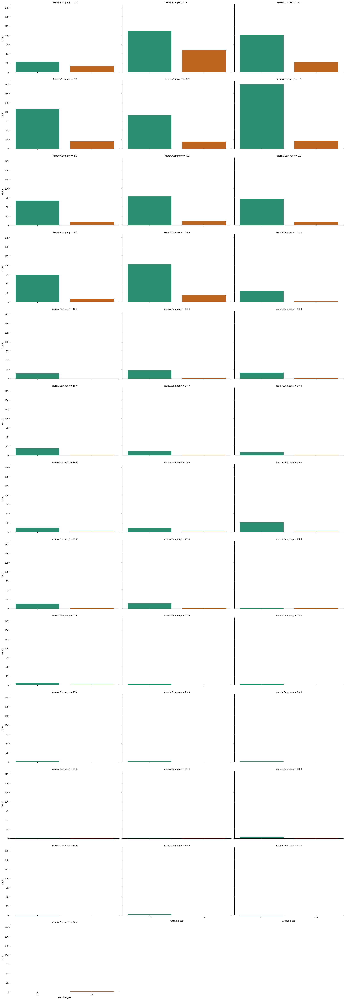

In [274]:
sns.catplot(x= 'Attrition_Yes', col= 'YearsAtCompany', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

most of the people who did not go through attrition had 3 years in the company whearas it is 1 for the people who did.

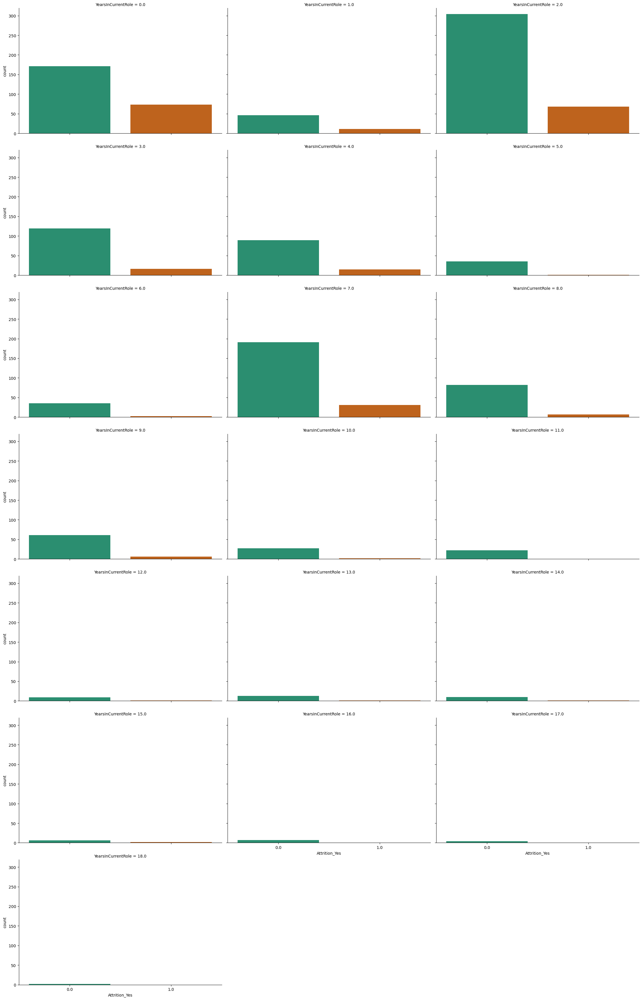

In [275]:
sns.catplot(x= 'Attrition_Yes', col= 'YearsInCurrentRole', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

most of the people who did not go through attrition had 2 years in the current role whearas it is 0 and 2 for the people who did.

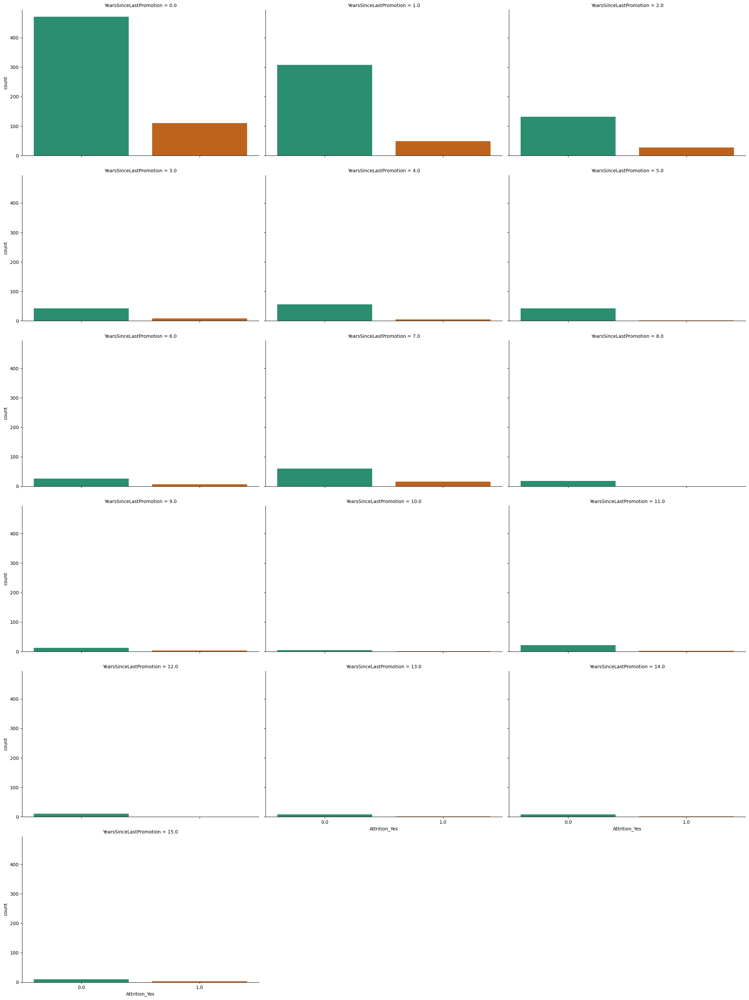

In [276]:
sns.catplot(x= 'Attrition_Yes', col= 'YearsSinceLastPromotion', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

most of the employees who did not go through attrition had 0 years from last promotion wheras the ones who did had the same.

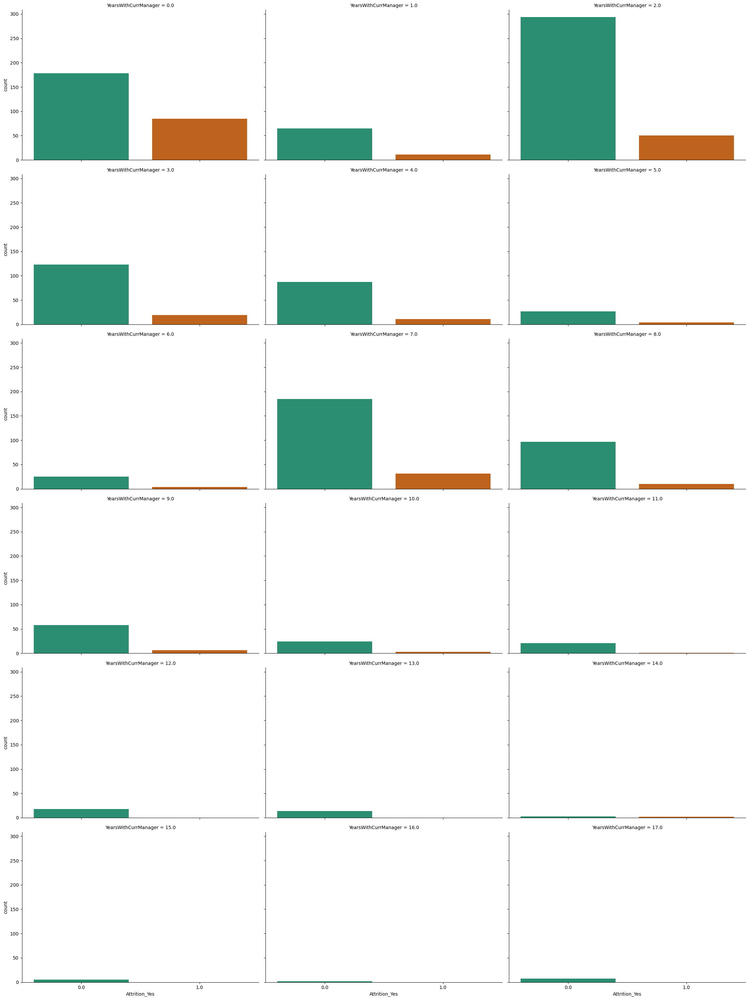

In [277]:
sns.catplot(x= 'Attrition_Yes', col= 'YearsWithCurrManager', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

People who did not go through attrition had 2 years with current manger wheras the ones who did had 0.

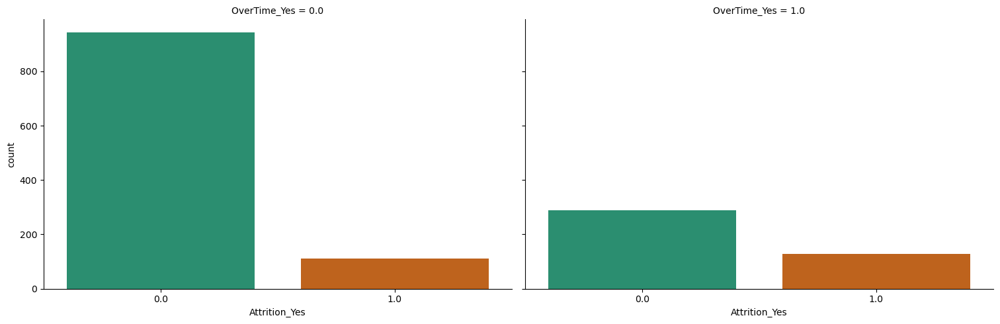

In [278]:
sns.catplot(x= 'Attrition_Yes', col= 'OverTime_Yes', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

Most of the people who did not go through attrition had less overtime compared to the one who did.

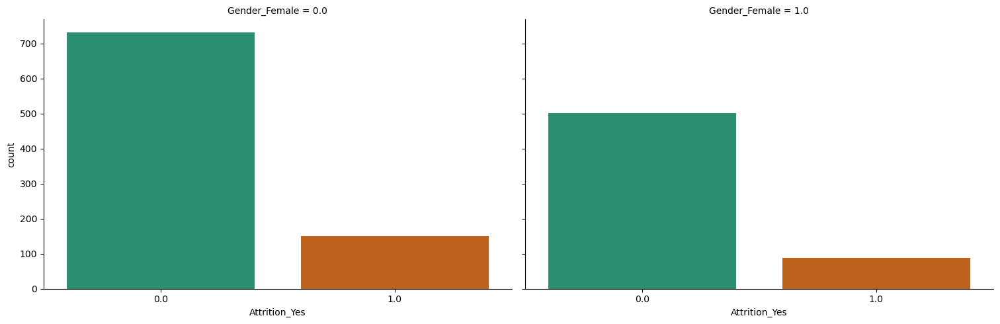

In [279]:
sns.catplot(x= 'Attrition_Yes', col= 'Gender_Female', data = attrition_data_encoded, kind="count", palette='Dark2',height=5, aspect=1.5, col_wrap=3)

Most of the peoplw who didnt and di get through attrition were high for males than females.

Multivariate analysis

Pairplots

In [284]:
attrition_rate_first_50 = attrition_data_encoded.head(50)
sns.pairplot(attrition_rate_first_50, hue='Attrition_Yes', palette='Set2_r')
plt.show()

In [ ]:
There are no conclusive statements we can get from the paiplots

Boxplots.

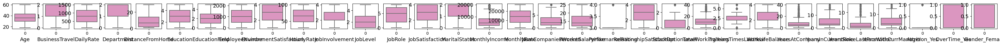

In [285]:
plt.figure(figsize=(45,45),facecolor = "white")
plotnumber=1
for col in attrition_data_encoded:
    if plotnumber<=33:
        wc=plt.subplot(32,32,plotnumber)
        sns.boxplot(attrition_data_encoded[col],palette="Set2_r")
        plt.xlabel(col,rotation=0,fontsize = 13)
        plt.yticks(rotation = 0, fontsize = 13)
    plotnumber+=1
plt.show()

MonthlyIncome, NumCompaniesWorked, PerformanceRating, StockOptionLevel, TotalWorkingYears, TrainingTimesLastYear, YearsAtCompany, YearsInCurrentRole, YearsSinceLastPromotion, YearsWithCurrManager have outliers in their columns. 

Skewness.

In [286]:
attrition_data_encoded.skew()

Age                         0.413286
BusinessTravel             -1.439006
DailyRate                  -0.003519
Department                  0.172231
DistanceFromHome            0.958118
Education                  -0.289681
EducationField              0.550371
EmployeeNumber              0.016574
EnvironmentSatisfaction    -0.321654
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    1.025401
JobRole                    -0.357270
JobSatisfaction            -0.329672
MaritalStatus              -0.152175
MonthlyIncome               1.369817
MonthlyRate                 0.018578
NumCompaniesWorked          1.026471
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.968980
TotalWorkingYears           1.117172
TrainingTimesLastYear       0.553124
WorkLifeBalance            -0.552480
YearsAtCompany              1.764529
YearsInCurrentRole          0.917363
Y

Most of the skewness are well within the limits, so we dont need any further modifications.

Distribution plots

C:\Users\ACHU NARAYAN\AppData\Local\Temp\ipykernel_3404\1642078414.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(attrition_data_encoded['Attrition_Yes'],color="b", kde_kws={"shade":True}, hist=False)
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\distributions.py:2511: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


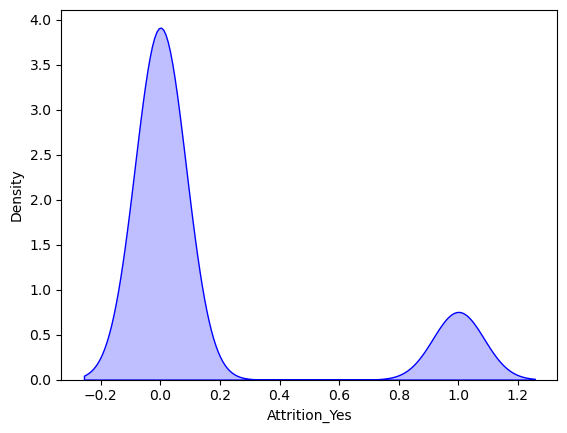

In [287]:
sns.distplot(attrition_data_encoded['Attrition_Yes'],color="b", kde_kws={"shade":True}, hist=False)
plt.show()

The attrition yes column is skewed to the right, which is people who did not go through attrition.

let's finalise the datatype of all the values in our columns into float64 using the ordinal encoding.

In [288]:
from sklearn.preprocessing import OrdinalEncoder
OE=OrdinalEncoder()
for i in attrition_data_encoded.columns:
    if attrition_data_encoded[i].dtypes=='int64':
        attrition_data_encoded[i]=OE.fit_transform(attrition_data_encoded[i].values.reshape(-1,1))
attrition_data_encoded

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,...,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition_Yes,OverTime_Yes,Gender_Female
0,41.0,2.0,1102.0,2.0,1.0,2.0,1.0,1.0,2.0,94.0,...,8.0,0.0,1.0,6.0,4.0,0.0,5.0,1.0,1.0,1.0
1,49.0,1.0,279.0,1.0,8.0,1.0,1.0,2.0,3.0,61.0,...,10.0,3.0,3.0,10.0,7.0,1.0,7.0,0.0,0.0,0.0
2,37.0,2.0,1373.0,1.0,2.0,2.0,4.0,4.0,4.0,92.0,...,7.0,3.0,3.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
3,33.0,1.0,1392.0,1.0,3.0,4.0,1.0,5.0,4.0,56.0,...,8.0,3.0,3.0,8.0,7.0,3.0,0.0,0.0,1.0,1.0
4,27.0,2.0,591.0,1.0,2.0,1.0,3.0,7.0,1.0,40.0,...,6.0,3.0,3.0,2.0,2.0,2.0,2.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36.0,1.0,884.0,1.0,23.0,2.0,3.0,2061.0,3.0,41.0,...,17.0,3.0,3.0,5.0,2.0,0.0,3.0,0.0,0.0,0.0
1466,39.0,2.0,613.0,1.0,6.0,1.0,3.0,2062.0,4.0,42.0,...,9.0,5.0,3.0,7.0,7.0,1.0,7.0,0.0,0.0,0.0
1467,27.0,2.0,155.0,1.0,4.0,3.0,1.0,2064.0,2.0,87.0,...,6.0,0.0,3.0,6.0,2.0,0.0,3.0,0.0,1.0,0.0
1468,49.0,1.0,1023.0,2.0,2.0,3.0,3.0,2065.0,4.0,63.0,...,17.0,3.0,2.0,9.0,6.0,0.0,8.0,0.0,0.0,0.0


Now let's check for correlation between different values in the dataset.

In [289]:
correlation = attrition_data_encoded.corr()
correlation

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,...,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition_Yes,OverTime_Yes,Gender_Female
Age,1.000000,0.024751,0.010661,-0.031882,-0.001686,0.208034,-0.040873,-0.010145,0.010146,0.024287,...,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089,-0.159205,0.028062,0.036311
BusinessTravel,0.024751,1.000000,-0.004086,-0.009044,-0.024469,0.000757,0.023724,-0.015578,0.004174,0.026528,...,0.034226,0.015240,-0.011256,-0.014575,-0.011497,-0.032591,-0.022636,0.000074,0.016543,0.032981
DailyRate,0.010661,-0.004086,1.000000,0.007109,-0.004985,-0.016806,0.037709,-0.050990,0.018355,0.023381,...,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363,-0.056652,0.009135,0.011716
Department,-0.031882,-0.009044,0.007109,1.000000,0.017225,0.007996,0.013720,-0.010895,-0.019395,-0.004144,...,-0.015762,0.036875,0.026383,0.022920,0.056315,0.040061,0.034282,0.063991,0.007481,0.041583
DistanceFromHome,-0.001686,-0.024469,-0.004985,0.017225,1.000000,0.021042,0.002013,0.032916,-0.016075,0.031131,...,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406,0.077924,0.025514,0.001851
Education,0.208034,0.000757,-0.016806,0.007996,0.021042,1.000000,-0.039592,0.042070,-0.027128,0.016775,...,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065,-0.031373,-0.020322,0.016547
EducationField,-0.040873,0.023724,0.037709,0.013720,0.002013,-0.039592,1.000000,-0.002516,0.043163,-0.021941,...,-0.027848,0.049195,0.041191,-0.018692,-0.010506,0.002326,-0.004130,0.026846,0.002259,0.002504
EmployeeNumber,-0.010145,-0.015578,-0.050990,-0.010895,0.032916,0.042070,-0.002516,1.000000,0.017621,0.035179,...,-0.014365,0.023603,0.010309,-0.011240,-0.008416,-0.009019,-0.009197,-0.010577,-0.024037,-0.022556
EnvironmentSatisfaction,0.010146,0.004174,0.018355,-0.019395,-0.016075,-0.027128,0.043163,0.017621,1.000000,-0.049857,...,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999,-0.103369,0.070132,-0.000508
HourlyRate,0.024287,0.026528,0.023381,-0.004144,0.031131,0.016775,-0.021941,0.035179,-0.049857,1.000000,...,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123,-0.006846,-0.007782,0.000478


Lets visualise it using the heatmap.

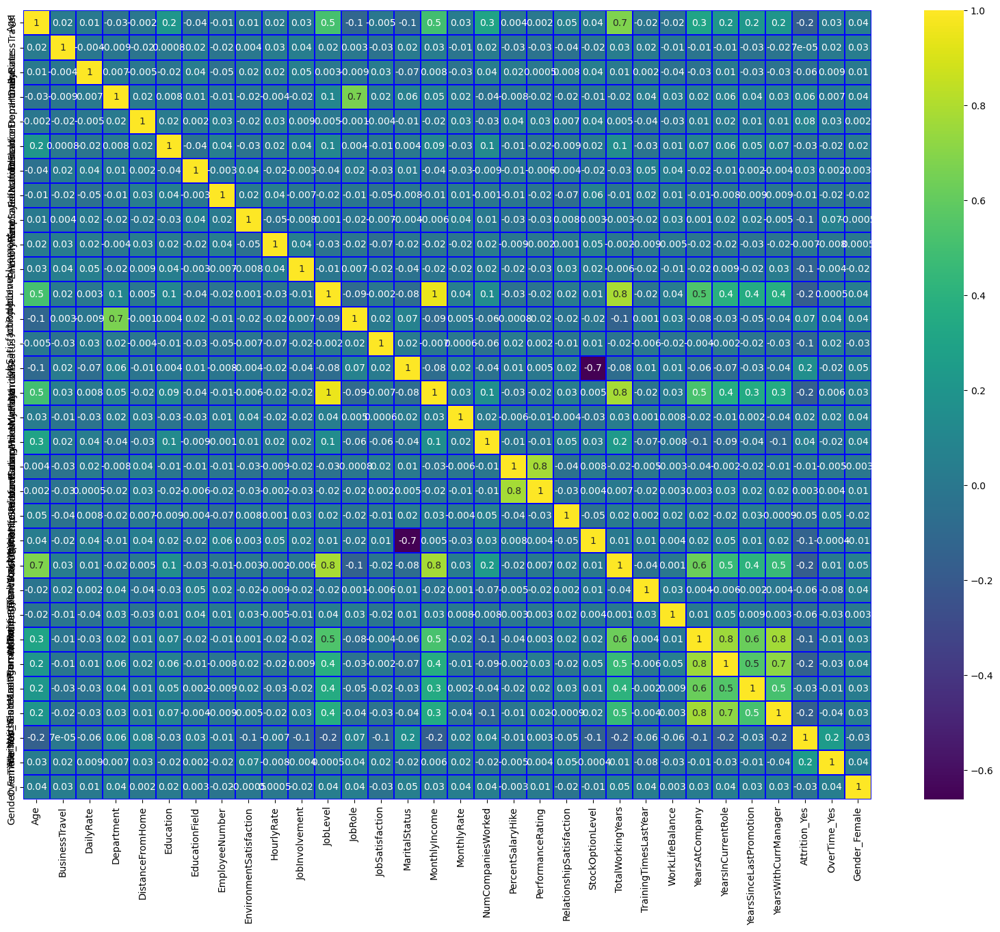

In [290]:
plt.figure(figsize = (20,15))
sns.heatmap(attrition_data_encoded.corr(), linewidths = 0.1, fmt = ".1g", linecolor= "blue", annot=True, cmap= "viridis")
plt.yticks(rotation=90);
plt.show()

Below are the finding from the correlations we have achieved for different variables-

1) There is a high negative correlation between stock option level and marital status.
2) There is high positive correlation between marital status and monthly income.
3) There is a hgih positive correlation between percent salary hike and performance rating
4) YearsAtCompany,YearsInCurrentRole, YearsSinceLastPromotion,YearsWithCurrManager are all positively correlated with each other.
5) Monthly income, total working years and job level have positive ocrrelation with each other.
6) Total working years and age are positively correlated.

Lets sort the correlations based on our target column.

In [291]:
correlation['Attrition_Yes'].sort_values(ascending = False)

Attrition_Yes               1.000000
OverTime_Yes                0.246118
MaritalStatus               0.162070
DistanceFromHome            0.077924
JobRole                     0.067151
Department                  0.063991
NumCompaniesWorked          0.043494
EducationField              0.026846
MonthlyRate                 0.015170
PerformanceRating           0.002889
BusinessTravel              0.000074
HourlyRate                 -0.006846
EmployeeNumber             -0.010577
PercentSalaryHike          -0.013478
Gender_Female              -0.029453
Education                  -0.031373
YearsSinceLastPromotion    -0.033019
RelationshipSatisfaction   -0.045872
DailyRate                  -0.056652
TrainingTimesLastYear      -0.059478
WorkLifeBalance            -0.063939
EnvironmentSatisfaction    -0.103369
JobSatisfaction            -0.103481
JobInvolvement             -0.130016
YearsAtCompany             -0.134392
StockOptionLevel           -0.137145
YearsWithCurrManager       -0.156199
A

Lets visualise it using the boc plots.

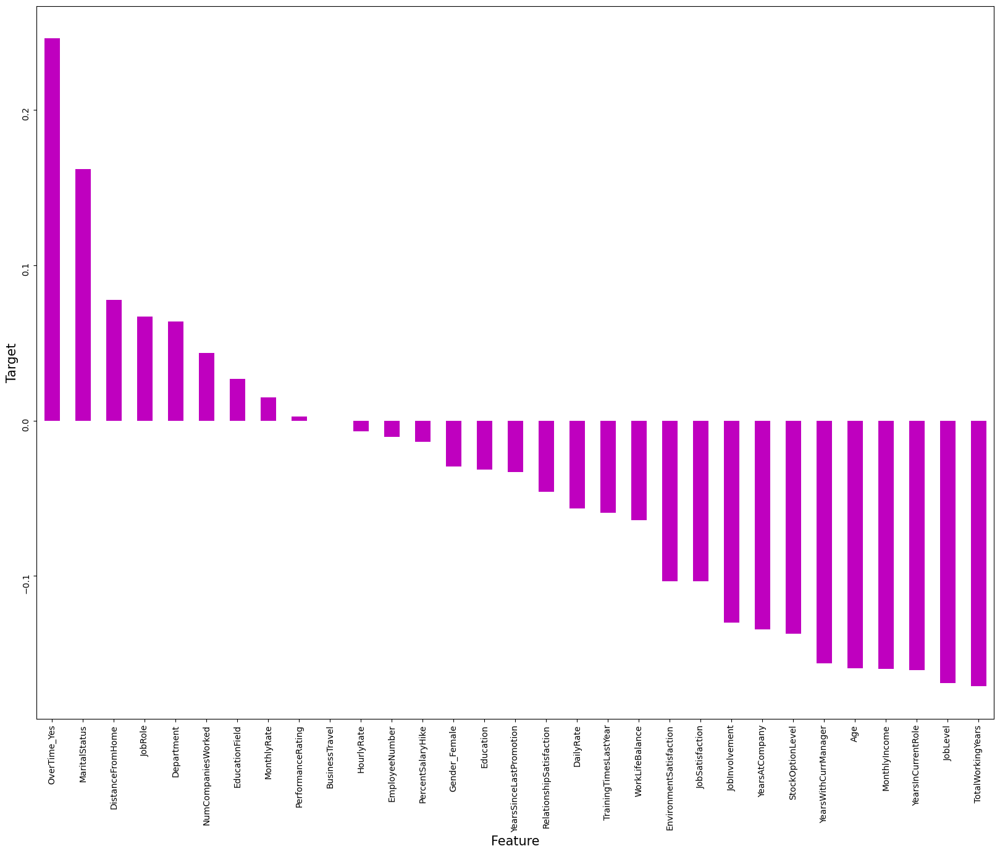

In [292]:
plt.figure(figsize = (20,15))
correlation['Attrition_Yes'].sort_values(ascending=False).drop(['Attrition_Yes']).plot(kind='bar',color="m")
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.yticks(rotation=90);
plt.show()

Below are the list of columns with very less correlations-

DistanceFromHome            0.077924
JobRole                     0.067151
Department                  0.063991
NumCompaniesWorked          0.043494
EducationField              0.026846
MonthlyRate                 0.015170
PerformanceRating           0.002889
BusinessTravel              0.000074
HourlyRate                 -0.006846
EmployeeNumber             -0.010577
PercentSalaryHike          -0.013478
Gender_Female              -0.029453
Education                  -0.031373
YearsSinceLastPromotion    -0.033019
RelationshipSatisfaction   -0.045872
DailyRate                  -0.056652
TrainingTimesLastYear      -0.059478
WorkLifeBalance            -0.063939

Variance Inflation Factor

Lets declare the x and y variable in order to scale it using the standard scaler to derive vif values.

In [293]:
x = attrition_data_encoded.drop("Attrition_Yes", axis=1)
y = attrition_data_encoded["Attrition_Yes"]

In [294]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,...,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,OverTime_Yes,Gender_Female
0,0.446350,0.590048,0.742527,1.401512,-1.010909,-0.891688,-0.937414,-1.701283,-0.660531,1.383138,...,-0.932014,-0.421642,-2.171982,-2.493820,-0.164613,-0.063296,-0.679146,0.245834,1.591746,1.224745
1,1.322365,-0.913194,-1.297775,-0.493817,-0.147150,-1.868426,-0.937414,-1.699621,0.254625,-0.240677,...,0.241988,-0.164511,0.155707,0.338096,0.488508,0.764998,-0.368715,0.806541,-0.628241,-0.816497
2,0.008343,0.590048,1.414363,-0.493817,-0.887515,-0.891688,1.316673,-1.696298,1.169781,1.284725,...,-0.932014,-0.550208,0.155707,0.338096,-1.144294,-1.167687,-0.679146,-1.155935,1.591746,-0.816497
3,-0.429664,-0.913194,1.461466,-0.493817,-0.764121,1.061787,-0.937414,-1.694636,1.169781,-0.486709,...,-0.932014,-0.421642,0.155707,0.338096,0.161947,0.764998,0.252146,-1.155935,1.591746,1.224745
4,-1.086676,0.590048,-0.524295,-0.493817,-0.887515,-1.868426,0.565311,-1.691313,-1.575686,-1.274014,...,0.241988,-0.678774,0.155707,0.338096,-0.817734,-0.615492,-0.058285,-0.595227,-0.628241,-0.816497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,-0.101159,-0.913194,0.202082,-0.493817,1.703764,-0.891688,0.565311,1.721670,0.254625,-1.224807,...,0.241988,0.735447,0.155707,0.338096,-0.327893,-0.615492,-0.679146,-0.314873,-0.628241,-0.816497
1466,0.227347,0.590048,-0.469754,-0.493817,-0.393938,-1.868426,0.565311,1.723332,1.169781,-1.175601,...,0.241988,-0.293077,1.707500,0.338096,-0.001333,0.764998,-0.368715,0.806541,-0.628241,-0.816497
1467,-1.086676,0.590048,-1.605183,-0.493817,-0.640727,0.085049,-0.937414,1.726655,-0.660531,1.038693,...,0.241988,-0.678774,-2.171982,0.338096,-0.164613,-0.615492,-0.679146,-0.314873,1.591746,-0.816497
1468,1.322365,-0.913194,0.546677,1.401512,-0.887515,0.085049,0.565311,1.728317,1.169781,-0.142264,...,-0.932014,0.735447,0.155707,-1.077862,0.325228,0.488900,-0.679146,1.086895,-0.628241,-0.816497


In [295]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns

vif

,VIF values,Features
0,2.054226,Age
1,1.016808,BusinessTravel
2,1.026401,DailyRate
3,1.942165,Department
4,1.018096,DistanceFromHome
5,1.065295,Education
6,1.016240,EducationField
7,1.022699,EmployeeNumber
8,1.018022,EnvironmentSatisfaction
9,1.021984,HourlyRate


Almost all columns have acceptable levels of variance inflation factors but we will removing the following columns due to very low correlation-
'DistanceFromHome','JobRole','Department','NumCompaniesWorked','EducationField','MonthlyRate','PerformanceRating','BusinessTravel','HourlyRate','EmployeeNumber','PercentSalaryHike','Gender_Female','Education','YearsSinceLastPromotion','RelationshipSatisfaction','DailyRate','TrainingTimesLastYear','WorkLifeBalance'

In [296]:
columns_with_low_corelation_and_high_VIF = ['DistanceFromHome','JobRole','Department','NumCompaniesWorked','EducationField','MonthlyRate','PerformanceRating','BusinessTravel','HourlyRate','EmployeeNumber','PercentSalaryHike','Gender_Female','Education','YearsSinceLastPromotion','RelationshipSatisfaction','DailyRate','TrainingTimesLastYear','WorkLifeBalance']
attrition_data_encoded = attrition_data_encoded.drop(columns=columns_with_low_corelation_and_high_VIF)

Now let's again check the variance inflation factor of our processed columns.

In [297]:
x = attrition_data_encoded.drop("Attrition_Yes", axis=1)
y = attrition_data_encoded["Attrition_Yes"]

In [298]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,Age,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,MaritalStatus,MonthlyIncome,StockOptionLevel,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager,OverTime_Yes
0,0.446350,-0.660531,0.379672,-0.057788,1.153254,1.236820,-0.108350,-0.932014,-0.421642,-0.164613,-0.063296,0.245834,1.591746
1,1.322365,0.254625,-1.026167,-0.057788,-0.660853,-0.133282,-0.291719,0.241988,-0.164511,0.488508,0.764998,0.806541,-0.628241
2,0.008343,1.169781,-1.026167,-0.961486,0.246200,1.236820,-0.937654,-0.932014,-0.550208,-1.144294,-1.167687,-1.155935,1.591746
3,-0.429664,1.169781,0.379672,-0.961486,0.246200,-0.133282,-0.763634,-0.932014,-0.421642,0.161947,0.764998,-1.155935,1.591746
4,-1.086676,-1.575686,0.379672,-0.961486,-0.660853,-0.133282,-0.644858,0.241988,-0.678774,-0.817734,-0.615492,-0.595227,-0.628241
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,-0.101159,0.254625,1.785511,-0.057788,1.153254,-0.133282,-0.835451,0.241988,0.735447,-0.327893,-0.615492,-0.314873,-0.628241
1466,0.227347,1.169781,-1.026167,0.845911,-1.567907,-0.133282,0.741140,0.241988,-0.293077,-0.001333,0.764998,0.806541,-0.628241
1467,-1.086676,-0.660531,1.785511,-0.057788,-0.660853,-0.133282,-0.076690,0.241988,-0.678774,-0.164613,-0.615492,-0.314873,1.591746
1468,1.322365,1.169781,-1.026167,-0.057788,-0.660853,-0.133282,-0.236474,-0.932014,0.735447,0.325228,0.488900,1.086895,-0.628241


In [299]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns

vif

,VIF values,Features
0,1.965382,Age
1,1.007064,EnvironmentSatisfaction
2,1.009414,JobInvolvement
3,11.094906,JobLevel
4,1.006041,JobSatisfaction
5,1.812335,MaritalStatus
6,10.716744,MonthlyIncome
7,1.798535,StockOptionLevel
8,4.518154,TotalWorkingYears
9,4.012379,YearsAtCompany


All vif values are corrected.

Now lets correct the y value count distribution using the SMOTE analysis.

In [300]:
y.value_counts()

0.0    1233
1.0     237
Name: Attrition_Yes, dtype: int64

In [301]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x1,y1 = SM.fit_resample(x,y)

In [302]:
y1.value_counts()

1.0    1233
0.0    1233
Name: Attrition_Yes, dtype: int64

The value counts have been corrected.

Z-score 

We will removing all the values with z-score above3/-3.

In [304]:
from scipy.stats import zscore
out_features=attrition_data_encoded[['EnvironmentSatisfaction','JobInvolvement','JobLevel','JobSatisfaction','MaritalStatus','MonthlyIncome','StockOptionLevel','TotalWorkingYears','YearsAtCompany','YearsInCurrentRole','YearsWithCurrManager','OverTime_Yes']]
z=np.abs(zscore(out_features))
z

,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,MaritalStatus,MonthlyIncome,StockOptionLevel,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager,OverTime_Yes
0,0.660531,0.379672,0.057788,1.153254,1.236820,0.108350,0.932014,0.421642,0.164613,0.063296,0.245834,1.591746
1,0.254625,1.026167,0.057788,0.660853,0.133282,0.291719,0.241988,0.164511,0.488508,0.764998,0.806541,0.628241
2,1.169781,1.026167,0.961486,0.246200,1.236820,0.937654,0.932014,0.550208,1.144294,1.167687,1.155935,1.591746
3,1.169781,0.379672,0.961486,0.246200,0.133282,0.763634,0.932014,0.421642,0.161947,0.764998,1.155935,1.591746
4,1.575686,0.379672,0.961486,0.660853,0.133282,0.644858,0.241988,0.678774,0.817734,0.615492,0.595227,0.628241
...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0.254625,1.785511,0.057788,1.153254,0.133282,0.835451,0.241988,0.735447,0.327893,0.615492,0.314873,0.628241
1466,1.169781,1.026167,0.845911,1.567907,0.133282,0.741140,0.241988,0.293077,0.001333,0.764998,0.806541,0.628241
1467,0.660531,1.785511,0.057788,0.660853,0.133282,0.076690,0.241988,0.678774,0.164613,0.615492,0.314873,1.591746
1468,1.169781,1.026167,0.057788,0.660853,0.133282,0.236474,0.932014,0.735447,0.325228,0.488900,1.086895,0.628241


In [305]:
np.where(z>3)

(array([  28,   62,   63,   85,   98,   98,  123,  123,  126,  126,  153,
         187,  187,  190,  190,  231,  231,  237,  270,  270,  281,  386,
         401,  411,  425,  445,  466,  473,  477,  561,  561,  592,  595,
         595,  616,  624,  635,  653,  677,  686,  716,  746,  749,  861,
         875,  894,  914,  918,  926,  956,  962,  976, 1024, 1043, 1078,
        1086, 1111, 1116, 1116, 1135, 1138, 1184, 1301, 1327, 1348, 1351,
        1401, 1430], dtype=int64),
 array([10,  8,  9,  7,  7,  8,  9, 10,  7,  8, 10,  7, 10,  8,  9,  9, 10,
         8,  7,  8,  9, 10,  7,  8,  8,  7,  9,  8,  8,  8, 10,  8,  7,  8,
        10,  7, 10,  8,  8, 10,  9,  9,  8,  8, 10,  7,  8,  8, 10,  7,  8,
         9,  9,  7, 10,  8,  8,  7,  8,  8,  8,  7,  7,  9, 10,  9,  7,  9],
       dtype=int64))

Let's check the new shape of our dataframe.

In [307]:
attrition_data_new=attrition_data_encoded[(z<3).all(axis=1)]
attrition_data_new.shape

(1412, 14)

Lets check the data loss percentage after z-score normalisation.

In [308]:
data_loss_percentage = ((attrition_data_encoded.shape[0] - attrition_data_new.shape[0]) / attrition_data_encoded.shape[0]) * 100
print("Data Loss Percentage:", data_loss_percentage)

Data Loss Percentage: 3.9455782312925165


The data loss percentage is acceptable.

Let's finalise the y value counts using the SMOTE analysis again and proceed to predictions part of the project.

In [309]:
x = attrition_data_new.drop("Attrition_Yes", axis=1)
y = attrition_data_new["Attrition_Yes"]

In [310]:
y.value_counts()

0.0    1179
1.0     233
Name: Attrition_Yes, dtype: int64

In [311]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x1,y1 = SM.fit_resample(x,y)

In [312]:
y1.value_counts()

1.0    1179
0.0    1179
Name: Attrition_Yes, dtype: int64

Predictions

We will using a 70-30 split, and random forest clasifier to get the best accuracy score at the max random state.

In [313]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
maxaccuracy = 0
maxrandomstate = 0
for i in range(1,200):
      x_train,x_test,y_train,y_test = train_test_split(x1,y1, test_size = 0.30, random_state=i)
      RFC = RandomForestClassifier()
      RFC.fit(x_train,y_train)
pred=RFC.predict(x_test)
acc = accuracy_score(y_test, pred)
if acc>maxaccuracy:
    maxaccuracy=acc
    maxrandomstate=i
print("the best accuracy score",maxaccuracy,"at the following random state",maxrandomstate)

the best accuracy score 0.9279661016949152 at the following random state 199


We found the best accuracy score 0.9279661016949152 at the following random state 199.

Now let's train the model based on our processed dataframe.

In [314]:
x_train,x_test,y_train,y_test = train_test_split(x1,y1, test_size = 0.30, random_state=maxrandomstate)

We will be using RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier, SVC, and LogisticRegression for our predictions.

In [315]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score

In [316]:
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)
pred=RFC.predict(x_test)
print(accuracy_score(y_test, pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

0.9251412429378532
[[339  23]
 [ 30 316]]
              precision    recall  f1-score   support

         0.0       0.92      0.94      0.93       362
         1.0       0.93      0.91      0.92       346

    accuracy                           0.93       708
   macro avg       0.93      0.92      0.93       708
weighted avg       0.93      0.93      0.93       708



RandomForestClassifier gives an accuracy score of 0.925141242. precision,recall, and f1-score are within the same range.

In [317]:
LogReg = LogisticRegression(max_iter=1000)
LogReg.fit(x_train,y_train)
predLogReg=LogReg.predict(x_test)
print(accuracy_score(y_test, predLogReg))
print(confusion_matrix(y_test,predLogReg))
print(classification_report(y_test,predLogReg))

0.7189265536723164
[[257 105]
 [ 94 252]]
              precision    recall  f1-score   support

         0.0       0.73      0.71      0.72       362
         1.0       0.71      0.73      0.72       346

    accuracy                           0.72       708
   macro avg       0.72      0.72      0.72       708
weighted avg       0.72      0.72      0.72       708



LogisticRegression gives an accuracy score of 0.71892655367. precision,recall, and f1-score are within the same range.

In [318]:
GradBoos = GradientBoostingClassifier()
GradBoos.fit(x_train,y_train)
predGradBoos=GradBoos.predict(x_test)
print(accuracy_score(y_test, predGradBoos))
print(confusion_matrix(y_test,predGradBoos))
print(classification_report(y_test,predGradBoos))

0.9166666666666666
[[338  24]
 [ 35 311]]
              precision    recall  f1-score   support

         0.0       0.91      0.93      0.92       362
         1.0       0.93      0.90      0.91       346

    accuracy                           0.92       708
   macro avg       0.92      0.92      0.92       708
weighted avg       0.92      0.92      0.92       708



GradientBoostingClassifier gives an accuracy score of 0.9166666666. precision,recall, and f1-score are within the same range.

In [319]:
BagClass = BaggingClassifier()
BagClass.fit(x_train,y_train)
predBagClass=BagClass.predict(x_test)
print(accuracy_score(y_test, predBagClass))
print(confusion_matrix(y_test,predBagClass))
print(classification_report(y_test,predBagClass))

0.902542372881356
[[332  30]
 [ 39 307]]
              precision    recall  f1-score   support

         0.0       0.89      0.92      0.91       362
         1.0       0.91      0.89      0.90       346

    accuracy                           0.90       708
   macro avg       0.90      0.90      0.90       708
weighted avg       0.90      0.90      0.90       708



In [ ]:
BaggingClassifier gives an accuracy score of 0.902542372881. precision,recall, and f1-score are within the same range.

In [320]:
Extrees = ExtraTreesClassifier()
Extrees.fit(x_train,y_train)
predExtrees=Extrees.predict(x_test)
print(accuracy_score(y_test, predExtrees))
print(confusion_matrix(y_test,predExtrees))
print(classification_report(y_test,predExtrees))

0.9364406779661016
[[336  26]
 [ 19 327]]
              precision    recall  f1-score   support

         0.0       0.95      0.93      0.94       362
         1.0       0.93      0.95      0.94       346

    accuracy                           0.94       708
   macro avg       0.94      0.94      0.94       708
weighted avg       0.94      0.94      0.94       708



ExtraTreesClassifier gives an accuracy score of 0.936440677966. precision,recall, and f1-score are within the same range.

In [321]:
SVC = SVC()
SVC.fit(x_train,y_train)
predSVC=SVC.predict(x_test)
print(accuracy_score(y_test, predSVC))
print(confusion_matrix(y_test,predSVC))
print(classification_report(y_test,predSVC,zero_division=1))

0.6257062146892656
[[253 109]
 [156 190]]
              precision    recall  f1-score   support

         0.0       0.62      0.70      0.66       362
         1.0       0.64      0.55      0.59       346

    accuracy                           0.63       708
   macro avg       0.63      0.62      0.62       708
weighted avg       0.63      0.63      0.62       708



Support Vector Classifier gives an accuracy score of 0.6257062146892. precision,recall, and f1-score are within the same range.

In [322]:
AdaBoos = AdaBoostClassifier()
AdaBoos.fit(x_train,y_train)
Adapred=AdaBoos.predict(x_test)
print(accuracy_score(y_test, Adapred))
print(confusion_matrix(y_test,Adapred))
print(classification_report(y_test,Adapred))

0.8997175141242938
[[328  34]
 [ 37 309]]
              precision    recall  f1-score   support

         0.0       0.90      0.91      0.90       362
         1.0       0.90      0.89      0.90       346

    accuracy                           0.90       708
   macro avg       0.90      0.90      0.90       708
weighted avg       0.90      0.90      0.90       708



AdaBoostClassifier gives an accuracy score of 0.8997175141242. precision,recall, and f1-score are within the same range.

Logistic regression r2 score.

In [323]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.30, random_state=maxrandomstate)
LogRegmodel = LogisticRegression(max_iter=1000)
LogRegmodel.fit(x_train, y_train)
true_values = y_test
predicted_values = LogRegmodel.predict(x_test)

In [324]:
predicted_values

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 1., 0., 0.

In [325]:
from sklearn.metrics import r2_score
predicted_values = [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,0., 0., 0.]
true_values = [1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,0, 0, 0, 0]
r2 = r2_score(true_values, predicted_values)
print("R2 Score:", r2)

R2 Score: -0.17647058823529416


We get an r2 score of -0.176470588 for logistic regression.

Cross validation scores.

In [326]:
X = x
y = y
classifier = ExtraTreesClassifier()
cross_val_scores = cross_val_score(classifier, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Score:", cross_val_scores.mean())
print("Standard Deviation:", cross_val_scores.std())

Cross-Validation Scores: [0.85512367 0.83745583 0.85815603 0.83333333 0.84397163]
Mean Score: 0.845608099641631
Standard Deviation: 0.009672684207593894


In [327]:
X = x
y = y
classifier = BaggingClassifier()
cross_val_scores = cross_val_score(classifier, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Score:", cross_val_scores.mean())
print("Standard Deviation:", cross_val_scores.std())

Cross-Validation Scores: [0.81978799 0.84805654 0.84397163 0.82624113 0.84751773]
Mean Score: 0.8371150038844195
Standard Deviation: 0.011776364393845683


In [328]:
X = x
y = y
classifier = GradientBoostingClassifier()
cross_val_scores = cross_val_score(classifier, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Score:", cross_val_scores.mean())
print("Standard Deviation:", cross_val_scores.std())

Cross-Validation Scores: [0.83745583 0.86925795 0.85815603 0.82624113 0.85106383]
Mean Score: 0.8484349547653058
Standard Deviation: 0.015153311369951664


In [329]:
X = x
y = y
classifier = RandomForestClassifier()
cross_val_scores = cross_val_score(classifier, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Score:", cross_val_scores.mean())
print("Standard Deviation:", cross_val_scores.std())

Cross-Validation Scores: [0.85512367 0.85159011 0.84751773 0.83687943 0.85106383]
Mean Score: 0.8484349547653058
Standard Deviation: 0.006260612314311084


In [330]:
X = x
y = y
classifier = LogisticRegression(max_iter=1000)
cross_val_scores = cross_val_score(classifier, x, y, cv=5, scoring='r2')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Score:", cross_val_scores.mean())
print("Standard Deviation:", cross_val_scores.std())

Cross-Validation Scores: [-0.09709701 -0.04606924 -0.07234043 -0.16893884 -0.06503316]
Mean Score: -0.08989573370545148
Standard Deviation: 0.042770944063055254


In [331]:
from sklearn.svm import SVC
X = x
y = y
classifier = SVC()
cross_val_scores = cross_val_score(classifier, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Score:", cross_val_scores.mean())
print("Standard Deviation:", cross_val_scores.std())

Cross-Validation Scores: [0.83392226 0.83392226 0.83333333 0.83687943 0.83687943]
Mean Score: 0.8349873443099517
Standard Deviation: 0.001559778929194887


In [332]:
X = x
y = y
classifier = AdaBoostClassifier()
cross_val_scores = cross_val_score(classifier, x, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", cross_val_scores)
print("Mean Score:", cross_val_scores.mean())
print("Standard Deviation:", cross_val_scores.std())

Cross-Validation Scores: [0.85512367 0.85865724 0.85106383 0.84397163 0.87234043]
Mean Score: 0.8562313610505476
Standard Deviation: 0.009419322581446071


We will be selcting ada boost classifier because it has the least difference between accuracy score and cross validation that is around 0.043486.

Hyperparameter tuning

We will be using the parameters 'n_estimators': [50, 100, 200, 300],'learning_rate': [0.1, 0.5, 1.0],'algorithm': ['SAMME', 'SAMME.R'],'random_state': [10, 50, 1000] to train our ada boost classifier.

In [333]:
from sklearn.model_selection import GridSearchCV
parameters = {'n_estimators': [50, 100, 200, 300],'learning_rate': [0.1, 0.5, 1.0],'algorithm': ['SAMME', 'SAMME.R'],'random_state': [10, 50, 1000]}

In [334]:
GSCV=GridSearchCV(AdaBoostClassifier(),parameters,cv=5)

In [335]:
GSCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=AdaBoostClassifier(),
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'learning_rate': [0.1, 0.5, 1.0],
                         'n_estimators': [50, 100, 200, 300],
                         'random_state': [10, 50, 1000]})

Now lets check for the best parameters for our model.

In [336]:
GSCV.best_params_

{'algorithm': 'SAMME',
 'learning_rate': 0.5,
 'n_estimators': 300,
 'random_state': 10}

Now let's train our ada bosst classifier using these hyperparamters and check the accuracy score.

In [340]:
Selected_model = AdaBoostClassifier(algorithm='SAMME', learning_rate=0.5, n_estimators=300, random_state=10)
Selected_model.fit(x_train,y_train)
pred = Selected_model.predict(x_test)
accuracy= accuracy_score(y_test,pred)
print(accuracy*100)

85.84905660377359


We get an accuracy of  85.84905660377359 percent.

ROC-AUC curve

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


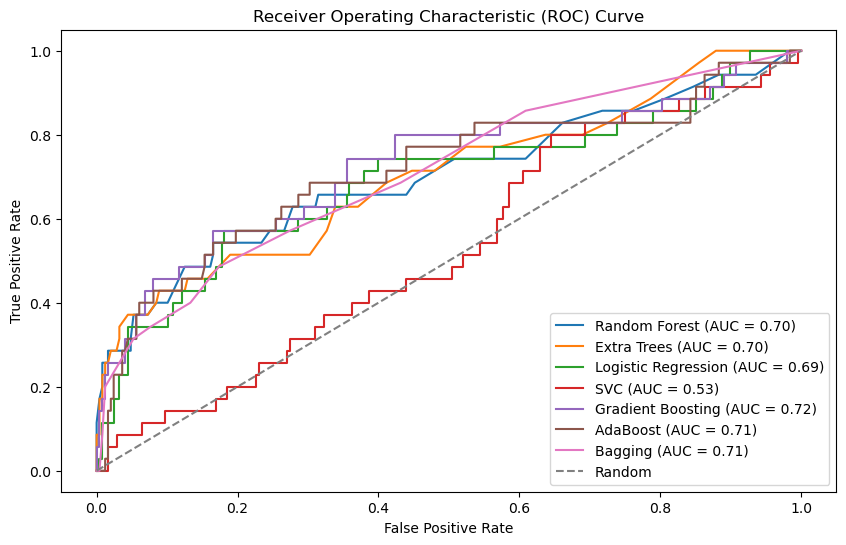

Random Forest: ROC AUC = 0.70
Extra Trees: ROC AUC = 0.70
Logistic Regression: ROC AUC = 0.69
SVC: ROC AUC = 0.53
Gradient Boosting: ROC AUC = 0.72
AdaBoost: ROC AUC = 0.71
Bagging: ROC AUC = 0.71


In [341]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)


classifiers = [
    ("Random Forest", RandomForestClassifier()),
    ("Extra Trees", ExtraTreesClassifier()),
    ("Logistic Regression", LogisticRegression()),
    ("SVC", SVC(probability=True)),  
    ("Gradient Boosting", GradientBoostingClassifier()),
    ("AdaBoost", AdaBoostClassifier()),
    ("Bagging", BaggingClassifier())
]


roc_auc_scores = {}


plt.figure(figsize=(10, 6))
for classifiername, classifier in classifiers:
    classifier.fit(x_train, y_train)
    y_pred_probability = classifier.predict_proba(x_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_probability)
    roc_auc = roc_auc_score(y_test, y_pred_probability)
    roc_auc_scores[classifiername] = roc_auc
    
    plt.plot(fpr, tpr, label=f'{classifiername} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()


for name, roc_auc in roc_auc_scores.items():
    print(f'{name}: ROC AUC = {roc_auc:.2f}')

We can see that our selected has a good Roc AUC PERCENTAGE WITH 71 PERCENT.

Saving the model.

In [ ]:
We will be using the joblib method to save our model and will be comparing the original and predicted values to conclude our project.

In [342]:
import joblib
joblib.dump(Selected_model,"Attrition_Data_Analysis.pkl")

['Attrition_Data_Analysis.pkl']

In [344]:
model = joblib.load("Attrition_Data_Analysis.pkl")
prediction = model.predict(x_test)
prediction

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [345]:
finaldata = np.array(y_test)
subscribertype = pd.DataFrame()
subscribertype["ourprediction"] = prediction
subscribertype["originalvalues"] = finaldata
subscribertype

,ourprediction,originalvalues
0,0.0,0.0
1,0.0,0.0
2,0.0,0.0
3,0.0,0.0
4,0.0,0.0
...,...,...
278,0.0,0.0
279,0.0,0.0
280,0.0,0.0
281,0.0,0.0


We can see our model has fairly done well, and to answer the first part of the question, attrition is good practice to improve the employee output and skills in a company, and hr analytics help us to understand where to improve for proper attrition in order for future recruitment in the company.